In [1]:
import tsai.all
import datetime
import pandas as pd
import torch
import numpy as np
import wandb
from fastai.callback.wandb import WandbCallback
from fastai.callback.tracker import EarlyStoppingCallback, SaveModelCallback
import time
import math

In [2]:
%run ../../shared_functions.py
%run ../../my_shared_functions.py

<Figure size 640x480 with 0 Axes>

In [3]:
DIR_INPUT = '../../../fraud-detection-handbook/simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: total: 531 ms
Wall time: 524 ms
919767 transactions loaded, containing 8195 fraudulent transactions


### Default LSTM

In [4]:
BEGIN_DATE = "2018-08-08"
start_date_training = datetime.datetime.strptime(BEGIN_DATE, "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7


delta_valid = delta_test

(train_df, valid_df)=get_train_test_set(transactions_df,start_date_training,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

(train_df, valid_df)=scaleData(train_df, valid_df,input_features)

SEQ_LEN = 5

In [5]:
train_df.iloc[0]['TX_DATETIME'], train_df.iloc[-1]['TX_DATETIME']

(Timestamp('2018-08-08 00:01:14'), Timestamp('2018-08-14 23:59:43'))

In [6]:
valid_df.iloc[0]['TX_DATETIME'], valid_df.iloc[-1]['TX_DATETIME']

(Timestamp('2018-08-22 00:03:30'), Timestamp('2018-08-28 23:58:38'))

In [7]:
SEED = 42

if torch.cuda.is_available():
    DEVICE = "cuda" 
else:
    DEVICE = "cpu"
print("Selected device is",DEVICE)

seed_everything(SEED)

Selected device is cuda


In [10]:
(train_df, valid_df)=scaleData(train_df, valid_df,input_features)
x_train, y_train = prepare_sequenced_X_y(train_df, SEQ_LEN, input_features, output_feature)
x_valid, y_valid = prepare_sequenced_X_y(valid_df, SEQ_LEN, input_features, output_feature)
X, y, splits = tsai.all.combine_split_data([x_train.numpy(), x_valid.numpy()], [y_train.numpy(), y_valid.numpy()])

#### Fit

In [30]:
config = dict(
    dataset_id = 'fraud-detection-handbook-transformed',
    validation = 'train test split',
    seed = SEED,
    begin_date = BEGIN_DATE,
    delta_train = delta_train,
    delta_delay = delta_delay,
    delta_test = delta_test,
    batch_size=64,
    num_workers=0,
    seq_len=SEQ_LEN,
    hidden_size = 100,
    n_layers = 1,
    rnn_dropout=0,
    bidirectional=False,
    fc_dropout=0,
    optimizer='adam',
    lr=0.0001,
    early_stopping=True,
    early_stopping_patience=2,
    max_epochs=100,
    scale=True,
    criterion='bce',
    one_cycle_policy=False
)
wandb.init(project="mgr-anomaly-tsxai-project", config=config, tags=['lstm', 'tsai', 'imbalance-not-considered'])
config = wandb.config

In [32]:
dsets = tsai.all.TSDatasets(X, y, splits=splits, inplace=True)
dls = tsai.all.TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=config.batch_size, num_workers=config.num_workers, device=DEVICE, drop_last=False)

In [33]:
model = tsai.all.LSTM(dls.vars, dls.c).to(DEVICE)

In [34]:
criterion = tsai.all.BCEWithLogitsLossFlat()
learn = tsai.all.ts_learner(
    dls,
    model,
    loss_func=criterion,
    opt_func=tsai.all.Adam,
    device=torch.device('cuda'),
    lr=config.lr,
    metrics=[],
    model_dir='LSTM',
    cbs=[
        WandbCallback(
            log='all',
            log_model=True,
            seed=config.seed),
        EarlyStoppingCallback(
            patience=config.early_stopping_patience
        ),
        SaveModelCallback(
            fname='lstm_fit'
        )])

start_time=time.time()
learn.fit(config.max_epochs)
training_execution_time=time.time()-start_time

Could not gather input dimensions
WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'FraudSequenceDataset' object has no attribute 'items'


epoch,train_loss,valid_loss,time
0,0.036781,0.032305,00:29
1,0.031044,0.027515,00:30
2,0.027644,0.025547,00:30
3,0.039129,0.024129,00:30
4,0.028858,0.023141,00:30
5,0.027725,0.022264,00:30
6,0.021378,0.021688,00:30
7,0.017244,0.021363,00:30
8,0.026059,0.020841,00:29
9,0.016753,0.020435,00:30


Better model found at epoch 0 with valid_loss value: 0.03230487182736397.
Better model found at epoch 1 with valid_loss value: 0.027514608576893806.
Better model found at epoch 2 with valid_loss value: 0.02554652839899063.
Better model found at epoch 3 with valid_loss value: 0.024129211902618408.
Better model found at epoch 4 with valid_loss value: 0.023140644654631615.
Better model found at epoch 5 with valid_loss value: 0.022264203056693077.
Better model found at epoch 6 with valid_loss value: 0.021688397973775864.
Better model found at epoch 7 with valid_loss value: 0.02136261947453022.
Better model found at epoch 8 with valid_loss value: 0.02084094099700451.
Better model found at epoch 9 with valid_loss value: 0.020434780046343803.
Better model found at epoch 11 with valid_loss value: 0.020115172490477562.
Better model found at epoch 13 with valid_loss value: 0.019943106919527054.
Better model found at epoch 14 with valid_loss value: 0.019729135558009148.
Better model found at epoc

In [35]:
start_time=time.time()
valid_predictions_logits = get_predictions_sequential(learn.model.cuda(), dls.valid)
prediction_execution_time=time.time()-start_time
predictions_df = valid_df
predictions_df['predictions'] = torch.nn.Sigmoid()(torch.FloatTensor(valid_predictions_logits)).numpy()
    
performance_df = performance_assessment_f1_included(predictions_df, top_k_list=[100])
performance_df

,AUC ROC,Average precision,F1 score,Card Precision@100
0,0.894,0.634,0.621,0.297


In [36]:
wandb.log({'Training execution time': training_execution_time})
wandb.log({'Prediction execution time': prediction_execution_time})
wandb.log({'AUC ROC': performance_df.loc[0,'AUC ROC']})
wandb.log({'Average precision': performance_df.loc[0,'Average precision']})
wandb.log({'F1 score': performance_df.loc[0,'F1 score']})
wandb.log({'Card Precision@100': performance_df.loc[0,'Card Precision@100']})
wandb.finish()

AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,█▄▄▃▂▁▂▁▂▁▁▂▁▄▁▄▁▁▁▁▁▁▁▃▁▄▁▁▁▁▅▁▁▂▁▁▁▁▁▁


#### Fit 1 cycle

max_lr => set as the fastest lr decrease point from fastai.lr_find()
min_lr => usually max_lr / 10

Important sources:

https://sgugger.github.io/the-1cycle-policy.html

https://stackoverflow.com/questions/61172627/choosing-the-learning-rate-using-fastais-learn-lr-find

Additional:

https://towardsdatascience.com/finding-good-learning-rate-and-the-one-cycle-policy-7159fe1db5d6

https://stackoverflow.com/questions/67461425/what-is-the-relation-between-a-learning-rate-scheduler-and-an-optimizer

https://fastai1.fast.ai/callbacks.one_cycle.html

In [11]:
config = dict(
    dataset_id = 'fraud-detection-handbook-transformed',
    validation = 'train test split',
    seed = SEED,
    begin_date = BEGIN_DATE,
    delta_train = delta_train,
    delta_delay = delta_delay,
    delta_test = delta_test,
    batch_size=64,
    num_workers=0,
    seq_len=SEQ_LEN,
    hidden_size = 100,
    n_layers = 1,
    rnn_dropout=0,
    bidirectional=False,
    fc_dropout=0,
    optimizer='adam',
    # lr=0.0001, don't pass lr here, it will be retrieved from learner.lr_find method
    early_stopping=True,
    early_stopping_patience=2,
    max_epochs=100,
    scale=True,
    criterion='bce',
    one_cycle_policy=True
)
wandb.init(project="mgr-anomaly-tsxai-project", config=config, tags=['lstm', 'tsai', 'imbalance-not-considered'])
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: chamera (mgr-anomaly-tsxai). Use `wandb login --relogin` to force relogin


In [12]:
dsets = tsai.all.TSDatasets(X, y, splits=splits, inplace=True)
dls = tsai.all.TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=config.batch_size, num_workers=config.num_workers, drop_last=False, device=DEVICE)

In [13]:
model = tsai.all.LSTM(dls.vars, dls.c)

In [23]:
criterion = tsai.all.BCEWithLogitsLossFlat()
learn = tsai.all.ts_learner(
    dls,
    model,
    loss_func=criterion,
    opt_func=tsai.all.Adam,
    device=torch.device('cuda'),
    # lr=config.lr, # don't pass lr here either
    metrics=[],
    model_dir='LSTM',
    cbs=[
        WandbCallback(
            log='all',
            log_model=True,
            seed=config.seed),
        EarlyStoppingCallback(
            patience=config.early_stopping_patience
        ),
        SaveModelCallback(
            fname='lstm_fit_one_cycle'
        )])

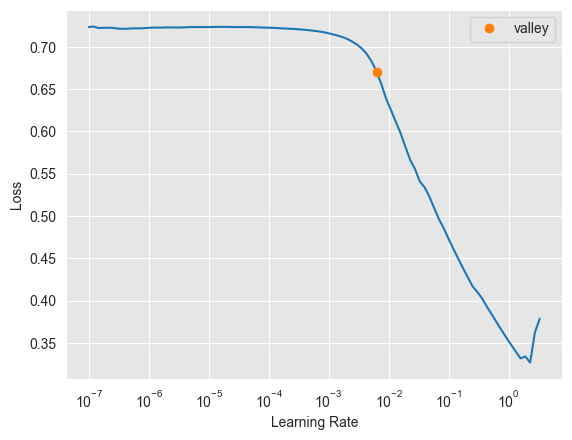

In [24]:
# https://docs.fast.ai/callback.schedule.html#learner.lr_find
lr = learn.lr_find().valley

In [25]:
lr

0.0063095735386013985

In [26]:
wandb.config.update({"lr": lr})

In [27]:
start_time=time.time()
learn.fit_one_cycle(config.max_epochs, lr)
training_execution_time=time.time()-start_time

WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031084,0.027277,00:10
1,0.029010,0.022651,00:10
2,0.019611,0.020577,00:10
3,0.020418,0.021559,00:11
4,0.023446,0.019923,00:10
5,0.023322,0.020479,00:10
6,0.026815,0.019514,00:10
7,0.019930,0.019277,00:10
8,0.019376,0.017928,00:10
9,0.017969,0.022502,00:10


Better model found at epoch 0 with valid_loss value: 0.02727711759507656.
Better model found at epoch 1 with valid_loss value: 0.022650595754384995.
Better model found at epoch 2 with valid_loss value: 0.02057662233710289.
Better model found at epoch 4 with valid_loss value: 0.01992342807352543.
Better model found at epoch 6 with valid_loss value: 0.019514258950948715.
Better model found at epoch 7 with valid_loss value: 0.019277412444353104.
Better model found at epoch 8 with valid_loss value: 0.017927614971995354.
No improvement since epoch 8: early stopping


In [28]:
start_time=time.time()
valid_predictions_logits = get_predictions_sequential(learn.model.cuda(), dls.valid)
prediction_execution_time=time.time()-start_time
predictions_df = valid_df
predictions_df['predictions'] = torch.nn.Sigmoid()(torch.FloatTensor(valid_predictions_logits)).numpy()
    
performance_df = performance_assessment_f1_included(predictions_df, top_k_list=[100])
performance_df

,AUC ROC,Average precision,F1 score,Card Precision@100
0,0.891,0.681,0.67,0.307


In [29]:
wandb.log({'Training execution time': training_execution_time})
wandb.log({'Prediction execution time': prediction_execution_time})
wandb.log({'AUC ROC': performance_df.loc[0,'AUC ROC']})
wandb.log({'Average precision': performance_df.loc[0,'Average precision']})
wandb.log({'F1 score': performance_df.loc[0,'F1 score']})
wandb.log({'Card Precision@100': performance_df.loc[0,'Card Precision@100']})
wandb.finish()

AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇██
mom_0,██████████▇▇▇▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
raw_loss,█▅▁▁▂▁▅▁▁▁▁▁▁▁▂▁▁▂▁▁▁▁▁▅▁▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁


### Sweeps

In [4]:
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7
delta_valid = delta_test

n_folds=4

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)
delta_assessment = delta_valid

In [5]:
SEED = 42
seed_everything(SEED)

prequential_split = []
        
for fold in range(n_folds):
    start_date_training_fold = start_date_training-datetime.timedelta(days=fold*delta_assessment)
    
    (train_df, test_df)=get_train_test_set(transactions_df,
                                            start_date_training=start_date_training_fold,
                                            delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_assessment)
    
    prequential_split.append((train_df, test_df))

In [6]:
SEQ_LEN = 5
if torch.cuda.is_available():
    DEVICE = "cuda" 
else:
    DEVICE = "cpu"
print("Selected device is",DEVICE)

Selected device is cuda


#### Fit 

Rules of Thumb: with 60 iterations, 95% of the time, best 5% sets of parameters can be found, regardless of grid size.

Simple Math Proving:

Let’s denote n as the number of iterations.

After n iterations, probability of none of the best p% sets of parameters is drawn from the grid is (1-p)ⁿ

Therefore, probability of at least one of the best p% sets of parameters is drawn from the grid after n iterations is 1-(1-p)ⁿ

If we want to have the best 5% sets of parameters with 95% confidence, solving the above equation, 1-(1–5%)ⁿ = 95%, n ≈ 59

In [10]:
sweep_config = {
                'method': 'random', 
                'metric': {
                    'goal': 'minimize',
                    'name': 'val_loss'
                    },
                'parameters': {
                    'batch_size': {
                        'values' : [64, 128, 256]
                    },
                    'max_epochs': {
                        'values': [5, 10, 20, 30, 40]
                        },
                    'num_workers': {
                        'value' : 0
                    },
                    'lr': {
                        'values' : [0.0001, 0.0002, 0.001]
                    },
                    'seed': {
                        'value' : 42
                    },
                    'hidden_size': {
                        'values' : [100, 200]
                    },
                    'n_layers': {
                        'values' : [1, 2]
                    },
                    'rnn_dropout': {
                        'values' : [0, 0.2, 0.4]
                    },
                    'fc_dropout': {
                        'values' : [0, 0.2, 0.4]
                    },
                }
 }

In [11]:
sweep_id = wandb.sweep(sweep_config, project="mgr-anomaly-tsxai-project")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Create sweep with ID: ugugz6j0
Sweep URL: https://wandb.ai/mgr-anomaly-tsxai/mgr-anomaly-tsxai-project/sweeps/ugugz6j0


In [12]:
def train(config=None):
    with wandb.init(project="mgr-anomaly-tsxai-project", config=config, tags=['lstm', 'tsai', 'imbalance-not-considered', 'sweeps']):
        config = wandb.config
        training_execution_times = []
        prediction_execution_times = []
        aucs = []
        average_precisions = []
        f1_scores = []
        card_precisions = []
        for i in range(n_folds):
            train_df = prequential_split[i][0]
            valid_df = prequential_split[i][1]
            (train_df, valid_df)=scaleData(train_df, valid_df,input_features)
            x_train, y_train = prepare_sequenced_X_y(train_df, SEQ_LEN, input_features, output_feature)
            x_valid, y_valid = prepare_sequenced_X_y(valid_df, SEQ_LEN, input_features, output_feature)
            X, y, tsai_splits = tsai.all.combine_split_data([x_train.numpy(), x_valid.numpy()], [y_train.numpy(), y_valid.numpy()])
            dsets = tsai.all.TSDatasets(X, y, splits=tsai_splits, inplace=True)
            dls = tsai.all.TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=config.batch_size, num_workers=config.num_workers, device=DEVICE, drop_last=False)
            
            model = tsai.all.LSTM(
                c_in=dls.vars,
                c_out=dls.c,
                hidden_size=config.hidden_size,
                n_layers=config.n_layers,
                rnn_dropout=config.rnn_dropout,
                fc_dropout=config.fc_dropout)
            
            criterion = tsai.all.BCEWithLogitsLossFlat()
            model = tsai.all.LSTM(
                c_in=x_train.shape[1],
                c_out=1,
                hidden_size=config.hidden_size,
                n_layers=config.n_layers,
                rnn_dropout=config.rnn_dropout,
                fc_dropout=config.fc_dropout).to(DEVICE)
            
            criterion = tsai.all.BCEWithLogitsLossFlat()
            learn = tsai.all.ts_learner(
                dls,
                model,
                loss_func=criterion,
                opt_func=tsai.all.Adam,
                device=DEVICE,
                lr=config.lr,
                metrics=[],
                model_dir='LSTM',
                # no early stopping for multiple folds validation!
                cbs=[
                    WandbCallback(
                        log=None,
                        log_model=False,
                        seed=config.seed)])

            start_time=time.time()
            learn.fit(config.max_epochs)
            training_execution_times.append(time.time()-start_time)

            start_time=time.time()
            valid_predictions_logits = get_predictions_sequential(learn.model.cuda(), dls.valid)
            prediction_execution_time=time.time()-start_time
            predictions_df = valid_df
            predictions_df['predictions'] = torch.nn.Sigmoid()(torch.FloatTensor(valid_predictions_logits)).numpy()
                
            performance_df = performance_assessment_f1_included(predictions_df, top_k_list=[100])
            aucs.append(performance_df.loc[0,'AUC ROC'])
            average_precisions.append(performance_df.loc[0,'Average precision'])
            f1_scores.append(performance_df.loc[0,'F1 score'])
            card_precisions.append(performance_df.loc[0,'Card Precision@100'])

        wandb.log({'Training execution time': np.sum(training_execution_times) / n_folds})
        wandb.log({'Prediction execution time': np.sum(prediction_execution_times) / n_folds})
        wandb.log({'AUC ROC': np.sum(aucs) / n_folds})
        wandb.log({'Average precision': np.sum(average_precisions) / n_folds})
        wandb.log({'F1 score': np.sum(f1_scores) / n_folds})
        wandb.log({'Card Precision@100': np.sum(card_precisions) / n_folds})

In [13]:
wandb.agent(sweep_id, train, count=60)

wandb: Agent Starting Run: ul176c18 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 40
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: chamera (mgr-anomaly-tsxai). Use `wandb login --relogin` to force relogin
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043835,0.036326,00:07
1,0.043186,0.028706,00:06
2,0.032290,0.024373,00:06
3,0.027913,0.022897,00:06
4,0.028349,0.021826,00:06
5,0.022211,0.021255,00:06
6,0.029329,0.020404,00:07
7,0.020668,0.020234,00:06
8,0.023688,0.019995,00:07
9,0.019732,0.019805,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043864,0.038954,00:07
1,0.039466,0.032085,00:07
2,0.027787,0.026618,00:07
3,0.028301,0.025040,00:07
4,0.024178,0.023507,00:07
5,0.023102,0.022622,00:07
6,0.020639,0.022452,00:07
7,0.021881,0.021431,00:07
8,0.019120,0.021686,00:07
9,0.023129,0.021247,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050754,0.035388,00:07
1,0.037924,0.028622,00:07
2,0.030268,0.024653,00:07
3,0.028921,0.023249,00:07
4,0.026644,0.021753,00:07
5,0.029575,0.021028,00:07
6,0.026970,0.020536,00:07
7,0.025631,0.020508,00:07
8,0.021362,0.020043,00:07
9,0.027555,0.019805,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048932,0.034578,00:07
1,0.040753,0.028163,00:07
2,0.027703,0.023225,00:07
3,0.037272,0.021882,00:07
4,0.024574,0.020059,00:07
5,0.028116,0.019842,00:07
6,0.021266,0.018515,00:07
7,0.022990,0.018082,00:07
8,0.021908,0.017891,00:07
9,0.025600,0.018270,00:07


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▇▂▁▂▁▃▃▄▁▁▄▁▁▄▁▂▅▁▅▃▇▁▁▁▃▁▂▁▁▁█▁▁▂▂▂▁▁▁▁


wandb: Agent Starting Run: f4dpynui with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043829,0.035982,00:06
1,0.032919,0.027146,00:07
2,0.030020,0.023832,00:07
3,0.028183,0.022736,00:07
4,0.026322,0.021283,00:06
5,0.025681,0.020724,00:06
6,0.022026,0.020128,00:07
7,0.018982,0.019905,00:06
8,0.021479,0.019875,00:06
9,0.021600,0.019702,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044010,0.039061,00:06
1,0.034125,0.031505,00:06
2,0.026175,0.026155,00:05
3,0.022630,0.024208,00:06
4,0.025527,0.023181,00:06
5,0.020458,0.022223,00:06
6,0.022964,0.021577,00:05
7,0.021915,0.021309,00:06
8,0.021574,0.021074,00:05
9,0.038828,0.021051,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043095,0.034962,00:05
1,0.038315,0.028256,00:05
2,0.028950,0.024621,00:05
3,0.036585,0.024113,00:05
4,0.029579,0.021537,00:05
5,0.028747,0.020784,00:05
6,0.021803,0.020065,00:05
7,0.023454,0.019989,00:05
8,0.024618,0.020012,00:05
9,0.023393,0.019875,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041559,0.033369,00:06
1,0.038831,0.027214,00:06
2,0.028501,0.022776,00:06
3,0.026327,0.020887,00:06
4,0.024766,0.019605,00:06
5,0.024278,0.018448,00:06
6,0.024476,0.018160,00:05
7,0.019394,0.017740,00:05
8,0.018913,0.017728,00:05
9,0.025446,0.018943,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▁▂▁▁▄█▇▁▁▅▄▁▁▁▁▁▁▂▁▅▁▁▄▁▂▃▂▁▁▂▁▃▄▂▁▁▄▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: b4wv15i9 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040216,0.032430,00:11
1,0.026558,0.024338,00:11
2,0.023239,0.022436,00:12
3,0.026651,0.021077,00:12
4,0.022418,0.020344,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035197,0.035071,00:11
1,0.021505,0.026749,00:11
2,0.022104,0.024508,00:12
3,0.014675,0.023304,00:12
4,0.018412,0.022108,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037724,0.030690,00:11
1,0.037945,0.024224,00:12
2,0.025490,0.022199,00:12
3,0.023379,0.021047,00:12
4,0.021647,0.020257,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035789,0.028883,00:11
1,0.046393,0.023607,00:12
2,0.029750,0.020735,00:12
3,0.025032,0.019963,00:12
4,0.019521,0.018390,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▁▁▁▁▁▁▁▁▂▄█▁▁▂▁▅▁▁▃▁▁▃▄▁▃▁▁▁▁▁▁▂▁▁▁▂▂▁▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: zcter8sm with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032652,0.027043,00:09
1,0.031859,0.024599,00:09
2,0.028326,0.022341,00:09
3,0.025921,0.021566,00:08
4,0.022338,0.020895,00:08
5,0.023061,0.020256,00:09
6,0.020058,0.020356,00:09
7,0.017932,0.020045,00:08
8,0.019161,0.020002,00:08
9,0.026446,0.019876,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035427,0.028475,00:08
1,0.030096,0.025303,00:09
2,0.026392,0.023378,00:08
3,0.022257,0.022426,00:08
4,0.026600,0.021828,00:08
5,0.015534,0.021854,00:08
6,0.018895,0.021326,00:08
7,0.022483,0.021047,00:08
8,0.021710,0.020835,00:08
9,0.018653,0.021351,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030522,0.026348,00:09
1,0.038962,0.023883,00:08
2,0.032346,0.022190,00:08
3,0.029417,0.021430,00:07
4,0.024342,0.020361,00:08
5,0.031133,0.020238,00:09
6,0.024679,0.019897,00:08
7,0.025283,0.019818,00:08
8,0.030601,0.020027,00:08
9,0.020074,0.019457,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036972,0.026084,00:08
1,0.022218,0.022902,00:08
2,0.025529,0.021029,00:08
3,0.022519,0.019398,00:07
4,0.024689,0.018388,00:08
5,0.020981,0.017987,00:08
6,0.020671,0.018027,00:08
7,0.021732,0.018173,00:08
8,0.025479,0.017872,00:08
9,0.025214,0.017754,00:08


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▅▃▃▂▁▁▁▁▄▁▁▁▁▁▁▁▄▁▁▁▄▄▅▁▁▁▁▁▁▁▂▂█▁▁▁▁▁▁▁


wandb: Agent Starting Run: 35soxspg with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 30
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024718,0.021634,00:09
1,0.023812,0.020192,00:09
2,0.024959,0.020652,00:08
3,0.017375,0.020368,00:08
4,0.018901,0.019766,00:10
5,0.019330,0.019562,00:09
6,0.027308,0.019542,00:09
7,0.021588,0.019001,00:09
8,0.017095,0.018791,00:09
9,0.018193,0.018556,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026300,0.022934,00:09
1,0.024574,0.020916,00:09
2,0.019122,0.020320,00:09
3,0.017201,0.019884,00:08
4,0.033692,0.019854,00:08
5,0.012906,0.020617,00:10
6,0.015758,0.020040,00:09
7,0.015949,0.019567,00:09
8,0.019978,0.020175,00:09
9,0.018451,0.019312,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026133,0.020539,00:09
1,0.023455,0.020396,00:09
2,0.027582,0.020202,00:10
3,0.024259,0.020585,00:09
4,0.023317,0.018595,00:08
5,0.015322,0.019664,00:08
6,0.020896,0.018597,00:09
7,0.025388,0.018303,00:09
8,0.020140,0.018506,00:09
9,0.012806,0.018759,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024001,0.018816,00:08
1,0.020338,0.018633,00:09
2,0.020545,0.018307,00:09
3,0.020896,0.018039,00:09
4,0.019267,0.017951,00:09
5,0.014568,0.017049,00:09
6,0.024477,0.017058,00:08
7,0.016184,0.018781,00:08
8,0.020724,0.016740,00:09
9,0.013959,0.017048,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,█▁▁▁▃▁▁▅▁▁▂▁█▁▁▁▁▁▁▁▅▂▁▁▂▁▁▁▁▁▇▁▃▁▆▁▁▁▁▁


wandb: Agent Starting Run: 62t8b8xr with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	lr: 0.0001
wandb: 	max_epochs: 40
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048478,0.031054,00:08
1,0.037471,0.026651,00:08
2,0.028007,0.024484,00:08
3,0.033610,0.023557,00:09
4,0.023086,0.022731,00:08
5,0.024653,0.022069,00:08
6,0.026690,0.021583,00:08
7,0.022244,0.021092,00:07
8,0.027942,0.020844,00:08
9,0.027673,0.020622,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036925,0.032887,00:08
1,0.031451,0.028669,00:08
2,0.030090,0.026497,00:07
3,0.023759,0.025209,00:08
4,0.031178,0.024637,00:09
5,0.026549,0.023594,00:08
6,0.020343,0.023045,00:08
7,0.022794,0.022429,00:08
8,0.027045,0.022009,00:08
9,0.026792,0.021686,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036531,0.031493,00:08
1,0.038413,0.027372,00:08
2,0.037027,0.025094,00:08
3,0.034748,0.024079,00:08
4,0.028453,0.023019,00:08
5,0.020188,0.022145,00:09
6,0.026779,0.021520,00:08
7,0.029528,0.021127,00:08
8,0.021557,0.020635,00:08
9,0.021252,0.020333,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043469,0.029014,00:09
1,0.032497,0.024959,00:08
2,0.033722,0.023370,00:08
3,0.030096,0.022167,00:08
4,0.027703,0.021104,00:08
5,0.022698,0.020261,00:07
6,0.021436,0.019734,00:08
7,0.026423,0.019170,00:09
8,0.026192,0.018921,00:08
9,0.022991,0.018504,00:08


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▁▁▁▁█▇▁▁▁▅▁▁▁▁▁▄▁▁▁▃▁▁▁▂▁▁▅▁▅▇▂▁▁▂▆▁▁▃▁


wandb: Agent Starting Run: nfhhb04u with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034773,0.029569,00:04
1,0.033433,0.025259,00:04
2,0.026509,0.023088,00:04
3,0.024718,0.022233,00:04
4,0.025418,0.021411,00:04
5,0.022393,0.020756,00:04
6,0.022732,0.020529,00:04
7,0.025819,0.020428,00:04
8,0.026262,0.020934,00:04
9,0.021833,0.020087,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033522,0.030264,00:04
1,0.030296,0.026472,00:04
2,0.023448,0.024638,00:04
3,0.026094,0.023362,00:04
4,0.023580,0.022686,00:04
5,0.022476,0.021836,00:04
6,0.023249,0.021515,00:04
7,0.018298,0.021387,00:04
8,0.019779,0.021259,00:04
9,0.020359,0.021024,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035466,0.029133,00:04
1,0.034784,0.025217,00:04
2,0.022990,0.022955,00:04
3,0.028093,0.021608,00:04
4,0.022783,0.020709,00:04
5,0.025478,0.020595,00:04
6,0.022250,0.019809,00:04
7,0.021361,0.019727,00:04
8,0.024310,0.019476,00:04
9,0.025477,0.020124,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036968,0.027721,00:04
1,0.034904,0.024001,00:04
2,0.028695,0.021791,00:04
3,0.018981,0.020414,00:04
4,0.023172,0.019468,00:04
5,0.023496,0.018504,00:04
6,0.022134,0.018264,00:04
7,0.024558,0.018038,00:04
8,0.019271,0.017993,00:04
9,0.022246,0.017593,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▂▁▁▁▁▂▃▁▁█▁▃▁▄▂▁▁▃▁▄▄▁▂▁▂▃▁▂▁▄▂▃▂▄▁▁▃▁▁


wandb: Agent Starting Run: 04vot96k with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.087857,0.035149,00:02
1,0.037788,0.030705,00:02
2,0.037308,0.027667,00:02
3,0.031658,0.025853,00:02
4,0.030644,0.024936,00:02
5,0.032990,0.024285,00:02
6,0.029221,0.023472,00:02
7,0.025998,0.022915,00:02
8,0.029161,0.022499,00:02
9,0.026261,0.022150,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.095390,0.038079,00:02
1,0.038344,0.033027,00:02
2,0.031495,0.029403,00:02
3,0.027848,0.027532,00:02
4,0.029406,0.026333,00:02
5,0.027321,0.025586,00:02
6,0.026142,0.024925,00:02
7,0.024296,0.024572,00:02
8,0.023562,0.023744,00:02
9,0.024401,0.023450,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.104314,0.036288,00:02
1,0.041673,0.030480,00:02
2,0.035369,0.027208,00:02
3,0.034667,0.025789,00:02
4,0.034910,0.024775,00:02
5,0.030534,0.024003,00:02
6,0.030046,0.023348,00:02
7,0.028725,0.022863,00:02
8,0.027217,0.022373,00:02
9,0.027106,0.022052,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.101309,0.034806,00:02
1,0.042242,0.029204,00:02
2,0.034419,0.025972,00:02
3,0.029458,0.024254,00:02
4,0.030537,0.023499,00:02
5,0.028521,0.022529,00:02
6,0.029336,0.022232,00:02
7,0.026822,0.021654,00:02
8,0.027210,0.020838,00:02
9,0.029329,0.020892,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▂▂▂▁▂▁▁▁▁█▂▁▂▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▆▂▁▁▁▂▁▁▁▁


wandb: Agent Starting Run: cb8zsajc with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035543,0.023783,00:02
1,0.024048,0.021604,00:02
2,0.025572,0.021008,00:02
3,0.021187,0.021062,00:02
4,0.024115,0.020017,00:02
5,0.023234,0.020079,00:02
6,0.021792,0.019538,00:02
7,0.022289,0.019460,00:02
8,0.021204,0.019587,00:02
9,0.019069,0.019497,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028548,0.025824,00:02
1,0.021475,0.022741,00:02
2,0.018464,0.022371,00:02
3,0.019744,0.020758,00:02
4,0.019306,0.021735,00:02
5,0.019359,0.022387,00:02
6,0.018268,0.020624,00:02
7,0.018492,0.020587,00:02
8,0.017096,0.020800,00:02
9,0.017299,0.019969,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035415,0.024215,00:02
1,0.027059,0.021602,00:02
2,0.022599,0.020064,00:02
3,0.025221,0.019908,00:02
4,0.024869,0.019854,00:02
5,0.024826,0.019071,00:02
6,0.022906,0.019575,00:02
7,0.020463,0.018920,00:02
8,0.022875,0.018741,00:02
9,0.022959,0.018766,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033618,0.022432,00:02
1,0.026545,0.018911,00:02
2,0.024630,0.018301,00:02
3,0.022858,0.017681,00:02
4,0.022741,0.018037,00:02
5,0.019825,0.017851,00:02
6,0.022108,0.017613,00:02
7,0.021684,0.017535,00:02
8,0.018753,0.017144,00:02
9,0.018950,0.017125,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▅▅▃▁▇▃█▁▄▁▂▂▃▇▄▃▂▂▁▁▄█▂▂▃▅▂▂▅▁▇▁▂▁▂▂▁▄▅▁


wandb: Agent Starting Run: apubk3n1 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051168,0.036209,00:06
1,0.033172,0.027289,00:05
2,0.031606,0.023990,00:05
3,0.027737,0.022814,00:05
4,0.021831,0.021728,00:05
5,0.024335,0.020989,00:06
6,0.024548,0.020599,00:05
7,0.025409,0.020351,00:06
8,0.024197,0.020195,00:06
9,0.024789,0.020090,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046770,0.038432,00:06
1,0.036331,0.030932,00:05
2,0.029116,0.025990,00:05
3,0.027611,0.024654,00:05
4,0.023694,0.023230,00:05
5,0.022520,0.022403,00:06
6,0.021871,0.021737,00:05
7,0.020279,0.021712,00:05
8,0.023347,0.021336,00:06
9,0.019646,0.021531,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045714,0.035306,00:06
1,0.042773,0.028342,00:05
2,0.036130,0.024558,00:05
3,0.029289,0.022831,00:05
4,0.027197,0.021778,00:06
5,0.029544,0.020705,00:06
6,0.023901,0.020214,00:06
7,0.024226,0.019847,00:06
8,0.026086,0.019844,00:06
9,0.023404,0.019814,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046390,0.034176,00:06
1,0.036005,0.027122,00:06
2,0.032773,0.023452,00:06
3,0.034796,0.021791,00:05
4,0.025376,0.020065,00:06
5,0.025341,0.019060,00:06
6,0.025042,0.018375,00:06
7,0.024873,0.018404,00:06
8,0.025123,0.018160,00:06
9,0.021256,0.017589,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▅▂▁▂▂▁▁▁▁▁▂▄▆▂▃█▂▁▅▁▁▃▅▁▃▆▂▁▁▅█▅▅▂▅▂▁▁▁▂


wandb: Agent Starting Run: fosco6e6 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031820,0.023355,00:03
1,0.026900,0.021943,00:03
2,0.021277,0.020755,00:03
3,0.024460,0.019541,00:03
4,0.020005,0.020144,00:03
5,0.017697,0.019813,00:03
6,0.017565,0.020021,00:03
7,0.019896,0.018909,00:03
8,0.020853,0.022037,00:03
9,0.020082,0.018379,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033532,0.024663,00:03
1,0.025571,0.025056,00:03
2,0.019921,0.021404,00:03
3,0.019664,0.020981,00:03
4,0.021330,0.019705,00:03
5,0.018580,0.019816,00:03
6,0.037556,0.019282,00:03
7,0.018534,0.019040,00:03
8,0.018113,0.019314,00:03
9,0.015709,0.019493,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033571,0.024944,00:03
1,0.027600,0.021723,00:03
2,0.025951,0.019772,00:03
3,0.021749,0.019056,00:03
4,0.023215,0.020168,00:03
5,0.021324,0.018523,00:03
6,0.024051,0.017711,00:03
7,0.020074,0.019199,00:03
8,0.021759,0.018879,00:03
9,0.019649,0.017518,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034199,0.021982,00:03
1,0.027056,0.019070,00:03
2,0.024763,0.017953,00:03
3,0.021106,0.016829,00:03
4,0.019679,0.016877,00:03
5,0.019483,0.017130,00:03
6,0.018714,0.016704,00:03
7,0.018829,0.017351,00:03
8,0.020628,0.016609,00:03
9,0.018414,0.016747,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▂▄▅▁▄▁▁▁▁▃▄▂▆▁▁▁▁▁▁▁▅█▁▂▁▁▁▃▁▄▂▃▂▁▂▁▄▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: jk0t1v30 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043666,0.035711,00:05
1,0.031840,0.024982,00:05
2,0.026766,0.022423,00:05
3,0.022830,0.020964,00:05
4,0.021121,0.020393,00:05
5,0.020369,0.020033,00:05
6,0.021688,0.019599,00:05
7,0.024567,0.019446,00:05
8,0.023770,0.019817,00:05
9,0.022980,0.019466,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039561,0.037107,00:05
1,0.037527,0.027257,00:05
2,0.025042,0.024478,00:05
3,0.019630,0.023030,00:05
4,0.023060,0.021967,00:05
5,0.018541,0.021451,00:05
6,0.021260,0.021043,00:05
7,0.020051,0.021036,00:05
8,0.037209,0.020506,00:05
9,0.019278,0.020320,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047056,0.034298,00:05
1,0.033737,0.025589,00:05
2,0.028953,0.022861,00:05
3,0.025228,0.020995,00:05
4,0.031946,0.021819,00:05
5,0.024367,0.019559,00:05
6,0.026265,0.019235,00:05
7,0.021906,0.019194,00:05
8,0.020647,0.019188,00:05
9,0.021209,0.018807,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043960,0.033142,00:05
1,0.038770,0.024306,00:05
2,0.027659,0.020875,00:05
3,0.024936,0.018983,00:05
4,0.028939,0.017888,00:05
5,0.027129,0.018497,00:05
6,0.023277,0.019014,00:05
7,0.021741,0.017394,00:05
8,0.020692,0.016991,00:05
9,0.020701,0.017100,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▅▁▁▃█▂▃▁▄▂▃▁▁▂▁▁▁▁▁▅▆▃▁▁▄▄▃▂▄▄▁▁▃▁▄▁▄▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: uzp7oouu with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030636,0.022690,00:06
1,0.020914,0.020305,00:06
2,0.019611,0.019529,00:06
3,0.022752,0.019086,00:06
4,0.018538,0.019538,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025727,0.023968,00:06
1,0.021749,0.022435,00:06
2,0.020179,0.021086,00:06
3,0.017743,0.020321,00:06
4,0.021613,0.019904,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031579,0.021502,00:06
1,0.020984,0.019590,00:06
2,0.022187,0.020213,00:06
3,0.022478,0.018580,00:06
4,0.023455,0.018106,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031497,0.021081,00:06
1,0.023553,0.017845,00:06
2,0.020064,0.018377,00:06
3,0.020917,0.018738,00:06
4,0.018808,0.016465,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▃▁▁▁▁▁▁▂▁▂▃▁▂▁▁▄▁▁▄▁█▂▁▁▁▁▁▃▁▅▁▂▁▁▁▁▁▁▁▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 29ioq5ds with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.022023,0.022802,00:05
1,0.027789,0.024400,00:05
2,0.023633,0.020151,00:05
3,0.022272,0.019603,00:05
4,0.022829,0.018982,00:05
5,0.016917,0.020733,00:05
6,0.014666,0.019821,00:05
7,0.022305,0.018994,00:05
8,0.014237,0.018796,00:05
9,0.017599,0.018734,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024014,0.023252,00:05
1,0.017363,0.022546,00:05
2,0.022853,0.020883,00:05
3,0.017789,0.020622,00:05
4,0.019072,0.020188,00:05
5,0.017933,0.020079,00:05
6,0.019939,0.020176,00:05
7,0.019514,0.019204,00:05
8,0.015509,0.020222,00:05
9,0.015324,0.019399,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028304,0.021445,00:05
1,0.025226,0.019780,00:05
2,0.025610,0.019189,00:05
3,0.023423,0.019298,00:05
4,0.024163,0.018964,00:05
5,0.018297,0.018577,00:05
6,0.020085,0.018429,00:05
7,0.018283,0.018211,00:05
8,0.022511,0.018172,00:05
9,0.017814,0.018148,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027426,0.021153,00:05
1,0.024180,0.019696,00:05
2,0.024126,0.018139,00:05
3,0.020930,0.017253,00:05
4,0.016969,0.017446,00:05
5,0.021860,0.017238,00:05
6,0.017254,0.017137,00:05
7,0.019276,0.017019,00:05
8,0.016122,0.016566,00:05
9,0.019368,0.016643,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▂▁▂▁▆▁▆▁▁▂▁▁▁▁▇▁▅▁▁▂█▃▅▃▁▂▁▁▃▃▁▁▁▁▂▁▁▁▁


wandb: Agent Starting Run: od7mpvtv with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.0001
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049404,0.035644,00:11
1,0.030701,0.026398,00:11
2,0.028881,0.023384,00:11
3,0.023377,0.022008,00:11
4,0.025541,0.020990,00:11
5,0.025794,0.020465,00:11
6,0.022524,0.020100,00:11
7,0.030350,0.019811,00:11
8,0.020404,0.019615,00:11
9,0.022298,0.019502,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.055316,0.038399,00:11
1,0.029303,0.029085,00:11
2,0.031645,0.025108,00:11
3,0.027758,0.023581,00:11
4,0.021346,0.022820,00:11
5,0.022190,0.021959,00:11
6,0.017951,0.021822,00:11
7,0.016062,0.021569,00:11
8,0.019328,0.021726,00:11
9,0.019100,0.021083,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051431,0.035663,00:11
1,0.028723,0.026512,00:11
2,0.024935,0.023675,00:11
3,0.030148,0.021969,00:11
4,0.026776,0.020780,00:11
5,0.029966,0.020083,00:11
6,0.023354,0.019872,00:11
7,0.022138,0.019515,00:11
8,0.033705,0.019339,00:11
9,0.028060,0.019378,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037350,0.032644,00:11
1,0.030994,0.025085,00:11
2,0.031874,0.022545,00:12
3,0.027694,0.020470,00:11
4,0.027854,0.019257,00:11
5,0.024368,0.018435,00:11
6,0.023126,0.018071,00:11
7,0.027916,0.017756,00:11
8,0.023229,0.017777,00:11
9,0.018343,0.017567,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▆▁▁▁▁▁▇▄▁▁▃▁▁▁▁▁▁▂▁▁▂█▁▁▅▁▁▇▇▁▁▁▁▁▁▁▁█▁▂


wandb: Agent Starting Run: pvojnj92 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 40
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024802,0.022043,00:12
1,0.025132,0.020485,00:11
2,0.018175,0.021064,00:12
3,0.028975,0.021213,00:12
4,0.017444,0.019909,00:12
5,0.018045,0.020897,00:12
6,0.017294,0.019198,00:12
7,0.021006,0.018910,00:12
8,0.015327,0.019699,00:12
9,0.024044,0.018836,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023016,0.024156,00:12
1,0.012823,0.023210,00:12
2,0.021087,0.020039,00:12
3,0.018208,0.021463,00:12
4,0.017929,0.019503,00:12
5,0.020841,0.019049,00:12
6,0.016866,0.019375,00:12
7,0.013026,0.019324,00:12
8,0.026215,0.022577,00:12
9,0.033490,0.019656,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028796,0.020841,00:12
1,0.028550,0.018916,00:12
2,0.025402,0.019998,00:12
3,0.023467,0.018674,00:12
4,0.022656,0.017747,00:12
5,0.017936,0.019522,00:12
6,0.021891,0.018371,00:12
7,0.020507,0.017784,00:12
8,0.016465,0.019387,00:12
9,0.017345,0.018381,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026875,0.018585,00:12
1,0.020825,0.017076,00:12
2,0.019093,0.016735,00:12
3,0.020162,0.019030,00:12
4,0.017559,0.016547,00:12
5,0.022184,0.016821,00:12
6,0.014018,0.016795,00:12
7,0.015622,0.017181,00:12
8,0.018491,0.018056,00:12
9,0.021049,0.017458,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▁▁▁▁▁▅▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁▄▁▂▁▁▁▃▁▁▁▁▄▁█▁▃▁▁


wandb: Agent Starting Run: qckot6bl with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.001
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.020610,0.021067,00:09
1,0.031627,0.020691,00:09
2,0.022293,0.018980,00:09
3,0.019519,0.018934,00:09
4,0.021620,0.021724,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.014389,0.022834,00:09
1,0.017596,0.021069,00:09
2,0.019393,0.019801,00:09
3,0.020005,0.019985,00:09
4,0.017330,0.019249,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023367,0.020614,00:09
1,0.031449,0.019856,00:09
2,0.017005,0.019436,00:09
3,0.019827,0.020818,00:09
4,0.016887,0.018066,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.021690,0.018677,00:09
1,0.021240,0.017456,00:09
2,0.025034,0.017337,00:09
3,0.022030,0.016854,00:09
4,0.027158,0.018022,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▆▁▁▂▆▁▆▁▃▁▁▁▁▁▁▂▁▁▁▁▂▅▅▁▂▁▄█▁▁▁▇▁▁▄▁▇▁▁▁


wandb: Agent Starting Run: mmzydgsy with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	lr: 0.0001
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049311,0.033985,00:04
1,0.040036,0.029456,00:04
2,0.033520,0.026571,00:04
3,0.029859,0.025136,00:04
4,0.031812,0.024381,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042010,0.035125,00:04
1,0.030633,0.030527,00:04
2,0.028332,0.028033,00:04
3,0.028907,0.026673,00:04
4,0.027217,0.025909,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046489,0.033167,00:05
1,0.038553,0.028429,00:04
2,0.031516,0.026038,00:04
3,0.037916,0.025369,00:04
4,0.022723,0.024051,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044191,0.032280,00:04
1,0.036882,0.027732,00:04
2,0.036360,0.025358,00:04
3,0.036292,0.024024,00:04
4,0.028254,0.022618,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,█▁▂▁▁▂▁▁▁▁█▂▂▁▁▁▁▁▁▂▇▁▂▁▁▁▁▁▂▁█▂▁▂▁▁▁▁▁▁


wandb: Agent Starting Run: tjzqrxfr with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	lr: 0.0001
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035333,0.030002,00:09
1,0.035129,0.025896,00:09
2,0.026680,0.023887,00:09
3,0.023901,0.022844,00:09
4,0.020874,0.022027,00:09
5,0.026958,0.021405,00:09
6,0.023373,0.020850,00:09
7,0.022926,0.020570,00:09
8,0.024576,0.020393,00:09
9,0.024103,0.020332,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036094,0.032626,00:09
1,0.027815,0.027751,00:09
2,0.025273,0.025781,00:09
3,0.029645,0.024513,00:09
4,0.024312,0.023732,00:09
5,0.017800,0.023372,00:09
6,0.024908,0.022432,00:09
7,0.021460,0.022110,00:09
8,0.023249,0.021808,00:09
9,0.020927,0.021945,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045791,0.030664,00:09
1,0.033167,0.026135,00:09
2,0.034044,0.024323,00:09
3,0.033958,0.023296,00:09
4,0.034014,0.022452,00:09
5,0.023611,0.021525,00:09
6,0.031345,0.021179,00:09
7,0.023870,0.020528,00:09
8,0.021250,0.020256,00:09
9,0.025646,0.020189,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040212,0.028967,00:09
1,0.034396,0.025275,00:09
2,0.036280,0.023397,00:09
3,0.028779,0.021997,00:09
4,0.024624,0.020960,00:09
5,0.025932,0.019916,00:09
6,0.021493,0.019178,00:09
7,0.023822,0.019019,00:09
8,0.029965,0.019047,00:09
9,0.021800,0.018279,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▃▁▂▁▁▁▂▄▁▂█▄▄▃▁▂▂▁▂▂▃▁▁▁▄▁▁▁▃▃▃▁▄▄▁▁▁▁▁▁


wandb: Agent Starting Run: 99umpba3 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0002
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048438,0.036662,00:03
1,0.039308,0.027976,00:03
2,0.028521,0.023967,00:03
3,0.026914,0.022261,00:03
4,0.026065,0.020948,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046295,0.038151,00:03
1,0.033129,0.029343,00:03
2,0.028378,0.025091,00:03
3,0.022836,0.024049,00:03
4,0.024682,0.022364,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052440,0.034647,00:03
1,0.036792,0.026979,00:03
2,0.030006,0.023722,00:03
3,0.027436,0.022010,00:03
4,0.024329,0.020699,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050849,0.034420,00:03
1,0.038963,0.026842,00:03
2,0.028641,0.022393,00:03
3,0.029162,0.020478,00:03
4,0.025800,0.019271,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▂▁▁▁▁▁▂▁▂█▁▁▁▁▁▁▁▁▁▂▂▂▂▂▁▁▁▁▁█▂▂▁▁▂▁▁▂▁


wandb: Agent Starting Run: z71ggi06 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028310,0.021097,00:10
1,0.027462,0.019842,00:10
2,0.028433,0.020004,00:10
3,0.026067,0.022255,00:10
4,0.019110,0.019148,00:10
5,0.014566,0.020322,00:10
6,0.017345,0.019514,00:10
7,0.025129,0.018574,00:10
8,0.020513,0.018707,00:10
9,0.018095,0.018475,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.019237,0.022819,00:09
1,0.027715,0.024587,00:10
2,0.018308,0.020713,00:10
3,0.023371,0.020328,00:09
4,0.021863,0.019534,00:10
5,0.013345,0.019995,00:10
6,0.020854,0.019736,00:10
7,0.016362,0.019257,00:10
8,0.018201,0.019229,00:09
9,0.018608,0.019871,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032218,0.021504,00:10
1,0.023820,0.021462,00:10
2,0.026651,0.020978,00:10
3,0.025747,0.018987,00:09
4,0.017308,0.019177,00:10
5,0.019996,0.019214,00:10
6,0.027639,0.019099,00:10
7,0.017229,0.018773,00:10
8,0.017914,0.019124,00:10
9,0.013092,0.019074,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026752,0.020454,00:10
1,0.020672,0.018132,00:10
2,0.021219,0.017510,00:09
3,0.023007,0.017219,00:10
4,0.022163,0.018814,00:09
5,0.017223,0.017025,00:10
6,0.018131,0.016958,00:09
7,0.027604,0.017692,00:09
8,0.020534,0.016927,00:09
9,0.023999,0.016701,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▂▆▁▂▁▁▁▁▁▅▂▁▄▁▁▁▁▂▁▃▁▁▁▁▁▂▁▁▁▁▂▂▁▆█▁▁▁▁


wandb: Agent Starting Run: itri0hok with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028288,0.023571,00:02
1,0.021443,0.021489,00:02
2,0.021826,0.021077,00:02
3,0.022444,0.019929,00:02
4,0.020056,0.019533,00:02
5,0.023860,0.019266,00:02
6,0.018681,0.019719,00:02
7,0.019044,0.019272,00:02
8,0.019705,0.018736,00:02
9,0.017730,0.019597,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031013,0.024962,00:02
1,0.023143,0.022161,00:02
2,0.021731,0.021731,00:02
3,0.022746,0.020879,00:02
4,0.038678,0.020500,00:02
5,0.017524,0.020259,00:02
6,0.019704,0.019948,00:02
7,0.016089,0.020088,00:02
8,0.018457,0.019117,00:02
9,0.017185,0.019465,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034841,0.023822,00:02
1,0.026288,0.020346,00:02
2,0.026116,0.020074,00:02
3,0.024156,0.019401,00:02
4,0.021251,0.019657,00:02
5,0.020612,0.021042,00:02
6,0.020048,0.018838,00:02
7,0.018204,0.018687,00:02
8,0.019268,0.018962,00:02
9,0.018668,0.018208,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029259,0.022804,00:02
1,0.025863,0.018630,00:02
2,0.022919,0.018619,00:02
3,0.022195,0.018047,00:02
4,0.021006,0.017695,00:02
5,0.020888,0.017835,00:02
6,0.018335,0.016826,00:02
7,0.018452,0.016757,00:02
8,0.020252,0.017073,00:02
9,0.018515,0.017404,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▅▁▅▂▄▁█▁▅▂▆▁▆▂▁▁▂▃▁▂▂▅▅▁▄▄▁▆▇▁▂▄▃▃▁▁▆▁▁▄


wandb: Agent Starting Run: sjr703c7 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041878,0.029107,00:09
1,0.041962,0.027003,00:09
2,0.023134,0.023241,00:09
3,0.027077,0.021860,00:09
4,0.020804,0.021430,00:09
5,0.023856,0.020960,00:09
6,0.019370,0.020385,00:09
7,0.021079,0.020621,00:09
8,0.020858,0.020375,00:10
9,0.024816,0.020431,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035457,0.030186,00:09
1,0.030691,0.026462,00:09
2,0.022158,0.025011,00:09
3,0.020615,0.023688,00:09
4,0.021694,0.022824,00:09
5,0.038324,0.022306,00:09
6,0.024480,0.021868,00:09
7,0.017535,0.021574,00:09
8,0.021082,0.021381,00:09
9,0.016075,0.021293,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037074,0.027342,00:09
1,0.031606,0.024423,00:09
2,0.026307,0.022818,00:09
3,0.025621,0.021920,00:09
4,0.029711,0.021051,00:09
5,0.024866,0.020674,00:10
6,0.030855,0.020920,00:09
7,0.017247,0.020061,00:09
8,0.019683,0.019936,00:09
9,0.019542,0.020000,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045377,0.027132,00:10
1,0.032241,0.023328,00:09
2,0.040832,0.021505,00:09
3,0.022211,0.020561,00:09
4,0.024197,0.019822,00:09
5,0.026601,0.019698,00:09
6,0.018706,0.018391,00:09
7,0.029078,0.019192,00:09
8,0.018057,0.018145,00:09
9,0.020622,0.018013,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▁▁▁▁▁▁▁▁▁▂▂▁▄▂▁▁▂▁▅▃▁▁█▁▄▁▁▁▃▁▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: oaup2kf0 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023246,0.021901,00:05
1,0.023751,0.020894,00:05
2,0.025775,0.019812,00:05
3,0.026391,0.019400,00:05
4,0.019169,0.020853,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026620,0.025216,00:05
1,0.022228,0.021373,00:05
2,0.019231,0.021000,00:05
3,0.031235,0.021892,00:06
4,0.017298,0.020267,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030069,0.021831,00:06
1,0.025681,0.019425,00:06
2,0.023549,0.018267,00:05
3,0.022635,0.020182,00:05
4,0.019495,0.018770,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028158,0.019813,00:06
1,0.020594,0.019208,00:05
2,0.024824,0.016861,00:05
3,0.019066,0.017441,00:06
4,0.020736,0.016732,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▂▂▂▁▆▃▁▆▆▂▁▂▂▂▁▁▁▃▂▅▁▁▄▅▁▆▁▁▁▅▄█▁▂▂▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 0vm3mpkt with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.001
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033717,0.024544,00:02
1,0.028430,0.022210,00:02
2,0.020825,0.020062,00:02
3,0.020323,0.020840,00:02
4,0.021196,0.019531,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031735,0.026541,00:02
1,0.025724,0.022860,00:02
2,0.024676,0.021120,00:02
3,0.018605,0.021180,00:02
4,0.019739,0.020411,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036268,0.024376,00:02
1,0.027484,0.020866,00:02
2,0.021272,0.020015,00:02
3,0.023960,0.019142,00:02
4,0.023309,0.019376,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034984,0.023131,00:02
1,0.023752,0.019359,00:02
2,0.026725,0.018143,00:02
3,0.022972,0.017432,00:02
4,0.023946,0.017630,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▂▂▁▃▁▃▂▁▂█▁▂▁▂▂▁▁▂▂▂▂▁▂▂▂▁▁▂▂▇▂▂▁▁▁▁▁▂▁


wandb: Agent Starting Run: joxidha8 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 40
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.067871,0.032739,00:02
1,0.037887,0.028279,00:02
2,0.030335,0.025280,00:02
3,0.030961,0.023953,00:02
4,0.026700,0.022853,00:02
5,0.026012,0.022127,00:02
6,0.024093,0.021544,00:02
7,0.022032,0.021084,00:02
8,0.023503,0.020752,00:02
9,0.024994,0.020476,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.072739,0.034450,00:02
1,0.033081,0.029367,00:02
2,0.028573,0.026798,00:02
3,0.027783,0.025295,00:02
4,0.028310,0.024363,00:02
5,0.023726,0.023503,00:02
6,0.022387,0.022940,00:02
7,0.021779,0.022424,00:02
8,0.023009,0.022045,00:02
9,0.018268,0.021963,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.073368,0.033247,00:02
1,0.039925,0.028328,00:02
2,0.033612,0.025588,00:02
3,0.031913,0.024052,00:02
4,0.027746,0.022963,00:02
5,0.029068,0.022523,00:02
6,0.028615,0.021417,00:02
7,0.026857,0.020924,00:02
8,0.023099,0.020467,00:02
9,0.025400,0.020197,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.070165,0.031480,00:02
1,0.038465,0.027362,00:02
2,0.032445,0.024471,00:02
3,0.029155,0.023015,00:02
4,0.028446,0.021812,00:02
5,0.027020,0.021284,00:02
6,0.028982,0.020542,00:02
7,0.024518,0.019494,00:02
8,0.023689,0.019121,00:02
9,0.023479,0.018585,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,█▃▂▁▁▁▂▄▁▃▂▂▁▂▁▂▂▂▄▃▂▃▂▂▁▅▃▃▂▂▅▂▃▁▁▁▁▁▂▁


wandb: Agent Starting Run: v8jg5zo7 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032920,0.026542,00:10
1,0.031591,0.022182,00:10
2,0.025626,0.020820,00:10
3,0.018697,0.020359,00:10
4,0.020647,0.019941,00:10
5,0.017529,0.019788,00:10
6,0.023287,0.019565,00:10
7,0.021857,0.019121,00:10
8,0.015788,0.019300,00:10
9,0.019368,0.019293,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027818,0.029187,00:10
1,0.021892,0.024235,00:10
2,0.021730,0.022277,00:10
3,0.023310,0.021740,00:10
4,0.022056,0.020904,00:10
5,0.023730,0.020688,00:10
6,0.018479,0.020900,00:10
7,0.018681,0.020290,00:10
8,0.031069,0.020232,00:10
9,0.017490,0.019844,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036507,0.027420,00:10
1,0.030105,0.022487,00:10
2,0.033396,0.021663,00:10
3,0.025770,0.019648,00:10
4,0.026183,0.019246,00:10
5,0.014050,0.019492,00:10
6,0.021239,0.019001,00:10
7,0.023095,0.018651,00:10
8,0.024330,0.018597,00:10
9,0.027616,0.018536,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042370,0.026889,00:10
1,0.031863,0.020945,00:10
2,0.014045,0.018881,00:10
3,0.028662,0.017836,00:10
4,0.020691,0.017798,00:10
5,0.020665,0.017417,00:10
6,0.021805,0.017079,00:10
7,0.028164,0.017218,00:10
8,0.024618,0.017477,00:10
9,0.018400,0.017158,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▆▁▄▅▁▅▁▅▃▁▁▁▁▆▁▅


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: i6bnl5jg with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.083823,0.035415,00:02
1,0.038205,0.030547,00:02
2,0.034214,0.027242,00:02
3,0.031204,0.025654,00:02
4,0.029209,0.024607,00:02
5,0.029743,0.024037,00:02
6,0.026634,0.023448,00:02
7,0.026654,0.022986,00:02
8,0.029253,0.022255,00:02
9,0.026385,0.021904,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.084253,0.037460,00:02
1,0.037051,0.032529,00:02
2,0.031201,0.029204,00:02
3,0.031305,0.027352,00:02
4,0.028267,0.026244,00:02
5,0.025673,0.025680,00:02
6,0.025964,0.024869,00:02
7,0.026039,0.024342,00:02
8,0.023166,0.023849,00:02
9,0.026009,0.023475,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.085519,0.035475,00:02
1,0.039026,0.030312,00:02
2,0.037608,0.027572,00:02
3,0.036526,0.026252,00:02
4,0.033007,0.025091,00:03
5,0.032699,0.024336,00:03
6,0.030300,0.023527,00:03
7,0.029397,0.023234,00:03
8,0.028428,0.022615,00:03
9,0.028952,0.022039,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.100551,0.034488,00:03
1,0.039042,0.029082,00:02
2,0.036125,0.026278,00:02
3,0.035026,0.024630,00:02
4,0.034650,0.023901,00:02
5,0.030929,0.023009,00:02
6,0.028489,0.022010,00:02
7,0.030137,0.022077,00:02
8,0.025241,0.020766,00:02
9,0.026280,0.020345,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▁▂▁▁▁▁▁▁▁█▁▂▁▁▁▁▁▁▁▄▂▂▁▂▁▁▂▁▁█▁▂▁▁▁▁▁▁▂


wandb: Agent Starting Run: tjpahv98 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029946,0.022121,00:06
1,0.023503,0.020113,00:06
2,0.023641,0.021991,00:06
3,0.023555,0.019646,00:06
4,0.024756,0.019272,00:06
5,0.024868,0.018543,00:06
6,0.020732,0.019192,00:06
7,0.017271,0.019222,00:06
8,0.014202,0.020219,00:06
9,0.017590,0.018311,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032219,0.025292,00:06
1,0.019638,0.022334,00:06
2,0.022678,0.020761,00:06
3,0.020911,0.020011,00:06
4,0.017518,0.020646,00:06
5,0.016997,0.019889,00:06
6,0.013281,0.021404,00:06
7,0.018172,0.018986,00:06
8,0.014275,0.018988,00:06
9,0.015518,0.019339,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028657,0.023351,00:06
1,0.021421,0.019990,00:06
2,0.023248,0.018953,00:06
3,0.025563,0.018086,00:06
4,0.024394,0.018458,00:06
5,0.023615,0.017885,00:06
6,0.021426,0.017638,00:06
7,0.020863,0.017463,00:06
8,0.018424,0.017521,00:06
9,0.018961,0.017578,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028097,0.019320,00:06
1,0.026546,0.017655,00:06
2,0.021218,0.018306,00:06
3,0.022012,0.017194,00:06
4,0.015510,0.017332,00:06
5,0.018435,0.016770,00:06
6,0.018182,0.016240,00:06
7,0.019401,0.015900,00:06
8,0.021876,0.019045,00:06
9,0.018889,0.016381,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂█▁▅▁▁▁▁▁▁▁▁▁▁▁▄▁▁▁▁█▇▂▁▂▅▁▁▁▁▁█▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ul5z9ngy with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043488,0.032459,00:05
1,0.033725,0.027330,00:05
2,0.033165,0.025224,00:05
3,0.027844,0.024298,00:05
4,0.028006,0.023350,00:05
5,0.028503,0.022622,00:05
6,0.025906,0.022190,00:05
7,0.025746,0.021619,00:05
8,0.028596,0.021431,00:05
9,0.023521,0.020874,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038158,0.033646,00:05
1,0.033818,0.028702,00:05
2,0.027250,0.026703,00:05
3,0.027885,0.025544,00:05
4,0.028315,0.024880,00:05
5,0.024485,0.024008,00:05
6,0.021913,0.023712,00:05
7,0.022856,0.023078,00:05
8,0.021035,0.022680,00:05
9,0.025873,0.022566,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043098,0.031959,00:05
1,0.040592,0.027952,00:05
2,0.036640,0.025619,00:05
3,0.027679,0.024518,00:05
4,0.030375,0.023608,00:05
5,0.031096,0.022817,00:05
6,0.029121,0.022046,00:05
7,0.029841,0.021631,00:05
8,0.023458,0.021074,00:05
9,0.027679,0.021044,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037099,0.029373,00:05
1,0.035214,0.025203,00:05
2,0.031071,0.023592,00:05
3,0.028195,0.022223,00:05
4,0.022829,0.021553,00:05
5,0.025994,0.020579,00:05
6,0.025266,0.019907,00:05
7,0.028708,0.019899,00:05
8,0.016577,0.019237,00:05
9,0.022065,0.018729,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▂▂▂▁▁▃▂▁▂█▂▁▂▂▂▂▁▂▁▂▃▂▁▂▁▁▁▂▁▅▂▂▂▁▁▂▁▂▁


wandb: Agent Starting Run: xmtwefrw with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.076834,0.033782,00:02
1,0.035770,0.028426,00:02
2,0.031957,0.025798,00:02
3,0.029581,0.024161,00:02
4,0.028624,0.023099,00:02
5,0.027386,0.022263,00:02
6,0.024477,0.021665,00:02
7,0.026287,0.021306,00:02
8,0.023203,0.020798,00:02
9,0.023460,0.020478,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.069409,0.034951,00:02
1,0.030999,0.029933,00:02
2,0.027335,0.027054,00:02
3,0.027286,0.025479,00:02
4,0.025752,0.024327,00:02
5,0.023227,0.023596,00:02
6,0.022458,0.022768,00:02
7,0.024490,0.022302,00:02
8,0.021488,0.021793,00:02
9,0.022129,0.021624,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.076324,0.033802,00:02
1,0.036677,0.028465,00:02
2,0.035950,0.025977,00:02
3,0.032843,0.024135,00:02
4,0.029758,0.023246,00:02
5,0.029571,0.022737,00:02
6,0.023727,0.021474,00:02
7,0.028027,0.021108,00:02
8,0.026620,0.020439,00:02
9,0.024725,0.020132,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.077051,0.030868,00:02
1,0.040412,0.026470,00:02
2,0.034288,0.023778,00:02
3,0.031556,0.022380,00:02
4,0.026041,0.020968,00:02
5,0.025413,0.020157,00:02
6,0.026728,0.019741,00:02
7,0.027105,0.019364,00:02
8,0.022155,0.018590,00:02
9,0.022227,0.018272,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▂▁▁▂▁▂▂▁▁█▂▁▂▁▁▁▁▂▁▄▂▂▁▂▂▂▁▁▁▇▂▁▁▂▁▁▁▁▁


wandb: Agent Starting Run: wme0p0xn with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036623,0.029720,00:12
1,0.025811,0.023256,00:12
2,0.026145,0.021234,00:12
3,0.024625,0.020261,00:12
4,0.026561,0.020165,00:12
5,0.027090,0.019880,00:12
6,0.024234,0.019894,00:12
7,0.022407,0.019462,00:12
8,0.025129,0.019524,00:12
9,0.020984,0.019609,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040483,0.033605,00:12
1,0.025920,0.024933,00:12
2,0.026281,0.022831,00:12
3,0.016962,0.023130,00:12
4,0.019073,0.021267,00:12
5,0.020872,0.021106,00:12
6,0.019103,0.020879,00:12
7,0.024088,0.021352,00:12
8,0.017305,0.021258,00:12
9,0.020938,0.020501,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036806,0.030309,00:12
1,0.040109,0.025157,00:12
2,0.022861,0.021730,00:12
3,0.031754,0.020499,00:12
4,0.030081,0.020948,00:12
5,0.023375,0.019782,00:12
6,0.024371,0.020041,00:12
7,0.021974,0.019550,00:12
8,0.020563,0.019633,00:12
9,0.021004,0.019049,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044896,0.028894,00:12
1,0.032302,0.022945,00:12
2,0.024801,0.019956,00:12
3,0.026268,0.019337,00:12
4,0.026174,0.018300,00:12
5,0.024703,0.017653,00:12
6,0.018886,0.017538,00:12
7,0.026811,0.017514,00:12
8,0.022177,0.017430,00:13
9,0.018255,0.017479,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▃▂▂▁▁▁▁▁▁▁▁▆▁▆▁█▁▁▁▁▁▁▁▇▁▁▁▁▁▁▅▃▂▇▁▂▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: o1proh3l with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.0002
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047019,0.030819,00:02
1,0.032615,0.025932,00:02
2,0.029606,0.024047,00:02
3,0.028311,0.022690,00:02
4,0.024494,0.021767,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046829,0.032020,00:02
1,0.028605,0.027256,00:02
2,0.047922,0.025334,00:02
3,0.028658,0.024128,00:02
4,0.024851,0.023252,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050691,0.031064,00:02
1,0.033987,0.026335,00:02
2,0.029862,0.024299,00:02
3,0.028420,0.022903,00:02
4,0.028235,0.021884,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046946,0.028558,00:02
1,0.033920,0.024620,00:02
2,0.030005,0.022638,00:02
3,0.024893,0.021137,00:02
4,0.026420,0.020447,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▅▁▁▂▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▆▁▁▂▁▁▁▁▁▁█▁▂▂▁▁▁▁▁▁


wandb: Agent Starting Run: vv7zbuqt with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 40
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.090006,0.036133,00:02
1,0.041488,0.030705,00:02
2,0.034605,0.027259,00:02
3,0.030516,0.025466,00:02
4,0.030649,0.024484,00:02
5,0.026834,0.023623,00:02
6,0.028303,0.023075,00:02
7,0.026840,0.022469,00:02
8,0.027498,0.022346,00:02
9,0.023439,0.021475,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.089762,0.037706,00:02
1,0.035435,0.032745,00:02
2,0.030148,0.029215,00:02
3,0.030422,0.027620,00:02
4,0.028622,0.026314,00:02
5,0.026939,0.025549,00:02
6,0.025779,0.024701,00:02
7,0.023954,0.024369,00:02
8,0.027025,0.023790,00:02
9,0.025468,0.023315,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.099874,0.036011,00:02
1,0.040980,0.030271,00:02
2,0.036998,0.027196,00:02
3,0.036695,0.025863,00:02
4,0.032432,0.024808,00:02
5,0.032731,0.024008,00:02
6,0.031611,0.023306,00:02
7,0.028330,0.022750,00:02
8,0.027622,0.022409,00:02
9,0.026022,0.021913,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.092260,0.033453,00:02
1,0.036823,0.028079,00:02
2,0.033259,0.025698,00:02
3,0.033248,0.024175,00:02
4,0.026746,0.023162,00:02
5,0.029747,0.022057,00:02
6,0.027888,0.021583,00:02
7,0.024192,0.020797,00:02
8,0.027965,0.020626,00:02
9,0.022864,0.019879,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▆▃█▄▃█▁▄▂▆▄▅▄▁▁▆▂▃▁▄▇▄▇▅▁▁▂▄▃▃▆▆▂▆▁▁▄▅▃


wandb: Agent Starting Run: o3qdcexi with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 40
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026457,0.022157,00:06
1,0.026420,0.021817,00:06
2,0.024004,0.019537,00:06
3,0.024129,0.018689,00:06
4,0.021852,0.018475,00:06
5,0.017395,0.018804,00:06
6,0.015943,0.019178,00:06
7,0.020077,0.018396,00:06
8,0.022957,0.018956,00:06
9,0.021344,0.018549,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028161,0.024684,00:06
1,0.023317,0.021163,00:06
2,0.018074,0.020543,00:06
3,0.024525,0.020273,00:06
4,0.021376,0.019955,00:06
5,0.019785,0.019547,00:06
6,0.015911,0.019263,00:06
7,0.018479,0.020492,00:06
8,0.014249,0.019639,00:06
9,0.016845,0.018459,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031300,0.022553,00:06
1,0.030653,0.019939,00:06
2,0.019564,0.020722,00:06
3,0.018733,0.018917,00:06
4,0.023869,0.019051,00:06
5,0.021942,0.017950,00:06
6,0.021411,0.018413,00:06
7,0.016447,0.017737,00:06
8,0.021587,0.017825,00:06
9,0.017741,0.018287,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025796,0.020223,00:06
1,0.021715,0.017915,00:06
2,0.020036,0.017529,00:06
3,0.022930,0.017495,00:06
4,0.020388,0.016872,00:06
5,0.019199,0.016299,00:06
6,0.018207,0.016558,00:06
7,0.018404,0.016450,00:06
8,0.022835,0.017018,00:06
9,0.021372,0.016772,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▁▁▁▅▁▁▁▁▁▂▂▂▁▁▁▁▁▁▁▂▂▂▁▁▁▄▁▂▁▄█▅▁▅▁▄▁▁▁


wandb: Agent Starting Run: ss4ijt13 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 40
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023795,0.021607,00:09
1,0.023450,0.020528,00:09
2,0.025235,0.020421,00:09
3,0.018501,0.019137,00:09
4,0.019037,0.019021,00:09
5,0.015031,0.020309,00:09
6,0.016688,0.018546,00:10
7,0.022104,0.019039,00:10
8,0.016376,0.018128,00:09
9,0.013148,0.019313,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.018753,0.022027,00:09
1,0.018779,0.023675,00:09
2,0.022247,0.020251,00:09
3,0.019464,0.019651,00:09
4,0.012944,0.021656,00:09
5,0.011370,0.020172,00:09
6,0.016946,0.019495,00:09
7,0.018581,0.019403,00:09
8,0.020388,0.019675,00:09
9,0.012912,0.020518,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031387,0.020442,00:09
1,0.025711,0.019422,00:09
2,0.027344,0.019115,00:09
3,0.027007,0.018717,00:09
4,0.019129,0.019028,00:09
5,0.020780,0.018435,00:09
6,0.018290,0.018142,00:09
7,0.016832,0.018079,00:09
8,0.016218,0.018266,00:09
9,0.018516,0.018744,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042795,0.025338,00:09
1,0.020257,0.017607,00:09
2,0.023750,0.021429,00:09
3,0.017581,0.017604,00:09
4,0.017412,0.017403,00:09
5,0.020679,0.016229,00:09
6,0.027900,0.017925,00:09
7,0.015907,0.017089,00:10
8,0.013376,0.018311,00:09
9,0.013441,0.018642,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▂▁▆▁▁▁▁▁▁▁▁▂▂▁▁▁▁▁▁▂█▁▂▁▁▁▁▁▁▃▁▂▁▁▁▁▁▁▁


wandb: Agent Starting Run: e6wk17gm with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	lr: 0.001
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028566,0.022545,00:05
1,0.023887,0.019771,00:05
2,0.024514,0.019168,00:05
3,0.022339,0.019057,00:05
4,0.017529,0.019055,00:05
5,0.020908,0.018635,00:05
6,0.015333,0.018935,00:05
7,0.018533,0.018287,00:05
8,0.020639,0.021000,00:05
9,0.023412,0.018835,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023391,0.023486,00:05
1,0.022483,0.021307,00:05
2,0.018379,0.020555,00:05
3,0.024506,0.019632,00:05
4,0.017190,0.019660,00:05
5,0.021768,0.019167,00:05
6,0.016690,0.018831,00:05
7,0.022471,0.018980,00:05
8,0.018336,0.019321,00:05
9,0.017489,0.018584,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030029,0.022900,00:05
1,0.022665,0.020300,00:05
2,0.026116,0.018491,00:05
3,0.021850,0.018493,00:05
4,0.021422,0.018376,00:05
5,0.022039,0.017617,00:05
6,0.026643,0.017921,00:05
7,0.018503,0.017584,00:05
8,0.023115,0.017919,00:05
9,0.023036,0.017508,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027723,0.019085,00:05
1,0.024149,0.018443,00:05
2,0.023936,0.017442,00:05
3,0.024329,0.016552,00:05
4,0.016067,0.016280,00:05
5,0.018116,0.016287,00:05
6,0.033428,0.016447,00:05
7,0.021213,0.015976,00:05
8,0.019775,0.016972,00:05
9,0.016310,0.016089,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▁▁▇▁▁▁▁▁▃▂▁▁▂▁▁▄▁▅▂▁▁█▃▇▁▁▂▁▁▄▁▂▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 8zvtcxi5 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036531,0.025015,00:02
1,0.027134,0.021829,00:02
2,0.024421,0.020712,00:02
3,0.021138,0.020843,00:02
4,0.023777,0.019708,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030693,0.025868,00:02
1,0.023063,0.022286,00:02
2,0.019956,0.021420,00:02
3,0.018276,0.021204,00:02
4,0.021880,0.020637,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033833,0.024836,00:02
1,0.026073,0.021296,00:02
2,0.022068,0.020393,00:02
3,0.023908,0.019843,00:02
4,0.023300,0.020214,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034422,0.022367,00:02
1,0.026260,0.019653,00:02
2,0.021686,0.018329,00:02
3,0.020435,0.018195,00:02
4,0.019543,0.017730,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▆▂▂▁▅▄▁▄▄▂██▆▆▁▄▁▁▂▁▃▃▂▄▅▁▃▂▂▄▇▅▃▄▃▂▄▂▅▁


wandb: Agent Starting Run: dhg6054q with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	lr: 0.001
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037449,0.025058,00:02
1,0.026592,0.021798,00:02
2,0.024059,0.020786,00:02
3,0.024871,0.020780,00:02
4,0.023818,0.019613,00:02
5,0.024547,0.019558,00:02
6,0.020734,0.019627,00:02
7,0.022085,0.019415,00:02
8,0.023982,0.019206,00:02
9,0.021713,0.019591,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032286,0.025991,00:02
1,0.026981,0.022631,00:02
2,0.020956,0.021973,00:02
3,0.022871,0.021251,00:02
4,0.023846,0.020883,00:02
5,0.019370,0.020875,00:02
6,0.022069,0.020177,00:02
7,0.019450,0.019882,00:02
8,0.018000,0.019995,00:02
9,0.017638,0.019673,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036016,0.024821,00:02
1,0.026491,0.021614,00:02
2,0.026938,0.020510,00:02
3,0.023406,0.019641,00:02
4,0.023048,0.019714,00:02
5,0.024333,0.019350,00:02
6,0.022889,0.019248,00:02
7,0.020771,0.019317,00:02
8,0.022042,0.019041,00:02
9,0.021594,0.018578,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035716,0.023460,00:02
1,0.024314,0.019890,00:02
2,0.023493,0.018516,00:02
3,0.024116,0.018239,00:02
4,0.022837,0.018281,00:02
5,0.020261,0.017869,00:02
6,0.018168,0.017772,00:02
7,0.025174,0.018691,00:02
8,0.023034,0.017421,00:02
9,0.020096,0.017381,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▂▂▂▁▂▂▁▃▁▂▁▁▁▁▂▁▁▁▁▄▁▂▁█▂▄▄▁▂▂▃▁▂▃▃▁▁▁▂


wandb: Agent Starting Run: l55juzcc with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.0002
wandb: 	max_epochs: 40
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050947,0.031557,00:02
1,0.034498,0.026653,00:02
2,0.029481,0.024687,00:02
3,0.027993,0.023740,00:02
4,0.029782,0.022282,00:02
5,0.023882,0.021861,00:02
6,0.023584,0.021298,00:02
7,0.025464,0.020796,00:02
8,0.022351,0.020456,00:02
9,0.023288,0.020260,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048203,0.032981,00:02
1,0.029255,0.027910,00:02
2,0.031605,0.026406,00:02
3,0.023403,0.025161,00:02
4,0.023720,0.023744,00:02
5,0.022590,0.023194,00:02
6,0.023206,0.022638,00:02
7,0.028601,0.022312,00:02
8,0.020213,0.021956,00:02
9,0.022770,0.021598,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054039,0.031045,00:02
1,0.037842,0.026560,00:02
2,0.034072,0.025110,00:02
3,0.028298,0.023275,00:02
4,0.029059,0.022213,00:02
5,0.025121,0.021539,00:02
6,0.026791,0.020774,00:02
7,0.022220,0.020714,00:02
8,0.024825,0.020194,00:02
9,0.024833,0.020106,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052167,0.028927,00:02
1,0.036620,0.024979,00:02
2,0.029363,0.022762,00:02
3,0.029928,0.022176,00:02
4,0.029162,0.020636,00:02
5,0.028990,0.020417,00:02
6,0.023592,0.019019,00:02
7,0.022395,0.018759,00:02
8,0.024153,0.018471,00:02
9,0.020236,0.018380,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▆▂▄▄▁▃▁▄▁▅▅▁▃▁▂▁▃▄▄▄▄▁▂▁█▂▃▄▄▂▂▂▄▂▁▁▂▁▁▂


wandb: Agent Starting Run: 27ejevwn with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032524,0.023309,00:03
1,0.027938,0.020907,00:03
2,0.023898,0.020559,00:03
3,0.020785,0.019770,00:03
4,0.024101,0.019850,00:03
5,0.020742,0.019203,00:03
6,0.021505,0.019109,00:03
7,0.021019,0.019213,00:03
8,0.018389,0.018770,00:03
9,0.017534,0.019003,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036901,0.027058,00:03
1,0.022327,0.022711,00:03
2,0.020875,0.021756,00:03
3,0.019499,0.020712,00:03
4,0.018119,0.020350,00:03
5,0.019236,0.019721,00:03
6,0.018527,0.019932,00:03
7,0.018363,0.019153,00:03
8,0.019700,0.019957,00:03
9,0.016924,0.020948,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036965,0.024210,00:03
1,0.028171,0.020886,00:03
2,0.026386,0.019312,00:03
3,0.022516,0.020015,00:03
4,0.022414,0.019307,00:03
5,0.020496,0.018317,00:03
6,0.021045,0.017936,00:03
7,0.021781,0.017814,00:03
8,0.022645,0.018210,00:03
9,0.018566,0.017837,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033098,0.021787,00:03
1,0.022665,0.018415,00:03
2,0.024987,0.019555,00:03
3,0.023000,0.017208,00:03
4,0.019641,0.019161,00:03
5,0.023499,0.017214,00:03
6,0.021767,0.016979,00:03
7,0.018381,0.018203,00:03
8,0.018532,0.016874,00:03
9,0.021079,0.016701,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▁▅▃▇▁▂▁▂▁▁▄▁▄▂▁█▁▅▂▂▇▄▁▂▁▁▄▂▁▄▂▅▁▁▁▄▇▁▁


wandb: Agent Starting Run: oxkzrqs0 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040174,0.032526,00:05
1,0.039103,0.027627,00:05
2,0.031558,0.025062,00:05
3,0.029342,0.023596,00:05
4,0.024341,0.022612,00:05
5,0.029922,0.021970,00:05
6,0.020944,0.021665,00:05
7,0.025305,0.021058,00:05
8,0.028340,0.020764,00:05
9,0.025492,0.020703,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035001,0.032746,00:05
1,0.026256,0.027719,00:04
2,0.029329,0.025989,00:04
3,0.029946,0.024809,00:05
4,0.019563,0.024202,00:05
5,0.023504,0.023216,00:05
6,0.023402,0.022628,00:05
7,0.017167,0.022666,00:04
8,0.024249,0.022116,00:05
9,0.018201,0.021993,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041536,0.031094,00:05
1,0.035922,0.026775,00:05
2,0.028848,0.024678,00:04
3,0.032403,0.023742,00:05
4,0.026617,0.022695,00:04
5,0.023217,0.021922,00:04
6,0.024759,0.021349,00:05
7,0.027430,0.021183,00:04
8,0.022317,0.020574,00:04
9,0.025442,0.020442,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034947,0.029070,00:05
1,0.033090,0.025210,00:04
2,0.032267,0.023326,00:04
3,0.029665,0.022239,00:05
4,0.024789,0.020929,00:05
5,0.026460,0.020516,00:05
6,0.024598,0.019773,00:04
7,0.022119,0.018954,00:05
8,0.025479,0.019514,00:04
9,0.019451,0.018398,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▁▂▂▁▁▁▁▁▁█▁▁▁▁▂▁▁▁▁▁▁▁▁▂▁▁▁▁▁▅▁▃▁▁▁▁▁▁▂


wandb: Agent Starting Run: 4ofp6zax with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 40
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.087558,0.035908,00:02
1,0.042403,0.031218,00:02
2,0.037378,0.027931,00:02
3,0.029388,0.025908,00:02
4,0.031910,0.025157,00:02
5,0.029762,0.024074,00:02
6,0.029167,0.023519,00:02
7,0.027259,0.022873,00:02
8,0.026336,0.022565,00:02
9,0.022671,0.022105,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.092556,0.037646,00:02
1,0.036365,0.032604,00:02
2,0.032987,0.029388,00:02
3,0.028623,0.027938,00:02
4,0.030883,0.026495,00:02
5,0.027994,0.025764,00:02
6,0.034168,0.025051,00:02
7,0.023127,0.024732,00:02
8,0.024309,0.024087,00:02
9,0.023695,0.023678,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.095609,0.035823,00:02
1,0.040525,0.030327,00:02
2,0.035309,0.027175,00:02
3,0.037314,0.026255,00:02
4,0.032818,0.024660,00:02
5,0.033408,0.023977,00:02
6,0.030560,0.023465,00:02
7,0.027533,0.022930,00:02
8,0.030293,0.022249,00:02
9,0.025295,0.021867,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.095336,0.034022,00:02
1,0.039327,0.028718,00:02
2,0.036168,0.026281,00:02
3,0.033231,0.024550,00:02
4,0.033877,0.023637,00:02
5,0.030164,0.022805,00:02
6,0.031865,0.022118,00:02
7,0.026966,0.021550,00:02
8,0.023515,0.020618,00:02
9,0.027854,0.020549,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▆▇▄▁▁▅▄▁▃▄▄▃▄▁▄▂▃▂▁▃▃▃▃▁█▂▃▂▆▅▂▂▁▃▁▂▂▁▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: nxg4dhkk with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.020314,0.021601,00:10
1,0.026048,0.020245,00:09
2,0.023582,0.020092,00:10
3,0.020456,0.019475,00:10
4,0.025336,0.019799,00:09
5,0.023035,0.018976,00:10
6,0.023199,0.018885,00:10
7,0.020551,0.019122,00:10
8,0.017851,0.019018,00:09
9,0.018988,0.019027,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.022319,0.022659,00:10
1,0.021024,0.021787,00:09
2,0.020135,0.020227,00:09
3,0.021527,0.020247,00:10
4,0.014538,0.020703,00:10
5,0.015205,0.020733,00:09
6,0.022663,0.019316,00:09
7,0.018916,0.019060,00:09
8,0.023854,0.019446,00:09
9,0.018222,0.019600,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027522,0.021152,00:10
1,0.028088,0.019806,00:09
2,0.025763,0.020907,00:09
3,0.025392,0.019210,00:09
4,0.018195,0.019580,00:09
5,0.015681,0.018682,00:09
6,0.026337,0.019139,00:09
7,0.017419,0.018686,00:10
8,0.018514,0.017612,00:09
9,0.021186,0.018142,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030609,0.019267,00:10
1,0.026898,0.018180,00:09
2,0.023572,0.017899,00:10
3,0.021637,0.017221,00:09
4,0.021821,0.017174,00:09
5,0.018937,0.017205,00:10
6,0.017859,0.017011,00:09
7,0.022943,0.017278,00:09
8,0.018432,0.017618,00:09
9,0.020229,0.016952,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁█▁▁▁▁▁▃▁▁▁▃▁▁▁▁▃▁▁▁


wandb: Agent Starting Run: mld34wz4 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	lr: 0.0001
wandb: 	max_epochs: 30
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049630,0.033940,00:05
1,0.040126,0.029140,00:05
2,0.035193,0.026520,00:05
3,0.032983,0.025058,00:05
4,0.027256,0.024089,00:05
5,0.029417,0.023269,00:05
6,0.028478,0.022726,00:04
7,0.029791,0.022313,00:05
8,0.029037,0.021953,00:05
9,0.027114,0.021556,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042453,0.035712,00:05
1,0.036409,0.031318,00:04
2,0.028822,0.028400,00:04
3,0.029174,0.026806,00:05
4,0.025723,0.026030,00:05
5,0.026903,0.025397,00:04
6,0.026411,0.024551,00:05
7,0.024519,0.024199,00:04
8,0.024252,0.023725,00:05
9,0.023699,0.023233,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048420,0.033132,00:05
1,0.037120,0.028327,00:05
2,0.036695,0.026241,00:05
3,0.030950,0.024858,00:04
4,0.032866,0.024107,00:04
5,0.028933,0.023321,00:05
6,0.026958,0.022727,00:05
7,0.028074,0.022171,00:05
8,0.029979,0.021815,00:05
9,0.021320,0.021373,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048748,0.032718,00:05
1,0.035344,0.027879,00:05
2,0.032930,0.025107,00:05
3,0.032103,0.023624,00:05
4,0.035156,0.022993,00:05
5,0.028194,0.021987,00:05
6,0.024537,0.021280,00:04
7,0.028544,0.020837,00:04
8,0.027187,0.020487,00:05
9,0.026496,0.019955,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▅▁▂▂▁▂▂▁▁█▂▃▁▆▁▁▁▁▁▆▇▄▁▅▁▅▁▄▃▂▂▄█▁▁▃▁▇▁▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 205j2wgv with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.095101,0.036511,00:02
1,0.038879,0.030924,00:02
2,0.034840,0.027626,00:02
3,0.030813,0.025830,00:02
4,0.032115,0.024771,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.092239,0.037881,00:02
1,0.039103,0.032867,00:02
2,0.043963,0.029444,00:02
3,0.030528,0.027805,00:02
4,0.027019,0.026351,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.092558,0.035227,00:02
1,0.043512,0.030234,00:02
2,0.036632,0.027072,00:02
3,0.033682,0.025433,00:02
4,0.032262,0.024691,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.095883,0.034156,00:02
1,0.039720,0.028754,00:02
2,0.038192,0.026240,00:02
3,0.035009,0.024383,00:02
4,0.032557,0.023627,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▇▂▁▁▁▁▁▁▁▁█▃▁▁▁▁▁▁▁▁▇▂▂▂▁▂▁▂▁▂█▃▁▁▁▁▂▁▂▁


wandb: Agent Starting Run: mnz6pty2 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034178,0.026295,00:09
1,0.029703,0.023380,00:09
2,0.031133,0.021669,00:09
3,0.024292,0.020886,00:09
4,0.027732,0.020517,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029602,0.027731,00:09
1,0.025417,0.024459,00:08
2,0.025718,0.023075,00:09
3,0.021976,0.022164,00:09
4,0.021140,0.021395,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037173,0.026693,00:09
1,0.034692,0.023767,00:09
2,0.029998,0.022013,00:09
3,0.022099,0.020451,00:09
4,0.020778,0.020096,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037693,0.024925,00:09
1,0.024902,0.021641,00:09
2,0.029219,0.020178,00:09
3,0.036985,0.019685,00:09
4,0.019516,0.018238,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▆▇▁▇▃▁▄▁▁▁█▃▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▃▁▁▁▁▁▂▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: a4oj9zxa with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.0002
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031642,0.025229,00:10
1,0.026173,0.023233,00:10
2,0.023522,0.021616,00:10
3,0.019752,0.020701,00:10
4,0.022707,0.020592,00:10
5,0.017267,0.020038,00:10
6,0.019758,0.020191,00:10
7,0.022747,0.020202,00:10
8,0.025151,0.020033,00:10
9,0.017942,0.020011,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031196,0.027096,00:10
1,0.029890,0.024183,00:10
2,0.036090,0.022729,00:10
3,0.019044,0.021732,00:10
4,0.020982,0.021646,00:10
5,0.013903,0.022670,00:10
6,0.021657,0.021545,00:10
7,0.024024,0.021674,00:10
8,0.018651,0.021715,00:10
9,0.022393,0.021129,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034692,0.025728,00:10
1,0.026141,0.023107,00:10
2,0.021104,0.021355,00:10
3,0.024540,0.020589,00:10
4,0.029083,0.020554,00:10
5,0.027924,0.020233,00:10
6,0.030511,0.019784,00:10
7,0.027076,0.019680,00:10
8,0.017318,0.020251,00:10
9,0.022635,0.020159,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030904,0.023883,00:10
1,0.031020,0.022563,00:10
2,0.024305,0.019310,00:10
3,0.022042,0.019297,00:10
4,0.024724,0.019474,00:10
5,0.021728,0.017950,00:10
6,0.021063,0.017878,00:10
7,0.025278,0.018031,00:10
8,0.021740,0.017839,00:10
9,0.016827,0.017919,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▄▁▁▁▁▁▁▁▁▁▂█▁▁▁▁▁▂▁▁█▁▁▁▁▁▁▄▂▅▁▁▁▁▁▁▂▃▁


wandb: Agent Starting Run: p40x42yt with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.076313,0.033262,00:02
1,0.039425,0.028426,00:02
2,0.033473,0.025539,00:02
3,0.033739,0.024757,00:02
4,0.030741,0.023229,00:02
5,0.027870,0.022374,00:02
6,0.024672,0.021679,00:02
7,0.027914,0.021374,00:02
8,0.024009,0.020910,00:02
9,0.025355,0.020759,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.081659,0.034862,00:02
1,0.034360,0.030689,00:02
2,0.029912,0.027500,00:02
3,0.029162,0.025944,00:02
4,0.025909,0.025067,00:02
5,0.023562,0.024086,00:02
6,0.031300,0.023395,00:02
7,0.020213,0.022925,00:02
8,0.024588,0.022475,00:02
9,0.023970,0.022069,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.072538,0.033017,00:02
1,0.039898,0.028371,00:02
2,0.030122,0.025653,00:02
3,0.031678,0.024306,00:02
4,0.031390,0.023606,00:02
5,0.030437,0.022546,00:02
6,0.027361,0.021995,00:02
7,0.022545,0.021398,00:02
8,0.027566,0.021191,00:02
9,0.025721,0.020489,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.086219,0.032424,00:02
1,0.037298,0.027360,00:02
2,0.035211,0.024429,00:02
3,0.028418,0.022835,00:02
4,0.030807,0.022134,00:02
5,0.027152,0.020813,00:02
6,0.029702,0.020548,00:02
7,0.025339,0.019337,00:02
8,0.023770,0.019027,00:02
9,0.022090,0.018566,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▃▂▂▁▁▁▂▁▁▁▇▂▁▁▂▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁█▁▂▂▁▂▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: e4qco3av with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.060842,0.038353,00:03
1,0.043036,0.035658,00:03
2,0.041100,0.030345,00:03
3,0.032085,0.025523,00:03
4,0.029497,0.023905,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.060856,0.040486,00:03
1,0.039794,0.038070,00:03
2,0.038808,0.033384,00:03
3,0.035258,0.028601,00:03
4,0.031918,0.026337,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.067259,0.037161,00:03
1,0.047997,0.034431,00:03
2,0.040523,0.030496,00:03
3,0.033814,0.026010,00:03
4,0.032402,0.024530,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.062749,0.035559,00:03
1,0.045318,0.033181,00:03
2,0.038024,0.029744,00:03
3,0.035136,0.025319,00:03
4,0.030334,0.022953,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▆▁▂▂▁▁▁▁▁▁█▂▂▁▁▁▁▁▁▁▆▁▂▁▂▁▁▁▁▁█▂▁▂▁▁▁▁▁▁


wandb: Agent Starting Run: qv014aqj with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 10
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.056921,0.038154,00:03
1,0.041341,0.032498,00:02
2,0.029711,0.024788,00:02
3,0.027798,0.022661,00:02
4,0.023085,0.021462,00:03
5,0.025319,0.020811,00:02
6,0.022901,0.020303,00:02
7,0.022898,0.019900,00:02
8,0.019320,0.019692,00:03
9,0.021501,0.019680,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054795,0.040203,00:03
1,0.041660,0.036085,00:02
2,0.046550,0.027856,00:03
3,0.027861,0.025249,00:03
4,0.025009,0.023606,00:02
5,0.024194,0.022419,00:03
6,0.021764,0.021612,00:03
7,0.018118,0.021278,00:03
8,0.022447,0.021039,00:03
9,0.018819,0.021018,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.059822,0.036987,00:03
1,0.046055,0.032672,00:02
2,0.036770,0.026160,00:03
3,0.028694,0.023551,00:02
4,0.026664,0.021907,00:02
5,0.024505,0.020695,00:02
6,0.025084,0.020153,00:03
7,0.024497,0.019902,00:02
8,0.023721,0.019773,00:03
9,0.020318,0.019221,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.060611,0.036030,00:03
1,0.044480,0.032526,00:02
2,0.036215,0.025404,00:02
3,0.029228,0.022048,00:02
4,0.025528,0.019975,00:03
5,0.023334,0.019026,00:03
6,0.021725,0.018244,00:03
7,0.019789,0.017782,00:03
8,0.021707,0.017532,00:02
9,0.024605,0.017627,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▂▂▁▁▁▂▁▂▁█▂▁▁▁▂▁▁▁▁▂▂▁▁▁▁▂▁▁▁▇▂▁▁▁▁▁▂▂▁


wandb: Agent Starting Run: w6fd97j7 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.001
wandb: 	max_epochs: 40
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029114,0.023015,00:05
1,0.022191,0.021030,00:05
2,0.020481,0.019716,00:05
3,0.024281,0.019170,00:05
4,0.018863,0.019657,00:05
5,0.020525,0.018544,00:05
6,0.022638,0.018789,00:05
7,0.012910,0.019336,00:05
8,0.018582,0.018268,00:05
9,0.020115,0.018745,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030208,0.023597,00:05
1,0.023308,0.022365,00:05
2,0.020385,0.020816,00:05
3,0.020742,0.022304,00:05
4,0.020584,0.020285,00:05
5,0.018408,0.019205,00:05
6,0.015533,0.019156,00:05
7,0.021904,0.019957,00:05
8,0.015336,0.019435,00:05
9,0.013237,0.019737,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027826,0.022035,00:05
1,0.025904,0.019742,00:05
2,0.021371,0.019885,00:05
3,0.025174,0.019417,00:05
4,0.022988,0.019258,00:05
5,0.024726,0.017673,00:05
6,0.025309,0.018173,00:05
7,0.023550,0.019088,00:05
8,0.019906,0.018851,00:05
9,0.020306,0.017985,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028804,0.020133,00:05
1,0.024731,0.017792,00:05
2,0.021194,0.018807,00:05
3,0.021408,0.016731,00:05
4,0.017304,0.016503,00:05
5,0.019265,0.016164,00:05
6,0.018617,0.016654,00:05
7,0.023678,0.017346,00:05
8,0.014942,0.016387,00:05
9,0.015724,0.016319,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▇▃▁▁▁▇▁▂▁▁▂▁▃▁▁▁▁▁▁▁▂▁▁▇▁▂▁▁▁▇▇▁▁▇▁▁▁▁▅█


wandb: Agent Starting Run: 9fgbv5jp with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.0002
wandb: 	max_epochs: 30
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047181,0.031669,00:02
1,0.034893,0.026536,00:02
2,0.030635,0.024630,00:02
3,0.029778,0.023557,00:02
4,0.026062,0.022432,00:02
5,0.027695,0.021887,00:02
6,0.025103,0.021297,00:02
7,0.023705,0.020920,00:02
8,0.023815,0.020484,00:02
9,0.023964,0.020699,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048029,0.033214,00:02
1,0.032506,0.028422,00:02
2,0.027635,0.026276,00:02
3,0.023335,0.025057,00:02
4,0.028199,0.023980,00:02
5,0.023075,0.023567,00:02
6,0.024179,0.022651,00:02
7,0.021738,0.022125,00:02
8,0.022609,0.021946,00:02
9,0.019364,0.022030,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051987,0.030849,00:02
1,0.032213,0.026284,00:02
2,0.033868,0.024534,00:02
3,0.033424,0.023494,00:02
4,0.032749,0.023414,00:02
5,0.027566,0.021430,00:02
6,0.025829,0.020876,00:02
7,0.027453,0.020753,00:02
8,0.024321,0.020319,00:02
9,0.024508,0.020044,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.056329,0.029820,00:02
1,0.032617,0.024999,00:02
2,0.033587,0.023678,00:02
3,0.030749,0.021953,00:02
4,0.030051,0.021111,00:02
5,0.025310,0.020090,00:02
6,0.026752,0.019696,00:02
7,0.024515,0.018939,00:02
8,0.022218,0.018469,00:02
9,0.021260,0.018473,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▁▅█▃▁▁▂▁▄▅▂▄▂▂▃▁▁▃▁▃▂▃▄▁▁▄▁▁▂▇▁▄▁▃▁▃▂▃▂


wandb: Agent Starting Run: zfkubrh0 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	lr: 0.0002
wandb: 	max_epochs: 10
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043268,0.034039,00:05
1,0.029310,0.024220,00:05
2,0.030969,0.022277,00:05
3,0.025861,0.020960,00:05
4,0.025231,0.020257,00:05
5,0.021474,0.020093,00:05
6,0.024791,0.019779,00:05
7,0.021337,0.019365,00:05
8,0.019102,0.019331,00:05
9,0.025444,0.018955,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045600,0.036264,00:05
1,0.028077,0.025835,00:05
2,0.036561,0.023272,00:05
3,0.023883,0.021842,00:05
4,0.019862,0.021763,00:05
5,0.017869,0.020819,00:05
6,0.021629,0.020755,00:05
7,0.023053,0.020417,00:05
8,0.017129,0.020084,00:05
9,0.018209,0.019970,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045190,0.033890,00:05
1,0.037957,0.025516,00:05
2,0.030795,0.022254,00:05
3,0.026055,0.020049,00:05
4,0.027901,0.019748,00:05
5,0.023206,0.019335,00:05
6,0.022162,0.019021,00:05
7,0.025549,0.019029,00:05
8,0.019649,0.018770,00:05
9,0.017399,0.018584,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040183,0.031589,00:05
1,0.026887,0.022366,00:05
2,0.028931,0.020295,00:05
3,0.020331,0.018630,00:05
4,0.020477,0.018158,00:05
5,0.022704,0.018536,00:05
6,0.016736,0.017203,00:05
7,0.029855,0.017364,00:05
8,0.021863,0.017173,00:05
9,0.018657,0.017252,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▅▃▂▅▁▂▃▁▂▁▄▂▁▁▃▁▁▁▁▄█▂▁▁▂▅▃▁▁▁▄▃▃▁▃▁▁▁▃▁


wandb: Agent Starting Run: desem8o9 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028038,0.021915,00:10
1,0.020361,0.020145,00:09
2,0.022439,0.019626,00:10
3,0.026844,0.019666,00:10
4,0.017450,0.020021,00:10
5,0.026342,0.019616,00:10
6,0.021648,0.019088,00:10
7,0.022102,0.018773,00:10
8,0.022172,0.018888,00:10
9,0.021509,0.019340,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023134,0.024528,00:09
1,0.025059,0.021606,00:09
2,0.019632,0.021115,00:10
3,0.016425,0.020884,00:09
4,0.019679,0.020723,00:10
5,0.013970,0.021001,00:10
6,0.017709,0.019265,00:09
7,0.016952,0.020803,00:09
8,0.018498,0.019588,00:09
9,0.015492,0.019379,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023964,0.020695,00:10
1,0.029779,0.019639,00:09
2,0.024177,0.019359,00:09
3,0.024624,0.019201,00:10
4,0.020374,0.019722,00:09
5,0.018537,0.019117,00:09
6,0.020847,0.018626,00:10
7,0.021941,0.018949,00:10
8,0.030431,0.018151,00:10
9,0.015904,0.019141,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023480,0.019167,00:10
1,0.022067,0.017963,00:09
2,0.019406,0.017479,00:09
3,0.017056,0.018283,00:09
4,0.018580,0.016983,00:09
5,0.022775,0.016974,00:09
6,0.019552,0.016876,00:09
7,0.020884,0.018448,00:10
8,0.017027,0.016983,00:09
9,0.015070,0.018014,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▁▁▁▁▅▁▁▄▁▇▂▂▁▁▁▁▁▁▁▂█▁▁▁▁▁▁▁▁▁▂▁▃▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: jknfvfg4 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028903,0.022430,00:04
1,0.021442,0.020464,00:04
2,0.020555,0.019966,00:04
3,0.020043,0.019363,00:04
4,0.020435,0.019508,00:04
5,0.017577,0.019131,00:04
6,0.019896,0.018539,00:04
7,0.017079,0.018789,00:04
8,0.017757,0.019205,00:04
9,0.016483,0.018903,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.022592,0.023448,00:05
1,0.018236,0.022173,00:04
2,0.036819,0.023041,00:05
3,0.021275,0.020475,00:04
4,0.012759,0.021421,00:04
5,0.016494,0.020624,00:04
6,0.015199,0.020114,00:04
7,0.018862,0.019391,00:05
8,0.014750,0.018931,00:04
9,0.017498,0.018968,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025769,0.021611,00:05
1,0.026692,0.019841,00:04
2,0.024998,0.019688,00:05
3,0.022861,0.018608,00:04
4,0.021266,0.018570,00:04
5,0.018871,0.019083,00:05
6,0.017183,0.018514,00:05
7,0.020296,0.018112,00:04
8,0.017732,0.019348,00:04
9,0.020836,0.018025,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026827,0.019719,00:04
1,0.027077,0.019225,00:04
2,0.023811,0.017799,00:05
3,0.018359,0.017731,00:05
4,0.021560,0.018031,00:04
5,0.020115,0.016876,00:04
6,0.014959,0.017399,00:04
7,0.019757,0.017241,00:04
8,0.013031,0.017440,00:05
9,0.014864,0.016819,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▁▄█▄▁▁▁▂▁▂▂▁▅▁▄▁▄▁▁▂▄▁▅▁▂▁▁▅▁▁▁▁▁▁▁▂▁▁▅


wandb: Agent Starting Run: ttifjs21 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	lr: 0.001
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031033,0.023670,00:02
1,0.023294,0.022393,00:02
2,0.024301,0.020608,00:02
3,0.024337,0.020959,00:02
4,0.024028,0.020186,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028878,0.025381,00:02
1,0.026238,0.022926,00:02
2,0.021629,0.021405,00:02
3,0.021304,0.021566,00:02
4,0.020502,0.020882,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030915,0.024047,00:02
1,0.026483,0.020785,00:02
2,0.023145,0.020925,00:02
3,0.024552,0.020450,00:02
4,0.023166,0.019466,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032874,0.022086,00:02
1,0.026705,0.020842,00:02
2,0.023054,0.018198,00:02
3,0.021787,0.018400,00:02
4,0.017884,0.018150,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▂▂▄▃▃▄▂▁▂▅▅▄▇▂▁▃▁▂▁▁▅▆▆▅▂▁▃▂▅▃█▅▂▃▂▁▁█▃▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: rth27bsf with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0002
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028006,0.027719,00:05
1,0.030292,0.024281,00:05
2,0.026669,0.022688,00:05
3,0.025123,0.021697,00:05
4,0.024650,0.020819,00:05
5,0.024799,0.020703,00:05
6,0.024144,0.020713,00:05
7,0.019115,0.020046,00:05
8,0.021310,0.020039,00:05
9,0.021748,0.019802,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033304,0.028468,00:05
1,0.028836,0.026121,00:05
2,0.021380,0.023769,00:05
3,0.024258,0.022478,00:04
4,0.022094,0.022122,00:05
5,0.021904,0.022115,00:05
6,0.020567,0.021545,00:05
7,0.023710,0.021307,00:05
8,0.015746,0.021468,00:05
9,0.019536,0.021266,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040568,0.027663,00:05
1,0.031913,0.024032,00:05
2,0.027692,0.022225,00:05
3,0.027648,0.021066,00:05
4,0.025811,0.020573,00:05
5,0.019654,0.020049,00:05
6,0.027221,0.020294,00:05
7,0.026172,0.019795,00:05
8,0.025397,0.019692,00:05
9,0.022389,0.019628,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040457,0.026142,00:05
1,0.030625,0.022485,00:05
2,0.028879,0.021492,00:05
3,0.027494,0.019858,00:05
4,0.022707,0.018659,00:05
5,0.021681,0.018735,00:04
6,0.021451,0.018083,00:05
7,0.023734,0.018202,00:05
8,0.020439,0.017794,00:05
9,0.020673,0.017876,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▄▂█▄▃▁▁▁▁▁▄▆▁▁▁▂▂▁▂▆▂▂▁▆▃▁▁▁▁▁▂▄▂▂▆▁▁▁▁▂


wandb: Agent Starting Run: 3ga3x71c with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040966,0.031695,00:12
1,0.031922,0.024130,00:12
2,0.027336,0.022085,00:12
3,0.025605,0.021376,00:12
4,0.027294,0.020521,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031728,0.033310,00:12
1,0.023118,0.026289,00:12
2,0.024391,0.023671,00:12
3,0.019552,0.022363,00:12
4,0.020719,0.021660,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039044,0.029898,00:12
1,0.024232,0.024121,00:12
2,0.026695,0.021744,00:12
3,0.021582,0.020355,00:12
4,0.021028,0.019815,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038517,0.029555,00:12
1,0.025382,0.022809,00:12
2,0.035239,0.020076,00:12
3,0.024719,0.018482,00:12
4,0.021430,0.018462,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▁▁▄█▇▁▇▁▁▁▃▇█▁▂▂▆▁▁█▇▂█▂▁▁▁▁▁▁▂▂▁▁▂▁▁▂▆▂


wandb: Agent Starting Run: bdunurft with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	lr: 0.0001
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036871,0.030979,00:05
1,0.032577,0.026400,00:05
2,0.031257,0.024815,00:04
3,0.025208,0.023444,00:04
4,0.026351,0.022530,00:04
5,0.030411,0.022363,00:05
6,0.024252,0.021479,00:05
7,0.025575,0.021158,00:04
8,0.024471,0.021182,00:05
9,0.020836,0.020698,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032768,0.032647,00:05
1,0.032159,0.027707,00:05
2,0.026463,0.025900,00:04
3,0.039445,0.024571,00:05
4,0.027018,0.023993,00:05
5,0.025993,0.023153,00:04
6,0.024152,0.022801,00:05
7,0.022891,0.022186,00:05
8,0.021847,0.021921,00:05
9,0.019682,0.021893,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043177,0.031634,00:04
1,0.038597,0.026864,00:05
2,0.032595,0.024906,00:05
3,0.027747,0.023609,00:04
4,0.025190,0.022645,00:05
5,0.026214,0.021793,00:04
6,0.027907,0.021555,00:04
7,0.022844,0.020782,00:05
8,0.025261,0.020684,00:05
9,0.028743,0.020940,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037915,0.029279,00:05
1,0.038662,0.025631,00:04
2,0.031348,0.023225,00:05
3,0.029109,0.021967,00:04
4,0.030117,0.021372,00:05
5,0.024804,0.020291,00:04
6,0.024317,0.019494,00:05
7,0.027450,0.019333,00:05
8,0.027884,0.019341,00:05
9,0.021034,0.018595,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,▃▁▂▁▂▃▁▂▂▁▅▁▁▃▁▁▄▁▁▁▂█▂▂▄▂▁▁▃▂▅▃▁▁▄▄▁▁▃▁


#### Fit 1 cycle

In [7]:
sweep_config = {
                'method': 'random', 
                'metric': {
                    'goal': 'minimize',
                    'name': 'val_loss'
                    },
                'parameters': {
                    'one_cycle_policy' : {
                        'value' : True
                    },
                    'batch_size': {
                        'values' : [64, 128, 256]
                    },
                    'max_epochs': {
                        'values': [5, 10, 15, 20, 30]
                        # 'values': [5, 10, 20, 30, 40]
                        },
                    'num_workers': {
                        'value' : 0
                    },
                    # 'lr': {
                    #     'values' : [0.0001, 0.0002, 0.001]
                    # },
                    'seed': {
                        'value' : 42
                    },
                    'hidden_size': {
                        'values' : [100, 200]
                    },
                    'n_layers': {
                        'values' : [1, 2]
                    },
                    'rnn_dropout': {
                        'values' : [0, 0.2, 0.4]
                    },
                    'fc_dropout': {
                        'values' : [0, 0.2, 0.4]
                    },
                }
 }

In [8]:
sweep_id = wandb.sweep(sweep_config, project="mgr-anomaly-tsxai-project")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Create sweep with ID: k33phmtw
Sweep URL: https://wandb.ai/mgr-anomaly-tsxai/mgr-anomaly-tsxai-project/sweeps/k33phmtw


In [9]:
def train(config=None):
    with wandb.init(project="mgr-anomaly-tsxai-project", config=config, tags=['lstm', 'tsai', 'imbalance-not-considered', 'sweeps']):
        config = wandb.config
        training_execution_times = []
        prediction_execution_times = []
        aucs = []
        average_precisions = []
        f1_scores = []
        card_precisions = []
        for i in range(n_folds):
            train_df = prequential_split[i][0]
            valid_df = prequential_split[i][1]
            (train_df, valid_df)=scaleData(train_df, valid_df,input_features)
            x_train, y_train = prepare_sequenced_X_y(train_df, SEQ_LEN, input_features, output_feature)
            x_valid, y_valid = prepare_sequenced_X_y(valid_df, SEQ_LEN, input_features, output_feature)
            X, y, tsai_splits = tsai.all.combine_split_data([x_train.numpy(), x_valid.numpy()], [y_train.numpy(), y_valid.numpy()])
            dsets = tsai.all.TSDatasets(X, y, splits=tsai_splits, inplace=True)
            dls = tsai.all.TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=config.batch_size, num_workers=config.num_workers, device=DEVICE)
            
            model = tsai.all.LSTM(
                c_in=dls.vars,
                c_out=dls.c,
                hidden_size=config.hidden_size,
                n_layers=config.n_layers,
                rnn_dropout=config.rnn_dropout,
                fc_dropout=config.fc_dropout)
            
            criterion = tsai.all.BCEWithLogitsLossFlat()
            learn = tsai.all.ts_learner(
                dls,
                model,
                loss_func=criterion,
                opt_func=tsai.all.Adam,
                device=DEVICE,
                # lr=config.lr,
                metrics=[],
                model_dir='LSTM',
                # no early stopping for multiple folds validation!
                cbs=[
                    WandbCallback(
                        log=None,
                        log_model=False,
                        seed=config.seed)])

            # https://forums.fast.ai/t/is-it-possible-to-use-different-lr-when-training-using-kfold-cv/97135
            valley = learn.lr_find().valley

            start_time=time.time()
            learn.fit_one_cycle(config.max_epochs, valley)
            training_execution_times.append(time.time()-start_time)

            start_time=time.time()
            valid_predictions_logits = get_predictions_sequential(learn.model.cuda(), dls.valid)
            prediction_execution_time=time.time()-start_time
            predictions_df = valid_df
            predictions_df['predictions'] = torch.nn.Sigmoid()(torch.FloatTensor(valid_predictions_logits)).numpy()
                
            performance_df = performance_assessment_f1_included(predictions_df, top_k_list=[100])
            aucs.append(performance_df.loc[0,'AUC ROC'])
            average_precisions.append(performance_df.loc[0,'Average precision'])
            f1_scores.append(performance_df.loc[0,'F1 score'])
            card_precisions.append(performance_df.loc[0,'Card Precision@100'])

        wandb.log({'Training execution time': np.sum(training_execution_times) / n_folds})
        wandb.log({'Prediction execution time': np.sum(prediction_execution_times) / n_folds})
        wandb.log({'AUC ROC': np.sum(aucs) / n_folds})
        wandb.log({'Average precision': np.sum(average_precisions) / n_folds})
        wandb.log({'F1 score': np.sum(f1_scores) / n_folds})
        wandb.log({'Card Precision@100': np.sum(card_precisions) / n_folds})

wandb: Agent Starting Run: a30kn6rl with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: chamera (mgr-anomaly-tsxai). Use `wandb login --relogin` to force relogin
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.073683,0.029158,00:02
1,0.026858,0.021694,00:02
2,0.024060,0.020704,00:02
3,0.024990,0.019520,00:02
4,0.019377,0.019940,00:02
5,0.020465,0.018588,00:02
6,0.016470,0.018731,00:02
7,0.018222,0.018286,00:02
8,0.015909,0.017968,00:02
9,0.018236,0.017939,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049261,0.027693,00:02
1,0.023325,0.021614,00:02
2,0.021594,0.021548,00:02
3,0.018097,0.020023,00:02
4,0.016906,0.019274,00:02
5,0.017928,0.018693,00:02
6,0.016606,0.018435,00:02
7,0.012706,0.018432,00:02
8,0.015055,0.018542,00:02
9,0.015428,0.018494,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.061084,0.027784,00:02
1,0.026748,0.020559,00:02
2,0.023763,0.020665,00:02
3,0.024178,0.018514,00:02
4,0.020825,0.018535,00:02
5,0.019196,0.018313,00:02
6,0.020547,0.017764,00:02
7,0.017941,0.017569,00:02
8,0.017048,0.017319,00:02
9,0.016370,0.017326,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.059532,0.025778,00:02
1,0.026072,0.018886,00:02
2,0.020889,0.019573,00:02
3,0.021351,0.017174,00:02
4,0.019688,0.017608,00:02
5,0.017791,0.016218,00:02
6,0.017622,0.016004,00:02
7,0.017706,0.016278,00:02
8,0.016035,0.016252,00:02
9,0.016836,0.016269,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▅██▇▆▅▃▂▁▂▄▆▆▅▄▃▂▂▁▁▄▆▆▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▅▁▁▁▁▁▁▁▁▁█▂▁▁▂▁▁▂▁▂▁▂▁▁▁▁▁▁▂▁▆▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 5i617e1v with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.076187,0.038243,00:02
1,0.041029,0.029874,00:02
2,0.028818,0.021718,00:02
3,0.024579,0.020016,00:02
4,0.023886,0.020137,00:02
5,0.021572,0.019585,00:02
6,0.021937,0.019014,00:02
7,0.020387,0.018176,00:02
8,0.018422,0.019655,00:02
9,0.018324,0.020442,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.078906,0.040410,00:02
1,0.040900,0.032610,00:02
2,0.030596,0.023168,00:02
3,0.025629,0.021134,00:02
4,0.019113,0.022182,00:02
5,0.019806,0.020243,00:02
6,0.018611,0.020135,00:02
7,0.019253,0.019707,00:02
8,0.019531,0.019558,00:03
9,0.019258,0.019491,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.127468,0.038405,00:02
1,0.046602,0.033289,00:03
2,0.033489,0.023736,00:02
3,0.026552,0.021042,00:02
4,0.023557,0.022009,00:02
5,0.024352,0.018658,00:02
6,0.023387,0.017958,00:02
7,0.021146,0.018994,00:02
8,0.022721,0.017720,00:02
9,0.021852,0.017872,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.242850,0.060144,00:02
1,0.047702,0.034313,00:02
2,0.033115,0.024159,00:02
3,0.027806,0.018913,00:02
4,0.024792,0.018375,00:03
5,0.026144,0.017405,00:02
6,0.020852,0.016898,00:03
7,0.021066,0.016704,00:02
8,0.021525,0.016947,00:02
9,0.018252,0.016490,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▂▅██▇▆▄▃▂▁▂▄▆▆▅▄▃▂▂▁▂▄▄▄▄▃▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,█▇▁▁▃▁▃▄▁▃▄▆▁▁▅▃▁▅▃▁▄▃▁▁▁▁▂▃▁▃▄▂█▄▄▁▁▆▃▂


wandb: Agent Starting Run: 12sk3p2o with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.068387,0.039512,00:06
1,0.040769,0.032294,00:06
2,0.026131,0.023179,00:06
3,0.023554,0.020968,00:06
4,0.027294,0.019676,00:06
5,0.023445,0.019757,00:06
6,0.021280,0.019095,00:06
7,0.022641,0.018975,00:06
8,0.021097,0.019835,00:06
9,0.022488,0.020457,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044300,0.039497,00:06
1,0.023264,0.024353,00:06
2,0.022548,0.023240,00:06
3,0.020238,0.021447,00:06
4,0.021603,0.020202,00:06
5,0.024063,0.019581,00:06
6,0.015602,0.019427,00:06
7,0.018864,0.019335,00:06
8,0.014124,0.020350,00:06
9,0.016105,0.020337,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051056,0.037142,00:06
1,0.036760,0.028612,00:06
2,0.025669,0.020921,00:06
3,0.023413,0.021113,00:06
4,0.023842,0.019216,00:06
5,0.024971,0.022951,00:06
6,0.018983,0.018273,00:06
7,0.023254,0.018022,00:06
8,0.022248,0.019209,00:06
9,0.022692,0.018382,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043920,0.032851,00:06
1,0.028938,0.020767,00:06
2,0.026512,0.022345,00:06
3,0.023493,0.018525,00:06
4,0.028599,0.016934,00:06
5,0.020652,0.016012,00:06
6,0.020094,0.016866,00:06
7,0.016524,0.017495,00:06
8,0.015468,0.016746,00:06
9,0.017384,0.020381,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▂▂▂▁▁▁▄▇▇▆▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▇▁▁▂█▁▁▁▇▂▂▂▆▁▆▁▇▁▁▆▅▃▂▂▁▇▂▁▁▁▂▇▇▃▂▁▁▁▁▁


wandb: Agent Starting Run: ol98364d with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	max_epochs: 15
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.074995,0.030091,00:02
1,0.032574,0.022690,00:02
2,0.024869,0.020732,00:02
3,0.022663,0.019745,00:02
4,0.021834,0.019312,00:02
5,0.020473,0.020528,00:02
6,0.019788,0.019249,00:02
7,0.020996,0.018456,00:02
8,0.018167,0.018316,00:02
9,0.019478,0.018357,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049818,0.028804,00:02
1,0.025189,0.025179,00:02
2,0.021072,0.021733,00:02
3,0.020716,0.020901,00:02
4,0.018717,0.019946,00:02
5,0.020613,0.018929,00:02
6,0.019499,0.019571,00:02
7,0.016962,0.018538,00:02
8,0.014871,0.018969,00:02
9,0.015939,0.019873,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.071149,0.029308,00:02
1,0.030826,0.021783,00:02
2,0.029000,0.019850,00:02
3,0.024262,0.019657,00:02
4,0.024034,0.019050,00:02
5,0.019630,0.019667,00:02
6,0.019472,0.018432,00:02
7,0.024353,0.018122,00:02
8,0.018199,0.018419,00:02
9,0.016996,0.017685,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.097604,0.029576,00:02
1,0.030252,0.021201,00:02
2,0.025413,0.020176,00:02
3,0.024921,0.017873,00:02
4,0.021726,0.017014,00:02
5,0.017606,0.017749,00:02
6,0.017049,0.016683,00:02
7,0.020264,0.016537,00:02
8,0.018975,0.016288,00:02
9,0.019370,0.016533,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▅▅▅▄▃▂▂▁▂▅██▇▆▄▃▂▁▂▄▆▆▅▄▃▂▂▁▂▄▄▄▄▃▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,█▂▁▁▁▁▁▁▁▂▂▂▂▂▁▁▂▁▁▁▂▂▂▂▁▁▃▁▁▁▂▁▂▂▁▃▁▂▁▁


wandb: Agent Starting Run: 9xssq93n with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045362,0.024169,00:03
1,0.023862,0.020826,00:03
2,0.022738,0.020085,00:03
3,0.024121,0.018989,00:03
4,0.020788,0.018912,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052458,0.029826,00:03
1,0.027681,0.023435,00:03
2,0.019843,0.021437,00:03
3,0.021214,0.020517,00:03
4,0.020092,0.020499,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050453,0.025807,00:03
1,0.027400,0.020274,00:03
2,0.023906,0.019767,00:03
3,0.022489,0.018423,00:03
4,0.018530,0.018181,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.060670,0.028674,00:03
1,0.027312,0.020144,00:03
2,0.024415,0.018207,00:03
3,0.020984,0.017354,00:03
4,0.021343,0.017450,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▃▅▅▅▄▃▂▂▁▂▅▇▇▆▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▅▂▁▂▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▄▁▂▁▁▁▁▂▂▁█▁▁▁▂▂▁▁▂▁


wandb: Agent Starting Run: 3a9ohqd0 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044545,0.027548,00:10
1,0.029154,0.021436,00:11
2,0.026017,0.020417,00:10
3,0.018063,0.020547,00:10
4,0.022993,0.020191,00:10
5,0.027831,0.021053,00:11
6,0.028202,0.019718,00:10
7,0.027079,0.019655,00:10
8,0.022676,0.018742,00:10
9,0.023822,0.018501,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028410,0.026516,00:11
1,0.024908,0.023444,00:11
2,0.021683,0.022559,00:11
3,0.023282,0.022809,00:11
4,0.025061,0.021365,00:11
5,0.013271,0.021494,00:11
6,0.016235,0.019725,00:11
7,0.015575,0.019355,00:11
8,0.019021,0.020542,00:10
9,0.012861,0.022219,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038477,0.030687,00:11
1,0.029342,0.021295,00:10
2,0.023887,0.020394,00:10
3,0.023052,0.020123,00:10
4,0.023655,0.020210,00:10
5,0.021074,0.018903,00:10
6,0.016293,0.018995,00:10
7,0.023139,0.017824,00:10
8,0.024612,0.017555,00:10
9,0.021137,0.018465,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045008,0.029060,00:10
1,0.024683,0.019221,00:10
2,0.024100,0.018191,00:10
3,0.025631,0.018660,00:10
4,0.017474,0.018094,00:10
5,0.022277,0.017381,00:10
6,0.016382,0.017455,00:10
7,0.015166,0.021977,00:10
8,0.011962,0.017850,00:10
9,0.013383,0.016890,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▅▅▄▄▃▂▁▁▁▅██▇▆▅▃▂▁▁▃▄▄▄▃▃▂▁▁▁▃▅▅▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▃▁█▃▁▇▁▇▁▃▁▂▁▁▆▁▁▁▆▄▁▁▁▂▁▇▁▁▂▂█▇▁▁▇▁▃▁


wandb: Agent Starting Run: 40uluajt with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	max_epochs: 10
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.083598,0.037348,00:03
1,0.029541,0.024222,00:03
2,0.025247,0.020708,00:03
3,0.023823,0.019700,00:03
4,0.022932,0.019377,00:03
5,0.019062,0.019171,00:03
6,0.022372,0.019609,00:03
7,0.019869,0.018786,00:03
8,0.021791,0.018646,00:03
9,0.018242,0.018650,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.087116,0.040296,00:03
1,0.029934,0.027743,00:03
2,0.023379,0.023303,00:03
3,0.022666,0.021544,00:03
4,0.017268,0.022567,00:03
5,0.020948,0.021115,00:03
6,0.019162,0.020596,00:03
7,0.019087,0.019719,00:03
8,0.018362,0.019706,00:03
9,0.018419,0.019717,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.072872,0.035723,00:03
1,0.030128,0.022688,00:03
2,0.022965,0.020731,00:03
3,0.019812,0.018932,00:03
4,0.022081,0.018606,00:03
5,0.022830,0.017895,00:03
6,0.020342,0.018070,00:03
7,0.016822,0.017990,00:03
8,0.021617,0.017621,00:03
9,0.020250,0.017507,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.060369,0.032964,00:03
1,0.030014,0.020976,00:03
2,0.025466,0.018972,00:03
3,0.022530,0.018756,00:03
4,0.018617,0.017197,00:03
5,0.017742,0.016505,00:03
6,0.019826,0.017234,00:03
7,0.017449,0.016649,00:03
8,0.017859,0.016331,00:03
9,0.016752,0.016345,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▃▄▄▄▃▃▂▁▁▂▅▇▇▆▅▄▃▂▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▄▁▁▁▁▁▁▂▁▁█▁▁▁▁▁▁▁▁▁▂▂▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: bo18o0a8 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	max_epochs: 15
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.066051,0.036695,00:03
1,0.026396,0.023447,00:03
2,0.023504,0.023878,00:03
3,0.023418,0.020642,00:03
4,0.024284,0.019090,00:03
5,0.023312,0.019184,00:03
6,0.018169,0.018489,00:03
7,0.019670,0.019043,00:03
8,0.016211,0.018225,00:03
9,0.017904,0.017931,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.104000,0.040907,00:03
1,0.037038,0.028867,00:03
2,0.024346,0.023570,00:03
3,0.022579,0.021818,00:03
4,0.018270,0.021552,00:03
5,0.021993,0.020145,00:03
6,0.021290,0.019640,00:03
7,0.017870,0.019662,00:03
8,0.014882,0.019824,00:03
9,0.017096,0.019250,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054075,0.031531,00:03
1,0.031304,0.020934,00:03
2,0.026419,0.021134,00:03
3,0.026700,0.019412,00:03
4,0.021243,0.019531,00:03
5,0.018693,0.018820,00:03
6,0.019016,0.018268,00:03
7,0.018984,0.018578,00:03
8,0.019696,0.017484,00:03
9,0.016319,0.017790,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.055182,0.030275,00:03
1,0.027773,0.019722,00:03
2,0.022625,0.022430,00:03
3,0.022176,0.016518,00:03
4,0.021603,0.015886,00:03
5,0.020077,0.019104,00:03
6,0.018209,0.016034,00:03
7,0.016663,0.016405,00:03
8,0.014483,0.016539,00:03
9,0.013929,0.016192,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▄▃▃▂▁▁▁▂▃▃▂▂▂▁▁▁▂▆██▇▆▄▃▂▁▂▅▇▆▆▅▄▂▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▂▂▁▁▂▁▁▂▂▂█▃▁▁▁▁▁▁▁▁▃▁▃▂▂▁▁▂▁▃▃▂▂▁▁▁▁▂▃▁


wandb: Agent Starting Run: avzl0hu5 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	max_epochs: 15
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051917,0.028071,00:02
1,0.026524,0.021815,00:02
2,0.023574,0.019892,00:03
3,0.025784,0.019672,00:02
4,0.019964,0.018778,00:02
5,0.022015,0.019100,00:02
6,0.017462,0.019451,00:02
7,0.014091,0.018282,00:02
8,0.017014,0.018674,00:02
9,0.014945,0.018722,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.112248,0.035334,00:02
1,0.029666,0.026265,00:02
2,0.024724,0.022419,00:03
3,0.022820,0.020813,00:02
4,0.020941,0.021503,00:02
5,0.020004,0.021605,00:02
6,0.018428,0.021080,00:02
7,0.019129,0.019468,00:02
8,0.016383,0.019637,00:02
9,0.016133,0.019259,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.063514,0.028785,00:02
1,0.029702,0.021568,00:02
2,0.025635,0.020435,00:02
3,0.024337,0.021617,00:02
4,0.022571,0.018839,00:02
5,0.022109,0.019208,00:02
6,0.021720,0.018214,00:02
7,0.018387,0.018284,00:02
8,0.018115,0.018079,00:02
9,0.016048,0.017879,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.099096,0.030818,00:02
1,0.031762,0.023170,00:02
2,0.024814,0.019591,00:02
3,0.025302,0.019688,00:02
4,0.019818,0.017686,00:02
5,0.021832,0.017012,00:02
6,0.019025,0.016968,00:02
7,0.018672,0.016938,00:02
8,0.016122,0.016801,00:02
9,0.016995,0.016435,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▂▃▃▃▃▂▂▁▁▂▄▆▆▅▄▃▂▂▁▂▃▄▄▃▃▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▁▂▁▁▁▂▂▁▁▁█▂▁▂▁▁▂▁▂▁▄▂▁▁▁▁▁▁▁▁▁▂▁▁▁▂▁▁▁▁


wandb: Agent Starting Run: 75qs2vjg with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 15
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038696,0.028099,00:05
1,0.033223,0.024545,00:05
2,0.024799,0.020179,00:05
3,0.024437,0.020703,00:05
4,0.022111,0.020506,00:05
5,0.024883,0.019287,00:05
6,0.021266,0.019041,00:05
7,0.019115,0.018849,00:05
8,0.014800,0.018970,00:05
9,0.021197,0.018514,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035439,0.027634,00:05
1,0.025812,0.022650,00:05
2,0.024479,0.021830,00:05
3,0.020402,0.021838,00:05
4,0.018491,0.020384,00:05
5,0.018203,0.019948,00:05
6,0.017457,0.019159,00:05
7,0.012474,0.020850,00:05
8,0.016369,0.019437,00:05
9,0.013734,0.019371,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037538,0.025662,00:05
1,0.032873,0.020560,00:05
2,0.027529,0.020748,00:05
3,0.023612,0.021788,00:05
4,0.022285,0.018990,00:05
5,0.023532,0.018984,00:05
6,0.017886,0.018660,00:05
7,0.022710,0.018147,00:05
8,0.015989,0.018426,00:05
9,0.019765,0.019655,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040238,0.028898,00:05
1,0.034466,0.023426,00:05
2,0.024274,0.019401,00:05
3,0.020677,0.017953,00:05
4,0.021979,0.018802,00:05
5,0.025750,0.017284,00:05
6,0.023239,0.017022,00:05
7,0.020270,0.016846,00:05
8,0.017213,0.016651,00:05
9,0.018681,0.016877,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▅▅▅▄▃▂▂▁▂▅██▇▆▄▃▂▁▂▅▇▇▆▅▄▃▂▁▂▃▄▄▃▃▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▅█▃▁▁▆▃▅▁▅▄▆▂▁▆▁▂▁▅▁▅▃▂▂▃▁▁▁▄▁▄▁▅▂▃▄▁▂▁▄


wandb: Agent Starting Run: ylnymb7j with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	max_epochs: 15
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024934,0.022463,00:12
1,0.021603,0.023042,00:12
2,0.025041,0.021091,00:12
3,0.024775,0.018929,00:12
4,0.021731,0.018611,00:13
5,0.022440,0.018711,00:12
6,0.019388,0.019869,00:13
7,0.016590,0.019469,00:12
8,0.019178,0.019195,00:12
9,0.012216,0.022420,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036580,0.027174,00:12
1,0.034335,0.022470,00:11
2,0.021078,0.021123,00:11
3,0.021539,0.019292,00:12
4,0.020627,0.020043,00:11
5,0.021691,0.020312,00:11
6,0.022030,0.018940,00:11
7,0.021925,0.018663,00:11
8,0.014401,0.020391,00:11
9,0.015561,0.020570,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043626,0.031849,00:12
1,0.033799,0.020547,00:12
2,0.023912,0.020192,00:12
3,0.024435,0.018685,00:11
4,0.026975,0.020478,00:12
5,0.023420,0.020325,00:12
6,0.021881,0.017725,00:11
7,0.017956,0.017418,00:12
8,0.013271,0.019158,00:11
9,0.016695,0.018169,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043302,0.029688,00:12
1,0.029633,0.018083,00:11
2,0.029094,0.021247,00:11
3,0.023306,0.016617,00:11
4,0.014907,0.017677,00:11
5,0.012248,0.017207,00:11
6,0.019339,0.016578,00:12
7,0.011032,0.017400,00:11
8,0.015923,0.016952,00:11
9,0.017654,0.016561,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▃▅▅▅▄▃▂▂▁▁▂▃▃▃▂▂▂▁▁▁▃▃▃▃▃▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▄▁▁▅▁▁▁▁▁▁▁▁▁▁▁▆▁▁▁▁▅▁▁▁▁▁▁▁▁▁█▁▁▁▅▁▁▅▁▁


wandb: Agent Starting Run: ygnxf4ss with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035320,0.028982,00:10
1,0.024537,0.021665,00:10
2,0.020421,0.020657,00:10
3,0.023230,0.021828,00:10
4,0.019247,0.020972,00:10
5,0.021922,0.019273,00:10
6,0.018957,0.018717,00:10
7,0.023038,0.019115,00:10
8,0.022230,0.018780,00:10
9,0.024050,0.019193,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043020,0.039045,00:10
1,0.027798,0.025260,00:10
2,0.023592,0.021920,00:10
3,0.022210,0.022035,00:10
4,0.013992,0.021033,00:10
5,0.020646,0.020958,00:10
6,0.024060,0.019591,00:10
7,0.022423,0.019636,00:10
8,0.014468,0.021189,00:10
9,0.013210,0.019537,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049645,0.035420,00:10
1,0.032704,0.022957,00:10
2,0.024909,0.020047,00:10
3,0.019512,0.019698,00:10
4,0.025964,0.019837,00:10
5,0.021193,0.020532,00:10
6,0.026299,0.019747,00:10
7,0.018836,0.020890,00:10
8,0.017231,0.018154,00:10
9,0.018456,0.017648,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045768,0.027793,00:10
1,0.023360,0.018336,00:10
2,0.031156,0.017776,00:10
3,0.019748,0.017309,00:10
4,0.023593,0.017478,00:10
5,0.022529,0.017074,00:10
6,0.020448,0.016714,00:10
7,0.022356,0.019545,00:10
8,0.016989,0.016920,00:10
9,0.019451,0.016234,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▃▄▄▄▃▃▂▁▁▁▃▄▄▄▃▃▂▁▁▂▆██▇▅▄▃▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▁▂█▁▁▄▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 5is48hwe with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.182436,0.043512,00:02
1,0.049311,0.036114,00:02
2,0.030986,0.023760,00:02
3,0.026124,0.021418,00:02
4,0.023906,0.020373,00:02
5,0.023360,0.019516,00:02
6,0.023504,0.020113,00:02
7,0.020263,0.019324,00:02
8,0.022775,0.022939,00:02
9,0.020032,0.019300,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.116796,0.041624,00:02
1,0.046315,0.037903,00:03
2,0.027439,0.025317,00:02
3,0.020873,0.021484,00:02
4,0.023467,0.022068,00:02
5,0.022541,0.020085,00:03
6,0.020922,0.022272,00:02
7,0.019900,0.019115,00:02
8,0.019474,0.019462,00:02
9,0.019886,0.018838,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.195334,0.043888,00:02
1,0.050057,0.035426,00:02
2,0.036643,0.024599,00:03
3,0.026399,0.020910,00:02
4,0.024613,0.019552,00:02
5,0.023409,0.018539,00:02
6,0.023905,0.019488,00:02
7,0.021731,0.018535,00:02
8,0.021068,0.017673,00:02
9,0.021609,0.017741,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.065184,0.035773,00:02
1,0.037338,0.023798,00:02
2,0.024443,0.019200,00:02
3,0.020280,0.018491,00:02
4,0.024946,0.017972,00:02
5,0.021634,0.016834,00:03
6,0.019397,0.016551,00:03
7,0.020774,0.018095,00:03
8,0.019722,0.016182,00:03
9,0.019252,0.016022,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▃▃▂▂▁▁▁▃▄▄▄▃▃▂▁▁▁▃▄▄▃▃▂▂▁▁▂▆██▇▅▄▃▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▄▄▃▂▁▂▁▃▇▄█▆▁▁▄▂▁▁▁▁▆▂▄▁▁▁▅▁▂▁▃▂▁▄▄▁▁▁▁▂


wandb: Agent Starting Run: w7zageku with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 10
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033657,0.025619,00:10
1,0.021713,0.020660,00:10
2,0.026472,0.021601,00:10
3,0.018664,0.019907,00:10
4,0.016415,0.018629,00:10
5,0.016736,0.018837,00:10
6,0.018003,0.018706,00:10
7,0.017843,0.018942,00:10
8,0.014082,0.018840,00:10
9,0.014697,0.018842,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025864,0.025813,00:10
1,0.031808,0.030423,00:10
2,0.023139,0.020286,00:10
3,0.018510,0.022702,00:10
4,0.020966,0.018958,00:10
5,0.014303,0.018840,00:12
6,0.019281,0.018402,00:11
7,0.018091,0.018646,00:10
8,0.012132,0.019117,00:10
9,0.009755,0.018988,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025839,0.022690,00:10
1,0.023368,0.021950,00:10
2,0.018221,0.018717,00:10
3,0.019614,0.018288,00:10
4,0.016527,0.018214,00:10
5,0.021338,0.017377,00:10
6,0.014440,0.017466,00:10
7,0.011890,0.017650,00:10
8,0.013095,0.017285,00:10
9,0.014351,0.017357,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029647,0.023062,00:10
1,0.022717,0.018135,00:10
2,0.018344,0.019313,00:10
3,0.024147,0.016984,00:10
4,0.026502,0.016904,00:10
5,0.018129,0.016101,00:10
6,0.016643,0.016109,00:10
7,0.014498,0.016009,00:10
8,0.014190,0.016032,00:10
9,0.019032,0.016135,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▄▃▃▂▁▁▁▄▇▇▆▅▄▃▂▁▂▆██▇▆▄▃▂▁▁▃▅▅▄▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▃▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▄▁▁▅▁▁▁▁▁▁▁▁▁▇▂▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: z23hfg5w with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	max_epochs: 30
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039217,0.031419,00:05
1,0.030566,0.023795,00:05
2,0.024205,0.021030,00:05
3,0.021786,0.020773,00:05
4,0.019392,0.021132,00:05
5,0.022787,0.020438,00:05
6,0.021477,0.020497,00:05
7,0.021670,0.019190,00:05
8,0.020240,0.018715,00:05
9,0.018826,0.018656,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040407,0.033718,00:05
1,0.030826,0.025563,00:05
2,0.024101,0.023113,00:05
3,0.020041,0.022948,00:05
4,0.022887,0.021228,00:05
5,0.022403,0.020556,00:05
6,0.016378,0.022529,00:05
7,0.021117,0.019527,00:05
8,0.014589,0.019562,00:05
9,0.016939,0.019381,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039936,0.028371,00:05
1,0.032218,0.022774,00:05
2,0.027521,0.020505,00:05
3,0.022336,0.020831,00:05
4,0.023926,0.019396,00:05
5,0.018129,0.018699,00:05
6,0.028706,0.020536,00:05
7,0.019689,0.018082,00:05
8,0.018165,0.018267,00:05
9,0.016133,0.019667,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038735,0.026954,00:05
1,0.025365,0.021402,00:05
2,0.023830,0.018379,00:05
3,0.026362,0.018017,00:05
4,0.021436,0.017481,00:05
5,0.020458,0.016911,00:05
6,0.020587,0.016135,00:05
7,0.020032,0.016213,00:05
8,0.015161,0.016706,00:05
9,0.017959,0.016568,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▆▆▅▄▃▃▂▁▁▄▆▆▅▄▃▂▂▁▂▆██▇▆▄▃▂▁▂▆██▇▅▄▃▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▂▃▁▁▂▁▁▁▁▁▂▁▁▁▇▁▁▁▁▁▁▂▁▂▂▂▁▁▁▁▂█▇▄▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: odfticma with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036075,0.022538,00:12
1,0.025601,0.020741,00:12
2,0.020896,0.018689,00:12
3,0.017401,0.018372,00:12
4,0.014424,0.018167,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024561,0.023301,00:12
1,0.016393,0.022400,00:12
2,0.020408,0.020109,00:12
3,0.017713,0.019095,00:13
4,0.013650,0.019104,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028039,0.022627,00:12
1,0.027900,0.019857,00:12
2,0.024565,0.019954,00:12
3,0.018506,0.017680,00:12
4,0.025927,0.017452,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035125,0.020325,00:12
1,0.025310,0.018331,00:12
2,0.022785,0.017081,00:12
3,0.016759,0.016581,00:12
4,0.015916,0.016552,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▄▇▇▆▅▄▃▂▁▂▅▇▇▆▅▄▃▂▁▁▃▅▅▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▁▄▁▁▁▁▁▁▄█▁▁▁▄▁▁▁▁▁▁▁▁▄▁▁▁▄▁▁▄▁▁▂▄▄▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: uvacn4as with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049694,0.038176,00:05
1,0.030691,0.024177,00:05
2,0.027166,0.020812,00:05
3,0.019796,0.021280,00:05
4,0.019867,0.020029,00:05
5,0.023968,0.019710,00:05
6,0.019546,0.019161,00:05
7,0.016345,0.019793,00:05
8,0.020872,0.018036,00:05
9,0.021231,0.019482,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054618,0.041172,00:05
1,0.037488,0.034689,00:05
2,0.025867,0.024329,00:05
3,0.023631,0.021754,00:05
4,0.021873,0.021192,00:05
5,0.018111,0.021021,00:05
6,0.022290,0.023357,00:05
7,0.015923,0.019433,00:05
8,0.021556,0.021055,00:05
9,0.018547,0.022825,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047027,0.032530,00:05
1,0.028488,0.021701,00:05
2,0.027631,0.023359,00:05
3,0.023387,0.019475,00:05
4,0.020874,0.020480,00:05
5,0.024607,0.018334,00:05
6,0.021703,0.019261,00:05
7,0.018250,0.017901,00:05
8,0.015545,0.020056,00:05
9,0.023754,0.019127,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051263,0.035700,00:06
1,0.041015,0.029892,00:05
2,0.026208,0.019443,00:05
3,0.020989,0.018253,00:05
4,0.024317,0.018770,00:05
5,0.023316,0.017162,00:05
6,0.024339,0.016627,00:05
7,0.023643,0.017322,00:05
8,0.018963,0.016201,00:05
9,0.021555,0.017018,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▅▅▅▄▃▂▂▁▁▂▃▃▃▂▂▂▁▁▂▆██▇▆▄▃▂▁▁▃▃▃▃▂▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▂▁▁▁▁▂▁▁▂▁▂▁▂▁▁█▁▁▁▁▂▁█▄▁▆▁▁▁▁▃▃▁▁▆▂▁▁▁▁


wandb: Agent Starting Run: oswy93pf with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.121972,0.032017,00:02
1,0.031832,0.024245,00:02
2,0.026006,0.022054,00:02
3,0.024545,0.020562,00:02
4,0.019350,0.019706,00:02
5,0.022373,0.019553,00:02
6,0.018080,0.019483,00:02
7,0.019493,0.019022,00:02
8,0.019543,0.018899,00:02
9,0.022148,0.018905,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.081883,0.031985,00:02
1,0.029176,0.024337,00:02
2,0.020617,0.021353,00:02
3,0.021481,0.020597,00:02
4,0.021269,0.020038,00:02
5,0.019740,0.019534,00:02
6,0.018887,0.019542,00:02
7,0.017310,0.019424,00:02
8,0.017896,0.019196,00:02
9,0.016770,0.019214,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.075330,0.029008,00:02
1,0.028787,0.023072,00:02
2,0.024980,0.019519,00:02
3,0.022835,0.019147,00:02
4,0.023995,0.018547,00:02
5,0.021138,0.020003,00:02
6,0.020988,0.018739,00:02
7,0.018485,0.017917,00:02
8,0.016836,0.017792,00:02
9,0.017541,0.017813,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.058212,0.025595,00:03
1,0.024771,0.018695,00:02
2,0.021263,0.017216,00:02
3,0.020510,0.016500,00:02
4,0.020183,0.017428,00:02
5,0.018480,0.016255,00:02
6,0.016832,0.016902,00:02
7,0.017469,0.016157,00:02
8,0.016037,0.015995,00:02
9,0.018383,0.015946,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▃▄▄▄▃▃▂▁▁▂▄▅▅▄▄▃▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,█▁▁▂▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▂▂▂▂▁▁▁▁▁▁▆▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: vvfk7hg0 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.063603,0.037798,00:03
1,0.029393,0.023092,00:03
2,0.029074,0.020360,00:03
3,0.023069,0.022765,00:03
4,0.021141,0.019349,00:02
5,0.022131,0.018735,00:02
6,0.019838,0.018548,00:02
7,0.019219,0.019046,00:03
8,0.016371,0.019705,00:03
9,0.014494,0.019865,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.093885,0.041187,00:02
1,0.038085,0.029512,00:03
2,0.025362,0.023162,00:02
3,0.019314,0.023732,00:03
4,0.018408,0.021901,00:03
5,0.019381,0.020109,00:02
6,0.016899,0.019754,00:03
7,0.016360,0.019170,00:03
8,0.018125,0.018760,00:03
9,0.015653,0.019432,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.095182,0.036929,00:03
1,0.037516,0.027025,00:03
2,0.029756,0.020477,00:03
3,0.022173,0.020606,00:03
4,0.021811,0.018675,00:03
5,0.022625,0.023163,00:03
6,0.020118,0.018698,00:03
7,0.019176,0.018173,00:03
8,0.020096,0.017042,00:03
9,0.020265,0.018541,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.109544,0.035847,00:03
1,0.041109,0.025945,00:03
2,0.028031,0.018649,00:03
3,0.023185,0.017412,00:03
4,0.024448,0.016799,00:03
5,0.022178,0.016407,00:03
6,0.018463,0.015964,00:02
7,0.018039,0.016338,00:03
8,0.016537,0.016761,00:03
9,0.018659,0.016382,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▃▄▄▄▃▃▂▁▁▁▃▄▄▄▃▃▂▁▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▁▂▂▂▂▂▁▁▁▁█▁▁▂▁▁▂▁▁▁▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▁▂▁▂▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: s670ma60 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030713,0.023778,00:04
1,0.020116,0.020558,00:04
2,0.021530,0.019416,00:05
3,0.022447,0.019690,00:04
4,0.020210,0.019917,00:04
5,0.018443,0.018705,00:04
6,0.016720,0.018638,00:04
7,0.018195,0.017899,00:04
8,0.015463,0.017982,00:04
9,0.017882,0.018020,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028533,0.025027,00:05
1,0.022831,0.020840,00:04
2,0.017542,0.019966,00:04
3,0.022973,0.020712,00:04
4,0.020003,0.018706,00:04
5,0.013487,0.019069,00:04
6,0.013675,0.018452,00:04
7,0.017745,0.018555,00:04
8,0.015671,0.019020,00:04
9,0.009234,0.018979,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031045,0.024371,00:04
1,0.030075,0.025295,00:04
2,0.021233,0.020244,00:04
3,0.022087,0.018337,00:04
4,0.020212,0.018200,00:04
5,0.021488,0.017701,00:04
6,0.018272,0.017613,00:04
7,0.019056,0.017907,00:04
8,0.012113,0.017455,00:04
9,0.015831,0.017460,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026080,0.020314,00:04
1,0.025989,0.024553,00:04
2,0.027909,0.017301,00:04
3,0.021584,0.016976,00:04
4,0.023093,0.017469,00:04
5,0.015674,0.016288,00:04
6,0.014515,0.016169,00:04
7,0.013558,0.016452,00:04
8,0.013271,0.016487,00:04
9,0.011042,0.016497,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▃▆▆▅▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▁▄▄▁▅▂▄▁▁█▁▄▁▄▁▁▁▄▁▂▁▃▁▃▁▁▄▁▁▃▁▂▄▅▁▁▁▁▁


wandb: Agent Starting Run: thmgli8q with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037524,0.029167,00:04
1,0.026383,0.021507,00:04
2,0.023956,0.019998,00:04
3,0.021374,0.020305,00:04
4,0.019603,0.020221,00:04
5,0.019541,0.019512,00:04
6,0.019731,0.019307,00:04
7,0.020556,0.018925,00:04
8,0.019517,0.018915,00:05
9,0.016032,0.018911,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031105,0.025621,00:05
1,0.023047,0.021202,00:04
2,0.021846,0.020939,00:04
3,0.020156,0.020951,00:04
4,0.017477,0.019426,00:04
5,0.014913,0.019031,00:05
6,0.018410,0.018371,00:05
7,0.015279,0.018805,00:04
8,0.014930,0.018661,00:04
9,0.013607,0.018670,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033984,0.025271,00:05
1,0.022989,0.021091,00:04
2,0.021851,0.021473,00:04
3,0.026086,0.019179,00:04
4,0.022883,0.018673,00:04
5,0.019353,0.018502,00:04
6,0.019257,0.017914,00:05
7,0.022185,0.017832,00:04
8,0.015074,0.017618,00:04
9,0.019233,0.017618,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037501,0.026533,00:04
1,0.029071,0.019690,00:04
2,0.026418,0.017324,00:04
3,0.024089,0.017459,00:04
4,0.018323,0.017076,00:04
5,0.022598,0.016606,00:04
6,0.021745,0.016510,00:04
7,0.020079,0.016406,00:04
8,0.016475,0.016165,00:04
9,0.022722,0.016192,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▃▃▃▃▂▂▁▁▁▅██▇▆▅▃▂▁▂▄▆▆▅▄▃▂▂▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▄▁▁▁▁▁▁▁▂▁▅▂▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁█▁▂▁▂▁▁▁▂▁


wandb: Agent Starting Run: rtvj0nas with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	max_epochs: 10
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045394,0.036360,00:06
1,0.027498,0.022135,00:06
2,0.022465,0.020197,00:06
3,0.022912,0.020357,00:06
4,0.024030,0.020577,00:06
5,0.021668,0.018704,00:06
6,0.023064,0.018691,00:06
7,0.016589,0.018601,00:06
8,0.015513,0.018384,00:06
9,0.018630,0.018326,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047762,0.039959,00:06
1,0.030236,0.025697,00:06
2,0.022526,0.022219,00:06
3,0.023753,0.020987,00:06
4,0.024860,0.021127,00:06
5,0.018878,0.020386,00:06
6,0.020826,0.020379,00:06
7,0.015159,0.019923,00:06
8,0.015312,0.019893,00:06
9,0.018435,0.019859,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047018,0.033627,00:06
1,0.024302,0.020877,00:06
2,0.019993,0.018991,00:06
3,0.022599,0.018214,00:06
4,0.022068,0.018404,00:06
5,0.018267,0.017291,00:06
6,0.016900,0.017253,00:06
7,0.015672,0.017086,00:06
8,0.016581,0.017305,00:06
9,0.017345,0.017136,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040779,0.027704,00:06
1,0.020354,0.018831,00:06
2,0.023438,0.017772,00:06
3,0.023774,0.016900,00:06
4,0.018964,0.016266,00:06
5,0.014855,0.015923,00:06
6,0.019696,0.016121,00:06
7,0.017226,0.016260,00:06
8,0.014152,0.016217,00:06
9,0.014146,0.016301,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▄▃▃▂▁▁▁▂▃▃▃▂▂▂▁▁▂▅▇▇▆▅▄▃▂▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▁▂▁▂▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▂▁▂▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: bl0hnwip with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.377370,0.168289,00:03
1,0.051332,0.038031,00:03
2,0.036217,0.027292,00:02
3,0.028203,0.022527,00:03
4,0.023317,0.020566,00:03
5,0.021927,0.020208,00:02
6,0.020887,0.020192,00:02
7,0.019410,0.018924,00:02
8,0.019430,0.019073,00:02
9,0.018845,0.018837,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.248569,0.064278,00:03
1,0.043707,0.038420,00:03
2,0.034517,0.027394,00:03
3,0.021494,0.023103,00:03
4,0.022282,0.022108,00:03
5,0.019586,0.020953,00:02
6,0.019865,0.020544,00:03
7,0.018576,0.019875,00:02
8,0.019853,0.020364,00:03
9,0.017752,0.018963,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.224580,0.055656,00:02
1,0.046720,0.035778,00:03
2,0.035045,0.025707,00:02
3,0.026612,0.021172,00:03
4,0.024095,0.020130,00:03
5,0.024465,0.019550,00:02
6,0.022988,0.019201,00:03
7,0.021095,0.019237,00:03
8,0.020838,0.018148,00:03
9,0.020863,0.017843,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.274518,0.092397,00:03
1,0.046498,0.034711,00:03
2,0.036621,0.025620,00:03
3,0.025313,0.019373,00:02
4,0.021253,0.017923,00:03
5,0.023518,0.017980,00:03
6,0.024375,0.017088,00:03
7,0.019220,0.017371,00:03
8,0.020813,0.016885,00:03
9,0.018624,0.017224,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▇▇▆▅▄▃▂▁▂▅██▇▆▄▃▂▁▂▆██▇▆▄▃▂▁▂▅▇▆▆▅▄▂▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,█▂▁▂▂▁▁▂▁▂▂▃▃▁▁▁▁▂▁▁▄▂▃▁▂▁▁▁▁▁▃▃▁▂▂▂▁▁▁▁


wandb: Agent Starting Run: g9znusce with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034043,0.029642,00:13
1,0.026332,0.020865,00:13
2,0.031899,0.021596,00:12
3,0.020721,0.021892,00:12
4,0.015677,0.020954,00:12
5,0.021331,0.019100,00:12
6,0.016620,0.018831,00:12
7,0.016839,0.018234,00:12
8,0.022537,0.018850,00:12
9,0.009552,0.019367,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041142,0.032452,00:13
1,0.026984,0.025072,00:13
2,0.019040,0.021641,00:12
3,0.021456,0.022293,00:12
4,0.019540,0.020871,00:12
5,0.015435,0.019573,00:12
6,0.013177,0.020460,00:12
7,0.019046,0.019207,00:12
8,0.011135,0.019544,00:12
9,0.021751,0.018862,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038861,0.030427,00:12
1,0.022206,0.022936,00:12
2,0.019302,0.020124,00:12
3,0.022463,0.019882,00:12
4,0.024992,0.018867,00:12
5,0.026950,0.020338,00:12
6,0.025775,0.018014,00:12
7,0.019350,0.022370,00:12
8,0.017628,0.019000,00:12
9,0.020841,0.018202,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044745,0.034612,00:12
1,0.034310,0.024945,00:12
2,0.029241,0.017918,00:12
3,0.017936,0.021224,00:12
4,0.027273,0.018662,00:12
5,0.024662,0.022236,00:12
6,0.019768,0.017048,00:12
7,0.018482,0.017719,00:12
8,0.021106,0.017989,00:12
9,0.015417,0.016824,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▅██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▃▄▄▃▃▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▁▅▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 4n9hod9v with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024233,0.023171,00:09
1,0.019239,0.021281,00:09
2,0.015275,0.018072,00:09
3,0.019147,0.017685,00:09
4,0.017643,0.017639,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028515,0.023162,00:09
1,0.011091,0.023966,00:09
2,0.014983,0.018536,00:09
3,0.020854,0.018592,00:09
4,0.015107,0.018309,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029263,0.020538,00:09
1,0.019591,0.018792,00:09
2,0.020452,0.017971,00:09
3,0.020238,0.017567,00:09
4,0.017923,0.017552,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027042,0.018836,00:09
1,0.030842,0.020534,00:09
2,0.020469,0.016964,00:09
3,0.024763,0.015862,00:09
4,0.015419,0.015780,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▃▆▆▅▄▄▃▂▁▁▃▄▄▄▃▃▂▁▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▁▁▁▁▁▃▁▁▁▄▁▂▁▁▁▁▁▃▃▁▃▁▁▁▂▁▃▁▁▃█▁▃▁▁▂▁▁▁


wandb: Agent Starting Run: 2dlbc599 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028035,0.027048,00:05
1,0.030172,0.022753,00:05
2,0.027703,0.024202,00:05
3,0.018247,0.021263,00:05
4,0.018297,0.021911,00:05
5,0.021865,0.018749,00:05
6,0.020978,0.019867,00:05
7,0.021879,0.018343,00:05
8,0.019371,0.019756,00:05
9,0.018155,0.019341,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033435,0.029783,00:05
1,0.028850,0.023052,00:05
2,0.021806,0.021497,00:05
3,0.019800,0.021189,00:05
4,0.027077,0.020524,00:05
5,0.019878,0.020785,00:05
6,0.019912,0.019664,00:05
7,0.014542,0.021304,00:05
8,0.020201,0.019751,00:05
9,0.015262,0.019815,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043598,0.030438,00:05
1,0.028402,0.023687,00:05
2,0.031739,0.021536,00:05
3,0.027171,0.020144,00:05
4,0.023726,0.019667,00:05
5,0.017586,0.019804,00:05
6,0.023223,0.018813,00:05
7,0.019918,0.018291,00:05
8,0.018540,0.018905,00:05
9,0.020991,0.017936,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043565,0.030520,00:05
1,0.032565,0.023943,00:05
2,0.030747,0.021654,00:05
3,0.027189,0.019022,00:05
4,0.022978,0.020021,00:05
5,0.017078,0.017426,00:05
6,0.025314,0.017765,00:05
7,0.017635,0.017057,00:05
8,0.016711,0.017112,00:06
9,0.013946,0.018212,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▃▅▅▅▄▃▂▂▁▁▃▃▃▃▃▂▂▁▁▁▂▃▃▃▂▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁█▁▁▁▁▄▁▁▁▇▁▁▁▁▁▆▅▁▁▃▆▇▁▁▅▁▁▄▁▅▂▂▁▂▅▁▅▁▆


wandb: Agent Starting Run: cvams3l9 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054808,0.038796,00:05
1,0.034102,0.026797,00:05
2,0.028629,0.022039,00:05
3,0.022886,0.020146,00:05
4,0.027395,0.021056,00:05
5,0.020076,0.018830,00:05
6,0.020767,0.018940,00:05
7,0.020641,0.018580,00:05
8,0.019993,0.018403,00:05
9,0.019798,0.018084,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045402,0.040438,00:05
1,0.030679,0.026068,00:05
2,0.018846,0.022632,00:05
3,0.023105,0.020938,00:05
4,0.022443,0.021186,00:05
5,0.021995,0.020861,00:06
6,0.023733,0.019613,00:05
7,0.018877,0.019000,00:05
8,0.020212,0.019224,00:05
9,0.017201,0.019363,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046176,0.034344,00:05
1,0.024476,0.021685,00:05
2,0.026147,0.021899,00:05
3,0.023889,0.018915,00:05
4,0.024165,0.018518,00:05
5,0.021200,0.018809,00:05
6,0.019315,0.017534,00:05
7,0.026417,0.017831,00:05
8,0.020345,0.017604,00:05
9,0.021649,0.017835,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052738,0.035566,00:06
1,0.036385,0.024136,00:05
2,0.025188,0.020556,00:05
3,0.020328,0.018122,00:06
4,0.018270,0.019064,00:05
5,0.023180,0.016783,00:05
6,0.024444,0.016825,00:05
7,0.016005,0.016963,00:05
8,0.016736,0.016612,00:05
9,0.021624,0.016594,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▄▃▃▂▁▁▁▃▅▅▅▄▃▂▂▁▂▆██▇▆▄▃▂▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▆▃▁▁▁▁▁▁▁▁█▂▁▁▂▁▁▁▁▃▅▁▁▁▁▁▁▁▃▁▄▂▁▃▃▄▃▁▁▁


wandb: Agent Starting Run: c1luu94i with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 30
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033020,0.023011,00:10
1,0.019216,0.023011,00:10
2,0.026370,0.020573,00:10
3,0.020443,0.020305,00:10
4,0.027460,0.020254,00:10
5,0.022697,0.021731,00:10
6,0.018473,0.022962,00:10
7,0.019175,0.023330,00:10
8,0.017972,0.021070,00:10
9,0.022993,0.022221,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024207,0.025895,00:11
1,0.026554,0.025902,00:10
2,0.024035,0.021084,00:10
3,0.019388,0.021395,00:10
4,0.021997,0.025973,00:10
5,0.021156,0.022492,00:10
6,0.023994,0.022431,00:10
7,0.021191,0.022519,00:10
8,0.014696,0.021388,00:10
9,0.023146,0.021657,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.020538,0.027154,00:10
1,0.027521,0.022352,00:10
2,0.020771,0.020869,00:10
3,0.027282,0.022084,00:10
4,0.031951,0.019536,00:10
5,0.023458,0.019436,00:10
6,0.020429,0.018012,00:10
7,0.026919,0.018782,00:10
8,0.020521,0.018206,00:10
9,0.022185,0.018916,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030277,0.025237,00:14
1,0.031584,0.019618,00:13
2,0.024453,0.018989,00:13
3,0.023438,0.018077,00:13
4,0.021503,0.017783,00:12
5,0.020732,0.016603,00:13
6,0.018474,0.016605,00:13
7,0.014383,0.020529,00:13
8,0.018258,0.018062,00:13
9,0.021404,0.016513,00:13


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▂▅▇▇▆▅▄▃▂▁▁▃▄▄▃▃▂▂▁▁▂▃▄▄▃▃▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,█▂▂▁▁▁▁▁▁▁▁▁▁▅▁▁▁▁▁▁▂▁▂▁█▆▁▁▁▁▆▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ptbnpbf5 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044355,0.024593,00:02
1,0.023404,0.020618,00:02
2,0.023575,0.019886,00:02
3,0.023335,0.019245,00:02
4,0.022199,0.019080,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038041,0.024269,00:02
1,0.022966,0.021263,00:02
2,0.020341,0.019983,00:02
3,0.017880,0.019815,00:02
4,0.017899,0.019638,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045352,0.024228,00:02
1,0.026659,0.020532,00:03
2,0.022962,0.019549,00:03
3,0.022114,0.018403,00:03
4,0.020122,0.018219,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047732,0.025022,00:03
1,0.025087,0.018396,00:02
2,0.024113,0.017660,00:03
3,0.019135,0.016892,00:03
4,0.019119,0.016909,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▃▂▂▁▁▅██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▄▆▆▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▇▂▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▂▁▁▇▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: gay4aip2 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 10
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048407,0.036184,00:06
1,0.027414,0.021663,00:06
2,0.023156,0.019240,00:06
3,0.019271,0.019417,00:06
4,0.024329,0.019473,00:06
5,0.016717,0.018715,00:06
6,0.016706,0.018133,00:06
7,0.015711,0.018117,00:06
8,0.017119,0.018151,00:06
9,0.021104,0.018109,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036050,0.039542,00:06
1,0.023316,0.022538,00:06
2,0.022187,0.023017,00:06
3,0.019407,0.020267,00:06
4,0.019126,0.020533,00:06
5,0.017303,0.019115,00:06
6,0.015702,0.019141,00:06
7,0.010474,0.018674,00:06
8,0.018206,0.018294,00:06
9,0.018479,0.018322,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038963,0.031334,00:06
1,0.026718,0.021025,00:06
2,0.020608,0.019104,00:06
3,0.021200,0.018267,00:06
4,0.026631,0.018758,00:06
5,0.021823,0.017787,00:06
6,0.018010,0.017313,00:06
7,0.015660,0.017170,00:07
8,0.019169,0.016978,00:07
9,0.015899,0.017073,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051156,0.033229,00:06
1,0.023461,0.017874,00:06
2,0.021913,0.019776,00:06
3,0.024305,0.016720,00:06
4,0.018078,0.016299,00:06
5,0.018650,0.016665,00:06
6,0.018115,0.016176,00:06
7,0.016454,0.015978,00:06
8,0.013898,0.016079,00:06
9,0.015249,0.016062,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▃▆▆▅▄▄▃▂▁▂▆██▇▆▄▃▂▁▁▄▇▇▆▅▄▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▁▁▁▂▁▂▁▁█▁▁▁▁▂▁▂▂▁▂▂▁▁▂▂▂▁▁▂▅▁▁▁▁▁▁▁▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: x0ig1w64 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 30
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033801,0.028336,00:04
1,0.027861,0.022441,00:04
2,0.024439,0.020988,00:04
3,0.022703,0.021064,00:04
4,0.023040,0.019675,00:04
5,0.018037,0.019973,00:04
6,0.022984,0.018400,00:04
7,0.018457,0.019521,00:04
8,0.015251,0.018814,00:04
9,0.018658,0.018963,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037698,0.032084,00:04
1,0.027525,0.025431,00:04
2,0.021714,0.021547,00:05
3,0.021550,0.021427,00:04
4,0.019380,0.020110,00:04
5,0.016817,0.021306,00:04
6,0.017331,0.019216,00:04
7,0.024981,0.020097,00:04
8,0.017116,0.018987,00:04
9,0.020742,0.018899,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039946,0.031229,00:04
1,0.031797,0.023647,00:04
2,0.028288,0.020646,00:04
3,0.025305,0.019694,00:05
4,0.025608,0.019434,00:04
5,0.019836,0.019315,00:04
6,0.024290,0.019331,00:04
7,0.018939,0.018620,00:04
8,0.016596,0.018607,00:04
9,0.020621,0.019124,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043696,0.028275,00:04
1,0.029485,0.021620,00:04
2,0.027998,0.018081,00:04
3,0.024847,0.018544,00:04
4,0.022209,0.017382,00:04
5,0.025693,0.017563,00:04
6,0.018291,0.017241,00:04
7,0.015937,0.016982,00:04
8,0.014097,0.016551,00:04
9,0.020331,0.016610,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▂▅▇▇▆▅▄▃▂▁▂▄▆▆▅▄▃▂▂▁▂▅▇▇▆▅▄▂▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▂▂▁▃▂▁▁▁▁▁▄▁▁▁█▁▁▁▁▁▁▄▁▁▁▃▄▃▃▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 3mnc5rk0 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.100099,0.038674,00:03
1,0.040750,0.030578,00:03
2,0.030273,0.022646,00:03
3,0.024697,0.021588,00:03
4,0.022151,0.020041,00:03
5,0.023285,0.019242,00:03
6,0.024849,0.019784,00:03
7,0.023401,0.019003,00:03
8,0.020890,0.018764,00:03
9,0.017351,0.018970,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.060156,0.039602,00:03
1,0.033587,0.027706,00:03
2,0.022915,0.022531,00:03
3,0.023067,0.021645,00:03
4,0.024090,0.020779,00:03
5,0.020697,0.020170,00:03
6,0.016978,0.019896,00:03
7,0.020419,0.019096,00:03
8,0.019346,0.018836,00:03
9,0.018243,0.018840,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.075778,0.036788,00:03
1,0.038449,0.026072,00:03
2,0.026939,0.020529,00:03
3,0.028043,0.019262,00:03
4,0.023153,0.018497,00:03
5,0.022669,0.019305,00:03
6,0.021715,0.020003,00:03
7,0.020266,0.018051,00:03
8,0.022428,0.018821,00:03
9,0.020634,0.018654,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.145321,0.036103,00:03
1,0.044718,0.031820,00:03
2,0.033178,0.020849,00:03
3,0.027726,0.018250,00:03
4,0.022902,0.018026,00:03
5,0.022846,0.018508,00:03
6,0.022712,0.017949,00:03
7,0.021291,0.017390,00:03
8,0.023271,0.017479,00:03
9,0.021975,0.016628,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▅▅▄▄▃▂▁▁▁▅██▇▆▅▃▂▁▂▅▇▇▆▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▂▂▃▂▁▁▁▁▁▁▅▂▁▄▁▁▂▂▁▁▄▂▂▄▁▂▁▁▃▂█▂▃▁▁▁▄▁▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ksupp3vu with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.067204,0.039544,00:06
1,0.044101,0.033628,00:06
2,0.029744,0.023214,00:06
3,0.022819,0.020988,00:06
4,0.021663,0.022147,00:06
5,0.023300,0.020325,00:06
6,0.020019,0.019742,00:06
7,0.025387,0.019395,00:06
8,0.021173,0.019333,00:06
9,0.027406,0.019478,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043880,0.040445,00:06
1,0.027629,0.029549,00:06
2,0.025550,0.023495,00:06
3,0.016373,0.022879,00:06
4,0.022961,0.020876,00:06
5,0.019005,0.020653,00:06
6,0.016335,0.021732,00:06
7,0.015269,0.019832,00:06
8,0.019901,0.019283,00:06
9,0.020210,0.019741,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052543,0.037095,00:06
1,0.037677,0.027723,00:06
2,0.023231,0.021747,00:06
3,0.027733,0.019992,00:06
4,0.025757,0.019469,00:06
5,0.026774,0.018821,00:06
6,0.021586,0.019004,00:06
7,0.026131,0.018736,00:06
8,0.022528,0.018410,00:06
9,0.017522,0.017718,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.060718,0.036288,00:06
1,0.036844,0.030517,00:06
2,0.030385,0.024569,00:06
3,0.025986,0.018838,00:06
4,0.026910,0.018522,00:06
5,0.022124,0.017615,00:06
6,0.020653,0.018177,00:06
7,0.020670,0.017278,00:06
8,0.022880,0.017198,00:06
9,0.019681,0.017186,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▅▅▄▄▃▂▁▁▁▅██▇▆▅▃▂▁▂▅▇▇▆▅▄▃▂▁▁▃▅▅▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▁▁▁▁▁▁▃▁▁▇▁▁▁▁▁▁▁▂▁▃▁▂▁▁▃▁▁▁▃█▁▃▁▁▂▂▂▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: hx645u3w with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028796,0.022764,00:10
1,0.032486,0.025458,00:10
2,0.014743,0.020200,00:10
3,0.013956,0.018375,00:09
4,0.024764,0.018213,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023438,0.026615,00:09
1,0.022374,0.020211,00:09
2,0.013776,0.020927,00:09
3,0.012517,0.018739,00:09
4,0.017895,0.018267,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025031,0.022694,00:09
1,0.030550,0.019659,00:09
2,0.024985,0.018452,00:09
3,0.022342,0.018074,00:09
4,0.029231,0.017557,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030476,0.021044,00:09
1,0.023583,0.018445,00:09
2,0.023911,0.018214,00:09
3,0.016718,0.016288,00:09
4,0.014097,0.016333,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▃▂▂▁▁▄▇▇▆▅▄▃▂▁▂▆██▇▆▄▃▂▁▁▃▅▅▄▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▁▆▁▂▁▁▁▆▃▁▁▁▁▁▁▁▁▁▂▁▁▂▂▁▁▁▁▁█▂▁▁▁▂▁▆▁▃


wandb: Agent Starting Run: n6pz41ln with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.057890,0.027925,00:03
1,0.028119,0.022918,00:03
2,0.023579,0.020189,00:03
3,0.021803,0.019475,00:03
4,0.024016,0.019507,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.070517,0.038475,00:03
1,0.029401,0.026173,00:03
2,0.022821,0.022869,00:03
3,0.020613,0.022100,00:03
4,0.021972,0.022086,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.059801,0.029674,00:03
1,0.031804,0.021511,00:03
2,0.026006,0.019804,00:03
3,0.024536,0.019430,00:03
4,0.026035,0.019059,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049744,0.025093,00:03
1,0.028083,0.019145,00:03
2,0.024316,0.018045,00:03
3,0.019062,0.017142,00:03
4,0.021135,0.017063,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▂▄▄▃▃▂▂▁▁▂▄▆▆▅▄▃▂▂▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▇▂▂▁▁▁▁▁▁▁█▁▂▁▁▂▁▁▁▁▇▁▁▂▁▁▁▁▁▁▇▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: pq9wfekb with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	max_epochs: 15
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038578,0.024317,00:10
1,0.036275,0.022843,00:10
2,0.023303,0.019678,00:10
3,0.022108,0.020127,00:10
4,0.017630,0.020291,00:10
5,0.021411,0.019385,00:10
6,0.021777,0.019308,00:10
7,0.016599,0.019780,00:10
8,0.017964,0.019727,00:10
9,0.013235,0.020380,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024916,0.026226,00:10
1,0.027879,0.021507,00:10
2,0.018697,0.022804,00:10
3,0.023744,0.020331,00:10
4,0.023540,0.020040,00:10
5,0.021329,0.019502,00:10
6,0.018122,0.019014,00:09
7,0.019172,0.019593,00:10
8,0.015063,0.019866,00:10
9,0.010266,0.020665,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032055,0.023424,00:10
1,0.025120,0.020785,00:10
2,0.029647,0.021414,00:10
3,0.026138,0.018959,00:10
4,0.026822,0.022195,00:10
5,0.027453,0.019101,00:10
6,0.020094,0.019330,00:09
7,0.021464,0.018336,00:10
8,0.025067,0.019365,00:10
9,0.017510,0.019690,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027563,0.021128,00:10
1,0.023968,0.018929,00:09
2,0.025422,0.018531,00:10
3,0.029856,0.017296,00:09
4,0.023704,0.019501,00:10
5,0.025180,0.017294,00:10
6,0.017855,0.016211,00:10
7,0.014966,0.017591,00:10
8,0.022031,0.017763,00:10
9,0.016042,0.018134,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▇▇▆▅▄▃▂▁▁▄▆▆▅▄▃▂▂▁▂▆██▇▆▄▃▂▁▂▆██▇▅▄▃▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▂▁▃▁▂▁▁▁▁▁▂▂▂▁▁▁▁▁▁▁▃▃▁▅▂▁▁▁▁▁▁▁▁▁▁█▁▁▁▁


wandb: Agent Starting Run: zgv4b0gv with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025935,0.023198,00:05
1,0.026590,0.021952,00:05
2,0.021996,0.018870,00:05
3,0.018974,0.018253,00:05
4,0.015214,0.018241,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024472,0.024024,00:05
1,0.022853,0.021853,00:05
2,0.020783,0.022236,00:05
3,0.017237,0.019104,00:04
4,0.018145,0.018944,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030813,0.022525,00:04
1,0.024500,0.019852,00:05
2,0.027664,0.020717,00:04
3,0.028848,0.019102,00:04
4,0.018857,0.018193,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027703,0.023045,00:05
1,0.022737,0.017474,00:04
2,0.016268,0.016502,00:05
3,0.019503,0.015920,00:04
4,0.015501,0.015926,00:04


wandb: ERROR Error while calling W&B API: context deadline exceeded (<Response [500]>)


wandb: Network error (HTTPError), entering retry loop.
wandb: ERROR Error while calling W&B API: internal database error (<Response [500]>)
wandb: ERROR Error while calling W&B API: internal database error (<Response [500]>)
wandb: ERROR Error while calling W&B API: context deadline exceeded (<Response [500]>)


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▃▅▅▅▄▃▂▂▁▁▃▄▄▄▃▃▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▁▁▁▂▁▁▁▂█▂▁▁▁▁▁▁▁▁▂▂▁▁▁▁▁▁▁▁▂▁▁▂▂▁▃▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: k6lnotvs with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026216,0.022527,00:04
1,0.024427,0.020753,00:04
2,0.019944,0.018538,00:04
3,0.019956,0.018076,00:04
4,0.021412,0.017801,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024761,0.025605,00:04
1,0.017886,0.020467,00:04
2,0.017956,0.019857,00:04
3,0.016769,0.019121,00:04
4,0.013968,0.018975,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023332,0.021261,00:04
1,0.025462,0.019392,00:04
2,0.020885,0.018772,00:04
3,0.018438,0.017459,00:04
4,0.018323,0.017442,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027632,0.020660,00:04
1,0.022932,0.019515,00:04
2,0.020733,0.017859,00:04
3,0.020082,0.016622,00:04
4,0.017427,0.016571,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁▂▆██▇▆▄▃▂▁▁▃▄▄▃▃▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▂▁▁▂▁▁▂▂▁▁▁▁▂█▁▁▁▁▁▁▁▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: pd2z023m with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 15
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034277,0.026404,00:10
1,0.027287,0.021283,00:09
2,0.029109,0.021076,00:09
3,0.022322,0.020625,00:09
4,0.030369,0.020080,00:10
5,0.022347,0.019007,00:09
6,0.018468,0.019825,00:10
7,0.022128,0.018647,00:10
8,0.014853,0.019535,00:09
9,0.014760,0.018860,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.020086,0.028320,00:10
1,0.032386,0.023015,00:10
2,0.017992,0.022017,00:10
3,0.022160,0.021086,00:10
4,0.021193,0.019694,00:10
5,0.017341,0.019199,00:10
6,0.015948,0.020164,00:10
7,0.016204,0.019306,00:10
8,0.012404,0.020282,00:10
9,0.015136,0.020292,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034895,0.022700,00:10
1,0.029020,0.021167,00:10
2,0.028890,0.020680,00:10
3,0.025997,0.019487,00:10
4,0.018911,0.019205,00:10
5,0.027285,0.018722,00:10
6,0.018273,0.019303,00:10
7,0.022879,0.019475,00:10
8,0.024377,0.019972,00:10
9,0.013397,0.021023,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030957,0.022170,00:10
1,0.026976,0.019338,00:10
2,0.030282,0.017243,00:10
3,0.018257,0.017954,00:10
4,0.024575,0.017535,00:10
5,0.022370,0.016258,00:10
6,0.018092,0.017879,00:10
7,0.023490,0.018404,00:10
8,0.013133,0.018338,00:10
9,0.011294,0.018251,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▂▂▂▁▁▁▂▃▃▃▃▂▂▁▁▂▆██▇▆▄▃▂▁▂▅▆▆▅▄▃▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▁▁█▂▆▂▁▁▁▆▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▁▂▆▁▂▁▁▁▁▁▁


wandb: Agent Starting Run: narar170 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033984,0.025922,00:04
1,0.027177,0.020908,00:04
2,0.027070,0.020464,00:04
3,0.020217,0.020525,00:04
4,0.020971,0.019032,00:04
5,0.020880,0.019008,00:04
6,0.020763,0.018005,00:04
7,0.018483,0.017998,00:04
8,0.016221,0.019001,00:04
9,0.019771,0.018527,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032933,0.029375,00:05
1,0.022131,0.023678,00:04
2,0.021724,0.023591,00:04
3,0.023356,0.020953,00:04
4,0.019507,0.021057,00:04
5,0.024525,0.019129,00:04
6,0.016911,0.019000,00:04
7,0.016096,0.019027,00:04
8,0.018284,0.019674,00:04
9,0.013671,0.019164,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051820,0.032413,00:04
1,0.031149,0.024316,00:04
2,0.019767,0.020818,00:04
3,0.024518,0.019674,00:04
4,0.024882,0.019082,00:04
5,0.020780,0.019492,00:04
6,0.019329,0.019229,00:05
7,0.019095,0.019991,00:04
8,0.023526,0.018566,00:04
9,0.017078,0.018588,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035935,0.026050,00:05
1,0.024374,0.018873,00:04
2,0.024017,0.018230,00:04
3,0.019129,0.017560,00:04
4,0.019354,0.016754,00:04
5,0.018325,0.016749,00:04
6,0.020161,0.016190,00:04
7,0.019265,0.017537,00:04
8,0.015392,0.017067,00:04
9,0.015256,0.017612,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▃▆▆▅▄▄▃▂▁▁▃▃▃▃▃▂▂▁▁▁▄▇▇▆▅▄▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▃▂▁▂▁▆▁▁▁▁▄▆▁▁▁▁▁▅▁▁▂▂▁▁▆▁█▁▁▁▅▂▁▂▁▆▁▁▁▁


wandb: Agent Starting Run: ue77q0di with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 15
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.138850,0.038542,00:03
1,0.034486,0.026686,00:03
2,0.027721,0.020801,00:03
3,0.025992,0.020192,00:03
4,0.022044,0.019495,00:03
5,0.020605,0.019772,00:03
6,0.019760,0.018719,00:03
7,0.020262,0.019048,00:03
8,0.015854,0.018782,00:03
9,0.016450,0.018305,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.114673,0.040638,00:03
1,0.036460,0.030563,00:03
2,0.026192,0.023646,00:03
3,0.019860,0.020549,00:03
4,0.019988,0.020000,00:03
5,0.022016,0.019586,00:03
6,0.019970,0.018862,00:03
7,0.019676,0.019453,00:02
8,0.015562,0.018988,00:03
9,0.014960,0.019036,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.077326,0.036885,00:03
1,0.037275,0.023656,00:03
2,0.023121,0.020280,00:03
3,0.023432,0.018626,00:03
4,0.023179,0.018790,00:03
5,0.020074,0.018965,00:03
6,0.021505,0.018338,00:03
7,0.019636,0.017555,00:03
8,0.017271,0.017795,00:03
9,0.017915,0.017441,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.164899,0.036226,00:03
1,0.044985,0.028781,00:03
2,0.024163,0.019351,00:03
3,0.023737,0.018211,00:03
4,0.024133,0.017165,00:03
5,0.022669,0.016829,00:03
6,0.017987,0.016183,00:03
7,0.019915,0.016250,00:03
8,0.018150,0.016896,00:03
9,0.016167,0.016178,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▅▅▅▄▃▂▂▁▁▃▅▅▄▄▃▂▂▁▂▆██▇▆▄▃▂▁▂▄▄▄▄▃▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,█▁▂▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: di4ta36t with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028856,0.025117,00:11
1,0.024923,0.020057,00:10
2,0.023692,0.022257,00:11
3,0.021458,0.021408,00:10
4,0.032315,0.019433,00:10
5,0.021000,0.018314,00:11
6,0.013526,0.018735,00:11
7,0.017406,0.018347,00:10
8,0.019208,0.018208,00:10
9,0.019530,0.018365,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023777,0.024850,00:10
1,0.021774,0.022670,00:10
2,0.017928,0.021228,00:10
3,0.021786,0.020448,00:10
4,0.019608,0.020551,00:10
5,0.016926,0.020349,00:11
6,0.012907,0.019524,00:10
7,0.019053,0.019237,00:10
8,0.016184,0.019389,00:10
9,0.013509,0.019582,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028948,0.022408,00:10
1,0.029843,0.021316,00:10
2,0.031514,0.019472,00:10
3,0.019808,0.021637,00:10
4,0.026805,0.019443,00:11
5,0.017991,0.019335,00:10
6,0.024837,0.018149,00:10
7,0.014432,0.018517,00:10
8,0.016850,0.018670,00:10
9,0.015829,0.018817,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028622,0.020595,00:10
1,0.026801,0.018854,00:10
2,0.031641,0.019800,00:10
3,0.022406,0.016933,00:10
4,0.021351,0.017158,00:11
5,0.021135,0.016407,00:10
6,0.017573,0.016209,00:10
7,0.017772,0.016770,00:10
8,0.012742,0.016610,00:10
9,0.012989,0.016615,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▃▃▂▂▁▁▁▂▃▃▃▃▂▂▁▁▂▆██▇▆▄▃▂▁▁▃▄▄▃▃▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▁▅▄▁▁▁▁▃▁▁▇▄▁▁▁▂▁▁▁▁▃█▁▁▁▁▃▁▁▁▁▄▁▂▄▁▁▁▅


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ztx4u2y7 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	max_epochs: 5
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043759,0.025285,00:03
1,0.026515,0.020650,00:03
2,0.023061,0.019674,00:03
3,0.021566,0.019418,00:03
4,0.021824,0.018973,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050002,0.028563,00:03
1,0.023618,0.023116,00:03
2,0.022165,0.020493,00:03
3,0.019488,0.020354,00:03
4,0.016245,0.020221,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.061231,0.029379,00:03
1,0.030089,0.021917,00:03
2,0.027055,0.020782,00:03
3,0.025329,0.019664,00:03
4,0.023169,0.018972,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044020,0.022607,00:03
1,0.024197,0.018325,00:03
2,0.021382,0.017298,00:03
3,0.018064,0.016585,00:03
4,0.018753,0.016520,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▃▂▂▁▁▃▅▅▅▄▃▂▂▁▁▃▄▄▃▃▂▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▆▁▂▁▁▁▁▁▁▁█▂▁▁▁▁▂▁▂▁▇▁▁▁▁▁▁▁▁▁▇▁▁▁▂▁▁▁▁▁


wandb: Agent Starting Run: tmdvmmf3 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025557,0.021168,00:10
1,0.025965,0.021178,00:10
2,0.017605,0.019641,00:09
3,0.020071,0.018115,00:10
4,0.012159,0.018105,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030681,0.022751,00:09
1,0.018839,0.020404,00:10
2,0.024259,0.018915,00:10
3,0.020580,0.018111,00:10
4,0.015249,0.018160,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029832,0.023500,00:10
1,0.022429,0.019492,00:09
2,0.017066,0.017971,00:09
3,0.018172,0.018061,00:10
4,0.017910,0.017496,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031153,0.022947,00:09
1,0.023147,0.017953,00:09
2,0.019614,0.017573,00:10
3,0.020546,0.016759,00:10
4,0.018927,0.016159,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▅██▇▆▅▃▂▁▂▄▅▅▄▄▃▂▁▁▁▃▄▄▃▃▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▁▁▁▁▁▁▁▁▁▂▄▂▂▁▁▁▁▁▁▃█▁▃▂▁▁▁▅▄▂▁▁▁▁▁▂▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 6dc5nerd with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049326,0.026083,00:02
1,0.027532,0.021272,00:02
2,0.026609,0.020191,00:02
3,0.021385,0.020164,00:02
4,0.022512,0.019325,00:02
5,0.017358,0.019657,00:02
6,0.020047,0.018604,00:02
7,0.017067,0.018335,00:02
8,0.017343,0.018461,00:02
9,0.017540,0.018372,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047687,0.028286,00:02
1,0.026969,0.028757,00:02
2,0.021340,0.021151,00:02
3,0.017818,0.020695,00:02
4,0.020326,0.020538,00:02
5,0.017239,0.020563,00:02
6,0.017999,0.018657,00:02
7,0.015191,0.018692,00:02
8,0.014989,0.018698,00:03
9,0.015900,0.018751,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050663,0.026231,00:02
1,0.028141,0.020550,00:02
2,0.025761,0.019474,00:02
3,0.024291,0.021225,00:02
4,0.023488,0.018272,00:02
5,0.022257,0.017908,00:02
6,0.018912,0.018097,00:02
7,0.019511,0.017866,00:02
8,0.016614,0.017661,00:02
9,0.017830,0.017673,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.091841,0.030393,00:03
1,0.031929,0.021982,00:02
2,0.025014,0.018900,00:02
3,0.023643,0.018133,00:03
4,0.024300,0.017904,00:02
5,0.023825,0.019250,00:02
6,0.020728,0.017505,00:02
7,0.020916,0.017308,00:03
8,0.021244,0.017284,00:03
9,0.020375,0.017277,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▄▇▇▆▅▄▃▂▁▂▆██▇▆▄▃▂▁▁▂▃▃▃▂▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▂▁▂▁▁▁▁▁▂▁▆▂▁▁▁▁▁▁▂▁▂▁▁▁▁▂▂▁▂▁█▁▁▁▁▁▂▁▁▁


wandb: Agent Starting Run: 7e00l08r with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032500,0.026279,00:05
1,0.029914,0.021039,00:06
2,0.027151,0.021430,00:06
3,0.024503,0.019753,00:05
4,0.016192,0.020495,00:05
5,0.019286,0.018436,00:05
6,0.022529,0.018884,00:06
7,0.024546,0.018975,00:05
8,0.015082,0.019276,00:05
9,0.013085,0.019474,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035185,0.030083,00:06
1,0.021368,0.022105,00:06
2,0.020881,0.020520,00:05
3,0.021799,0.020079,00:06
4,0.020189,0.020302,00:05
5,0.022908,0.019324,00:06
6,0.021078,0.018820,00:05
7,0.016986,0.019262,00:05
8,0.017730,0.019150,00:06
9,0.015714,0.019738,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039449,0.027314,00:06
1,0.023774,0.021238,00:06
2,0.020977,0.020448,00:05
3,0.022403,0.019549,00:06
4,0.023595,0.018741,00:05
5,0.022072,0.019041,00:06
6,0.020351,0.017977,00:05
7,0.019015,0.018732,00:06
8,0.016694,0.017954,00:05
9,0.017197,0.018935,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036473,0.025353,00:05
1,0.022482,0.018720,00:06
2,0.029059,0.017635,00:05
3,0.022757,0.017081,00:06
4,0.021548,0.018181,00:06
5,0.017555,0.017123,00:05
6,0.017469,0.016314,00:05
7,0.016301,0.016055,00:05
8,0.018286,0.017185,00:06
9,0.013758,0.016343,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▃▆▆▅▄▄▃▂▁▂▅▇▇▆▅▄▃▂▁▁▄▇▇▆▅▄▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▅▂▂▁▁▃▁▃▁▁▃▄▃▁▂▁▁▃▁▁▂▁▁▂▃▁▁▁▁▁█▂▁▁▄▃▁▁▁▁


wandb: Agent Starting Run: brc1h7t4 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029300,0.024010,00:06
1,0.026113,0.021500,00:06
2,0.020693,0.019882,00:06
3,0.019556,0.019797,00:06
4,0.018024,0.018912,00:05
5,0.021377,0.018156,00:05
6,0.015845,0.018494,00:05
7,0.021017,0.018126,00:06
8,0.011346,0.018342,00:06
9,0.020035,0.018354,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027039,0.024212,00:06
1,0.023319,0.023701,00:06
2,0.017550,0.024457,00:06
3,0.024765,0.019200,00:06
4,0.022928,0.019064,00:06
5,0.018276,0.019174,00:06
6,0.012288,0.019422,00:06
7,0.010975,0.018911,00:06
8,0.010797,0.019093,00:06
9,0.013676,0.019194,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036365,0.027656,00:06
1,0.030540,0.021781,00:06
2,0.024292,0.019594,00:06
3,0.029397,0.019786,00:06
4,0.026138,0.019191,00:06
5,0.019464,0.018590,00:06
6,0.023654,0.018680,00:06
7,0.018502,0.018476,00:06
8,0.022620,0.018238,00:06
9,0.018393,0.018247,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034486,0.023086,00:06
1,0.030278,0.021198,00:06
2,0.024691,0.018907,00:06
3,0.022095,0.017546,00:06
4,0.019821,0.016789,00:06
5,0.018541,0.016217,00:06
6,0.021513,0.016866,00:06
7,0.016347,0.016443,00:06
8,0.015972,0.016596,00:06
9,0.014954,0.016531,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▅██▇▆▅▃▂▁▁▂▃▃▃▂▂▂▁▁▁▃▅▅▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▄▂▂▅▁▅▁▁▂▁▆▂▁▁▁▁▁▇▆▁▂▄▂▁▁▂▁▁▃▁▁▅▆▁▄▁▁█▁▁


wandb: Agent Starting Run: peuwfe1g with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023126,0.022987,00:11
1,0.026317,0.020983,00:11
2,0.027801,0.025876,00:11
3,0.023153,0.019418,00:11
4,0.024881,0.024202,00:11
5,0.025045,0.019721,00:11
6,0.023808,0.021123,00:11
7,0.015463,0.019689,00:11
8,0.018420,0.019816,00:11
9,0.017465,0.020053,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029313,0.024194,00:11
1,0.025150,0.023283,00:11
2,0.019159,0.020629,00:11
3,0.024546,0.019556,00:11
4,0.010344,0.021080,00:11
5,0.024686,0.020417,00:11
6,0.022123,0.019147,00:11
7,0.014133,0.020212,00:11
8,0.020943,0.019096,00:11
9,0.014195,0.019493,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038185,0.028523,00:11
1,0.032677,0.022143,00:12
2,0.025189,0.019845,00:11
3,0.027463,0.019032,00:11
4,0.021307,0.019111,00:11
5,0.022420,0.018500,00:11
6,0.020234,0.018402,00:11
7,0.019443,0.018462,00:11
8,0.014642,0.017882,00:11
9,0.018414,0.017521,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033726,0.024260,00:09
1,0.023981,0.020114,00:09
2,0.023293,0.017316,00:09
3,0.029682,0.017846,00:09
4,0.016242,0.018314,00:09
5,0.024441,0.018578,00:09
6,0.022716,0.016021,00:09
7,0.016725,0.016740,00:09
8,0.012489,0.016941,00:09
9,0.014329,0.018094,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▅██▇▆▅▃▂▁▁▂▃▃▂▂▂▁▁▁▁▄▆▆▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▂▁▁▁▁▄▁▁▁▆▁▁▂▁▃▁▂▁▁▅▂▆▇▄█▁▆▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 5ozhrot5 with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043354,0.024501,00:02
1,0.025283,0.022067,00:02
2,0.023336,0.019776,00:02
3,0.016859,0.018802,00:02
4,0.021262,0.018473,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040255,0.025783,00:02
1,0.025484,0.020907,00:02
2,0.022427,0.021419,00:02
3,0.018122,0.019536,00:02
4,0.016861,0.019387,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052541,0.024892,00:02
1,0.024684,0.020956,00:02
2,0.026077,0.019605,00:02
3,0.023459,0.018524,00:02
4,0.022140,0.018520,00:02


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042696,0.020933,00:02
1,0.026290,0.018404,00:02
2,0.024305,0.017626,00:02
3,0.021455,0.016887,00:02
4,0.021281,0.016765,00:02


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▅██▇▆▅▃▂▁▂▄▆▆▅▄▃▂▁▁▂▅██▇▆▄▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▆▂▂▁▂▁▁▁▁▁█▁▁▁▁▁▂▁▁▁▇▁▂▁▁▁▁▁▁▁▇▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 9j1ee9ye with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 100
wandb: 	max_epochs: 30
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.053806,0.035456,00:11
1,0.027266,0.022255,00:11
2,0.026954,0.021050,00:11
3,0.021678,0.020304,00:11
4,0.018984,0.020486,00:11
5,0.017182,0.022028,00:11
6,0.022426,0.019800,00:11
7,0.020556,0.019341,00:11
8,0.014430,0.020387,00:11
9,0.012427,0.021088,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032069,0.027998,00:11
1,0.023115,0.021587,00:11
2,0.023896,0.021239,00:11
3,0.019539,0.021610,00:11
4,0.017090,0.021348,00:11
5,0.022868,0.020506,00:11
6,0.025579,0.019643,00:11
7,0.022006,0.020270,00:11
8,0.017933,0.018738,00:11
9,0.019619,0.021408,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051403,0.037320,00:11
1,0.044305,0.029430,00:11
2,0.030241,0.022204,00:10
3,0.025594,0.020058,00:11
4,0.024916,0.018993,00:11
5,0.022987,0.019246,00:11
6,0.024046,0.019015,00:11
7,0.021326,0.019039,00:11
8,0.020569,0.018800,00:10
9,0.026517,0.017662,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033990,0.023991,00:11
1,0.024227,0.019378,00:11
2,0.020365,0.018311,00:11
3,0.023418,0.016987,00:11
4,0.026065,0.019033,00:11
5,0.020201,0.020357,00:11
6,0.009642,0.018800,00:11
7,0.016840,0.018154,00:11
8,0.024665,0.016385,00:11
9,0.017230,0.017310,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▅▅▅▄▃▂▂▁▂▅██▇▆▄▃▂▁▁▂▂▂▂▂▂▁▁▁▂▆██▇▅▄▃▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▆▁▄▂▁▁▁▁▁▁▂▁▁▂█▁▁▁▁▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: mvxmoo4y with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	max_epochs: 20
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035969,0.029039,00:05
1,0.028718,0.022792,00:05
2,0.021214,0.020784,00:05
3,0.027177,0.020261,00:05
4,0.020770,0.021352,00:05
5,0.024197,0.019576,00:05
6,0.018986,0.018558,00:05
7,0.019797,0.019302,00:05
8,0.020662,0.017853,00:05
9,0.015757,0.018807,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032166,0.027954,00:05
1,0.024605,0.022827,00:05
2,0.023014,0.022728,00:05
3,0.018239,0.021351,00:05
4,0.018736,0.021647,00:05
5,0.016186,0.021335,00:05
6,0.016560,0.019787,00:05
7,0.018312,0.019131,00:05
8,0.014920,0.020317,00:05
9,0.015026,0.020051,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041656,0.029689,00:05
1,0.030308,0.024141,00:05
2,0.023262,0.020901,00:05
3,0.026440,0.020050,00:05
4,0.025431,0.018979,00:05
5,0.021082,0.019801,00:05
6,0.019065,0.018343,00:05
7,0.022671,0.018260,00:05
8,0.013582,0.018525,00:05
9,0.015640,0.019205,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032216,0.022753,00:05
1,0.029332,0.019272,00:05
2,0.028115,0.018611,00:05
3,0.017583,0.018304,00:05
4,0.018613,0.016435,00:05
5,0.019296,0.016277,00:05
6,0.021744,0.016804,00:05
7,0.019438,0.017497,00:05
8,0.017184,0.016431,00:05
9,0.015959,0.017396,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▃▆▆▅▅▄▃▂▁▁▃▃▃▃▃▂▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▄▂▅▁▁▁▅▁▁▅▁▁▂█▁▂▁▂▁▄▄▆▁▃▁▁▁▄▁▂▅▅▄▁▁▁▁▁▁


wandb: Agent Starting Run: gt4eimb7 with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 100
wandb: 	max_epochs: 15
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027477,0.022281,00:10
1,0.020391,0.020894,00:10
2,0.021110,0.019692,00:10
3,0.030223,0.020593,00:09
4,0.027454,0.021906,00:10
5,0.018761,0.019715,00:10
6,0.021944,0.019151,00:10
7,0.022432,0.019393,00:10
8,0.019305,0.020035,00:10
9,0.015574,0.019773,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024263,0.024157,00:12
1,0.030478,0.020951,00:10
2,0.031550,0.021084,00:10
3,0.022694,0.024404,00:10
4,0.019708,0.020620,00:10
5,0.023934,0.019180,00:10
6,0.021076,0.020482,00:10
7,0.021932,0.020047,00:10
8,0.029954,0.019832,00:10
9,0.016042,0.021053,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031846,0.021589,00:10
1,0.027724,0.021475,00:10
2,0.025634,0.019962,00:10
3,0.025104,0.019226,00:09
4,0.027217,0.019466,00:10
5,0.018981,0.018831,00:10
6,0.021855,0.018520,00:10
7,0.017336,0.019427,00:10
8,0.015432,0.018866,00:10
9,0.019179,0.018607,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033431,0.021776,00:10
1,0.035917,0.019108,00:10
2,0.027689,0.018663,00:11
3,0.025544,0.017611,00:10
4,0.020991,0.017010,00:10
5,0.023729,0.016845,00:10
6,0.022013,0.016920,00:09
7,0.030254,0.018068,00:10
8,0.016678,0.018334,00:10
9,0.017799,0.017597,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▇▇▆▅▄▃▂▁▂▅██▇▆▄▃▂▁▂▅▇▇▆▅▄▃▂▁▂▆██▇▅▄▃▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▄▁▁▁▇█▁▁▁▁▁▁▆▁▂▁▁▁▁▁▅▅▁▁▁▁▁▅▁▁▇▅▁▆▂▁▁▁▁▁


wandb: Agent Starting Run: 0ziewpnl with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048633,0.037616,00:06
1,0.033674,0.023513,00:06
2,0.022309,0.020227,00:06
3,0.025828,0.020490,00:06
4,0.023375,0.023656,00:06
5,0.022875,0.018464,00:06
6,0.023864,0.019016,00:06
7,0.019302,0.019566,00:06
8,0.016661,0.019296,00:06
9,0.018459,0.019237,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046253,0.039966,00:06
1,0.029874,0.024758,00:06
2,0.021377,0.021834,00:06
3,0.017722,0.022443,00:06
4,0.022006,0.019764,00:06
5,0.019351,0.020756,00:06
6,0.012186,0.020233,00:06
7,0.020591,0.019062,00:06
8,0.018488,0.019035,00:06
9,0.017398,0.018715,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043160,0.033521,00:06
1,0.029545,0.021214,00:06
2,0.030459,0.021064,00:06
3,0.023019,0.019544,00:06
4,0.019503,0.018972,00:06
5,0.020467,0.019183,00:06
6,0.024012,0.018215,00:06
7,0.017295,0.018762,00:07
8,0.019808,0.018365,00:06
9,0.022531,0.017472,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045548,0.032139,00:06
1,0.023387,0.019066,00:06
2,0.022628,0.019603,00:06
3,0.022585,0.018865,00:06
4,0.024738,0.016038,00:06
5,0.024441,0.017284,00:06
6,0.020028,0.016255,00:06
7,0.018331,0.015962,00:06
8,0.019107,0.015982,00:06
9,0.015129,0.016190,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▃▂▂▁▁▃▆▆▅▄▄▃▂▁▂▆██▇▆▄▃▂▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▄▁▁▁▁▁▁▁▅▁▄▁▁▂▂▁▁▁▂█▁▁▄▁▁▂▁▁▄▂▄▂▁▁▁▁▁▁


wandb: Agent Starting Run: 0n3nv81v with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 15
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040141,0.027145,00:12
1,0.024709,0.021548,00:11
2,0.025969,0.020699,00:11
3,0.020564,0.021370,00:11
4,0.021067,0.019132,00:11
5,0.021310,0.019162,00:11
6,0.021923,0.018701,00:11
7,0.019584,0.020095,00:11
8,0.024824,0.018550,00:11
9,0.013739,0.019338,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031322,0.030662,00:11
1,0.028739,0.021729,00:11
2,0.021554,0.021159,00:11
3,0.021154,0.020556,00:11
4,0.022670,0.019220,00:11
5,0.016295,0.019933,00:10
6,0.019757,0.019928,00:11
7,0.019185,0.018683,00:11
8,0.013224,0.019846,00:10
9,0.017037,0.018882,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041050,0.034226,00:11
1,0.030543,0.022130,00:10
2,0.024920,0.021057,00:11
3,0.024515,0.021424,00:11
4,0.017726,0.018474,00:11
5,0.019013,0.018639,00:11
6,0.031472,0.018375,00:10
7,0.017617,0.017418,00:11
8,0.019972,0.017178,00:11
9,0.019658,0.017535,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033684,0.023531,00:11
1,0.022721,0.017901,00:11
2,0.022589,0.018700,00:11
3,0.024838,0.017660,00:11
4,0.022438,0.017300,00:11
5,0.021867,0.016216,00:11
6,0.021907,0.016419,00:11
7,0.018979,0.016478,00:11
8,0.022307,0.016426,00:11
9,0.013481,0.015833,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▇▇▆▅▄▃▂▁▁▄▆▆▅▄▃▂▂▁▁▃▄▄▃▃▂▂▁▁▂▆██▇▅▄▃▂▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,▁▅▅▁▂▁▁▁▁▁▃▄▅▁▁▁▁▁▁▁▁▁█▁▁▁▁▂▁▄▁▁▁▁▂▅▄▂▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: hiqyf4el with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 10
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040026,0.025737,00:05
1,0.023418,0.020367,00:05
2,0.020572,0.020248,00:05
3,0.017811,0.019122,00:05
4,0.016798,0.018750,00:06
5,0.018291,0.018405,00:05
6,0.017354,0.017798,00:06
7,0.013731,0.018682,00:06
8,0.013709,0.018384,00:05
9,0.010845,0.018357,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037283,0.032462,00:05
1,0.021824,0.021816,00:05
2,0.016669,0.023998,00:05
3,0.017990,0.018783,00:06
4,0.015125,0.019656,00:05
5,0.013487,0.018349,00:05
6,0.013756,0.018848,00:06
7,0.013949,0.018317,00:05
8,0.015631,0.018299,00:05
9,0.011307,0.018243,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035507,0.025387,00:05
1,0.031801,0.024028,00:05
2,0.020873,0.019671,00:05
3,0.024189,0.018441,00:06
4,0.018111,0.017687,00:05
5,0.022527,0.017090,00:05
6,0.019521,0.017761,00:05
7,0.017945,0.017563,00:05
8,0.015983,0.016961,00:05
9,0.013772,0.017108,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039217,0.024993,00:05
1,0.020923,0.018515,00:05
2,0.027994,0.019223,00:05
3,0.017224,0.016672,00:05
4,0.019784,0.016933,00:05
5,0.016669,0.015667,00:05
6,0.014611,0.015872,00:05
7,0.012293,0.015939,00:05
8,0.015160,0.016331,00:05
9,0.012620,0.016283,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▃▆▆▅▄▄▃▂▁▂▆██▇▆▄▃▂▁▁▄▇▇▆▅▄▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▄▁▁▁▂▁▁▂▁▁█▁▁▁▁▁▁▂▁▁▂▂▁▁▁▁▁▁▁▁▂▂▃▁▁▂▃▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: dpennsoe with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0.4
wandb: 	hidden_size: 200
wandb: 	max_epochs: 10
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040378,0.027468,00:06
1,0.025850,0.021172,00:06
2,0.022784,0.021242,00:06
3,0.025305,0.019473,00:06
4,0.018184,0.018634,00:06
5,0.019578,0.019454,00:06
6,0.020037,0.018564,00:06
7,0.013998,0.018501,00:06
8,0.011737,0.018568,00:06
9,0.014454,0.018391,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048138,0.037976,00:06
1,0.025225,0.023642,00:06
2,0.021615,0.021265,00:06
3,0.021959,0.020289,00:06
4,0.019181,0.019756,00:06
5,0.017367,0.019676,00:06
6,0.014409,0.020025,00:06
7,0.018224,0.019037,00:06
8,0.014629,0.018982,00:06
9,0.013131,0.018898,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039794,0.025290,00:06
1,0.025589,0.020780,00:06
2,0.023650,0.019490,00:06
3,0.028173,0.018881,00:06
4,0.023985,0.018365,00:06
5,0.018499,0.017542,00:06
6,0.016287,0.017819,00:06
7,0.020390,0.017399,00:06
8,0.017734,0.017184,00:06
9,0.017718,0.017173,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045873,0.031138,00:06
1,0.027669,0.019287,00:07
2,0.021187,0.017980,00:07
3,0.025147,0.017457,00:07
4,0.018687,0.016823,00:06
5,0.017162,0.016691,00:06
6,0.019622,0.016507,00:06
7,0.016950,0.016175,00:07
8,0.017037,0.016212,00:08
9,0.014828,0.016171,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁▂▆██▇▆▄▃▂▁▁▃▅▅▄▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▂▁▁▁▁▁▁▁▂█▂▁▁▁▁▁▁▁▁▂▃▁▂▁▁▂▂▂▂▂▂▁▁▁▁▂▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 75gxiea0 with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 5
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029286,0.022089,00:05
1,0.024560,0.019065,00:05
2,0.025073,0.018723,00:05
3,0.019783,0.018182,00:05
4,0.015920,0.018105,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030844,0.021713,00:05
1,0.021959,0.021294,00:05
2,0.020636,0.018822,00:05
3,0.014497,0.018270,00:05
4,0.019848,0.018134,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025728,0.021176,00:04
1,0.025405,0.018879,00:04
2,0.024054,0.018082,00:04
3,0.016332,0.017466,00:04
4,0.018933,0.017447,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024694,0.021015,00:04
1,0.021303,0.017441,00:04
2,0.019510,0.017180,00:05
3,0.020901,0.016642,00:04
4,0.019372,0.016332,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▃▂▂▁▁▅██▇▆▅▃▂▁▂▅▇▇▆▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▃▁▁▁▂▁▂▁█▂▁▁▁▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁█▁▂▁▁▁▂▂▂▁


wandb: Agent Starting Run: 74ngugzd with config:
wandb: 	batch_size: 128
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 200
wandb: 	max_epochs: 10
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.2
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032790,0.026952,00:05
1,0.025695,0.022051,00:05
2,0.026520,0.020214,00:05
3,0.018286,0.019823,00:05
4,0.018358,0.019501,00:05
5,0.019789,0.018633,00:05
6,0.017451,0.018512,00:05
7,0.018542,0.018220,00:05
8,0.016491,0.018082,00:05
9,0.017559,0.018050,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030979,0.026356,00:05
1,0.025728,0.021766,00:05
2,0.023582,0.023622,00:05
3,0.019423,0.020565,00:05
4,0.019851,0.020329,00:05
5,0.016028,0.018763,00:05
6,0.014277,0.018479,00:05
7,0.013318,0.018590,00:05
8,0.016801,0.018449,00:05
9,0.014472,0.018514,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035967,0.025613,00:05
1,0.029260,0.024391,00:05
2,0.025858,0.021099,00:05
3,0.018514,0.019330,00:05
4,0.019304,0.017736,00:05
5,0.020577,0.018022,00:05
6,0.016597,0.017624,00:05
7,0.019563,0.017455,00:05
8,0.017804,0.017620,00:05
9,0.018115,0.017570,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035040,0.024177,00:05
1,0.026813,0.018764,00:05
2,0.019338,0.017835,00:05
3,0.021559,0.018056,00:05
4,0.020748,0.016858,00:05
5,0.018291,0.016653,00:05
6,0.018729,0.016660,00:05
7,0.019376,0.016685,00:05
8,0.020265,0.016528,00:05
9,0.017090,0.016500,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▅██▇▆▅▃▂▁▂▅▇▇▆▅▄▃▂▁▁▄▆▆▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▂▁▁▂▃▁▁▁█▁▁▁▁▁▃▁▁▁▂▁▁▁▁▁▂▂▁▂▄▂▁▁▁▁▂▂▁▁


wandb: Agent Starting Run: 7d8hs6fo with config:
wandb: 	batch_size: 64
wandb: 	fc_dropout: 0
wandb: 	hidden_size: 100
wandb: 	max_epochs: 30
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026784,0.023539,00:09
1,0.029928,0.022250,00:10
2,0.021701,0.020384,00:11
3,0.020534,0.019991,00:09
4,0.020407,0.019520,00:09
5,0.017391,0.020079,00:09
6,0.024467,0.018898,00:09
7,0.018943,0.019068,00:09
8,0.015660,0.019080,00:09
9,0.023801,0.018949,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031125,0.029536,00:09
1,0.018752,0.024599,00:09
2,0.018578,0.021337,00:09
3,0.026674,0.021936,00:09
4,0.023720,0.019690,00:09
5,0.022866,0.020125,00:09
6,0.017808,0.019623,00:09
7,0.012558,0.019784,00:09
8,0.020678,0.019759,00:09
9,0.019740,0.019668,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028700,0.021760,00:09
1,0.024677,0.019579,00:09
2,0.016766,0.020381,00:09
3,0.028049,0.019305,00:09
4,0.023549,0.019244,00:09
5,0.024471,0.019804,00:09
6,0.018293,0.019522,00:09
7,0.022046,0.018381,00:09
8,0.026872,0.020778,00:09
9,0.026200,0.019668,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039870,0.025119,00:09
1,0.032824,0.019621,00:09
2,0.020529,0.018342,00:09
3,0.016551,0.017560,00:09
4,0.026431,0.022251,00:09
5,0.022225,0.016422,00:09
6,0.023788,0.017851,00:09
7,0.016532,0.017207,00:09
8,0.018384,0.017076,00:09
9,0.013095,0.017407,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▅▅▅▄▃▂▂▁▁▂▃▃▂▂▂▁▁▁▂▆██▇▆▄▃▂▁▁▃▃▃▃▂▂▂▁▁
mom_0,█▄▁▁▂▃▄▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▆▇█
raw_loss,█▁▁▁▁▁▁▁▁▁█▁▁▃▁▁▁▁▁▁▁▁▁▁▅▁▅▁▁▁▅▁█▁▁▃▁▁▁▁


wandb: Agent Starting Run: qgo6xatz with config:
wandb: 	batch_size: 256
wandb: 	fc_dropout: 0.2
wandb: 	hidden_size: 200
wandb: 	max_epochs: 20
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	rnn_dropout: 0.4
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.170471,0.039027,00:03
1,0.045176,0.034411,00:03
2,0.029699,0.024051,00:03
3,0.025331,0.021889,00:03
4,0.025287,0.019991,00:03
5,0.022903,0.019945,00:03
6,0.021640,0.019664,00:03
7,0.020377,0.018917,00:03
8,0.020662,0.019019,00:03
9,0.019389,0.018514,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.231955,0.046461,00:03
1,0.043042,0.038403,00:03
2,0.032611,0.026728,00:03
3,0.023338,0.022790,00:03
4,0.024951,0.023449,00:03
5,0.020846,0.021276,00:03
6,0.019607,0.021007,00:03
7,0.023244,0.019938,00:03
8,0.017546,0.019994,00:03
9,0.017621,0.020477,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.247161,0.044224,00:03
1,0.047592,0.033933,00:03
2,0.036315,0.024661,00:03
3,0.025276,0.020825,00:03
4,0.024079,0.020706,00:03
5,0.026990,0.021112,00:03
6,0.022204,0.019220,00:03
7,0.020943,0.018987,00:03
8,0.023033,0.019594,00:03
9,0.021933,0.018336,00:03


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.451434,0.253799,00:03
1,0.053154,0.035036,00:03
2,0.036459,0.025647,00:03
3,0.027743,0.021056,00:03
4,0.022694,0.018220,00:03
5,0.022476,0.018382,00:03
6,0.025027,0.018955,00:03
7,0.021395,0.017175,00:03
8,0.021706,0.017184,00:03
9,0.022593,0.017052,00:03


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▄▇▇▆▅▄▃▂▁▂▅▇▇▆▅▄▃▂▁▁▃▅▅▄▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▁▁▁▁▁▂▁▁▁▁█▂▂▁▁▁▁▁▁▂▂▁▁▁▁▁▁▁▁▁█▂▁▁▁▁▁▁▁▁


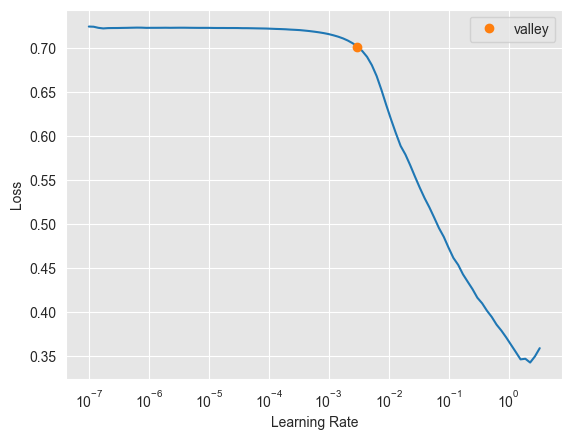

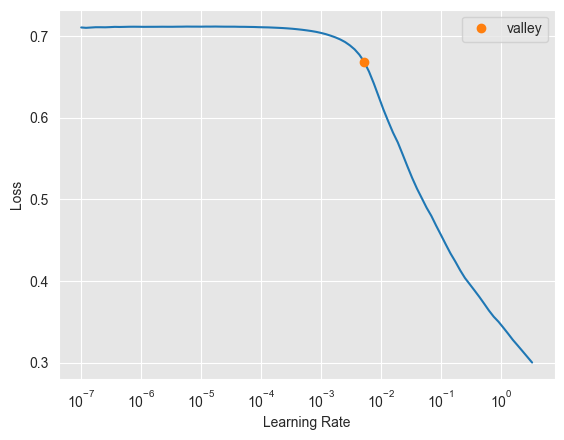

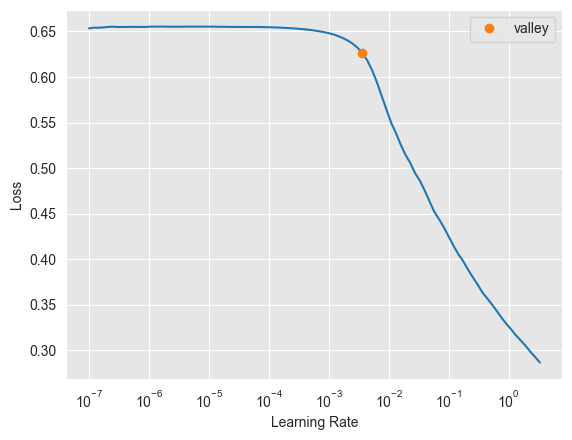

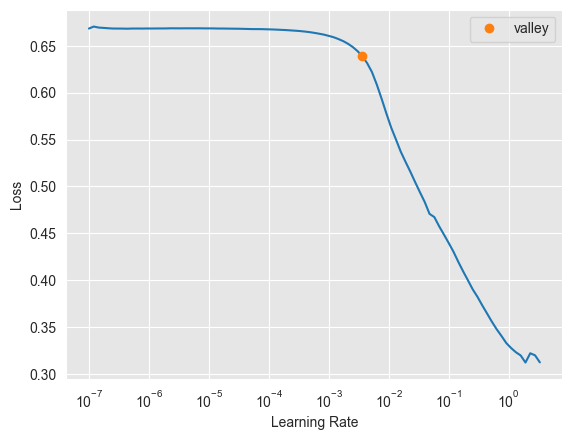

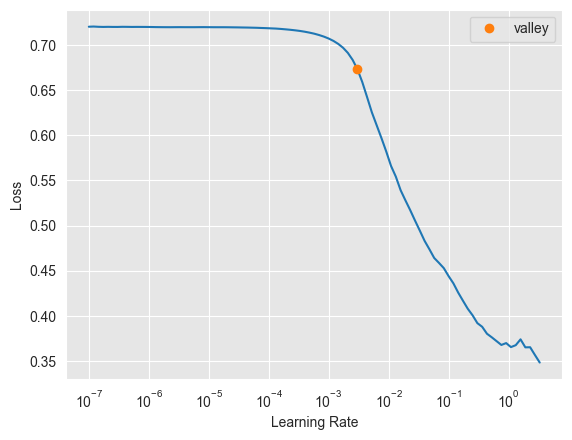

...

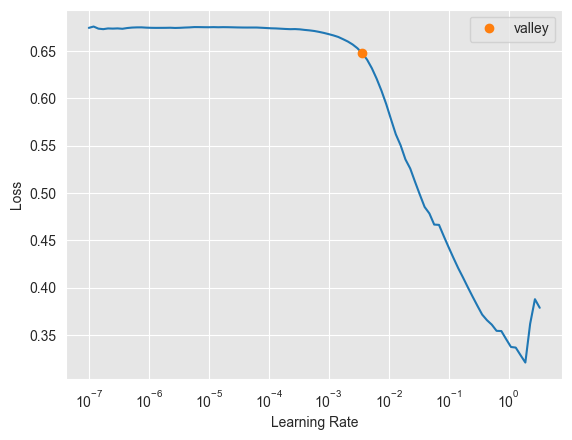

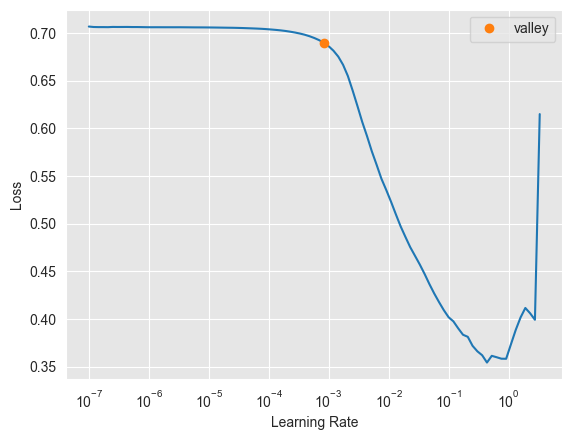

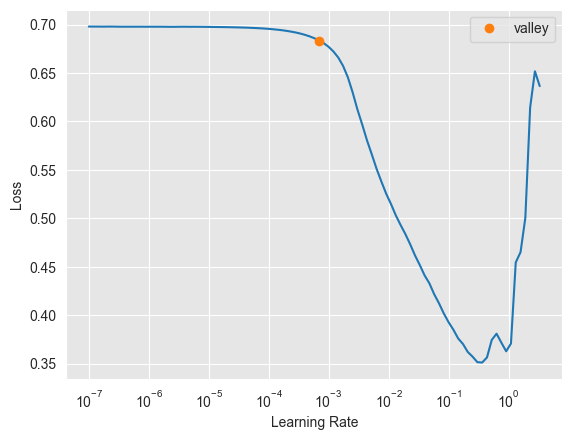

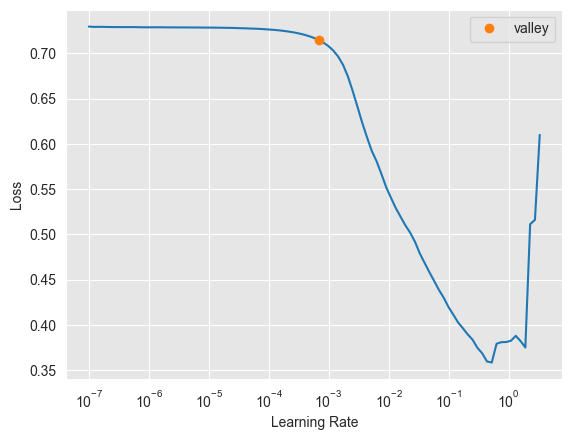

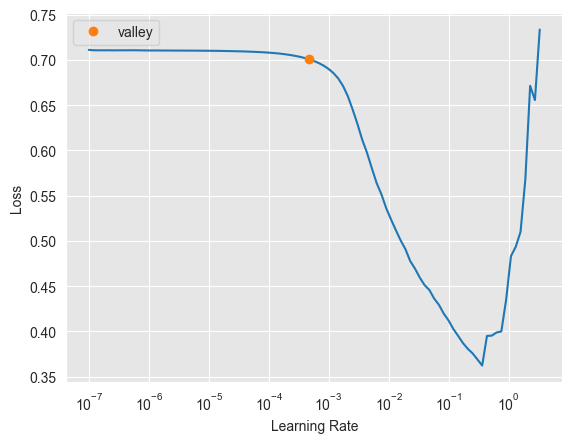

In [10]:
wandb.agent(sweep_id, train, count=60)